<a href="https://colab.research.google.com/github/vreskmarko1/Diplomski/blob/main/Primjena%20algoritama%20strojnog%20u%C4%8Denja%20za%20pobolj%C5%A1anje%20energetske%20u%C4%8Dinkovitosti%20zgrada.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Pretprocesiranje podataka**

In [ ]:
#Uvoz biblioteka
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

#Priprema podataka
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler

#Odabir najznačajnijih varijabli
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Lasso

#Linearna regresija
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

#KNN
from sklearn.neighbors import KNeighborsRegressor

#Stablo odlučivanja
from sklearn.tree import DecisionTreeRegressor, plot_tree

#Neuronske mreže
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.base import BaseEstimator, RegressorMixin
from tensorflow.keras.regularizers import l2
!pip install keras-tuner
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam

#Evaluacijske metrike
from sklearn.metrics import  mean_absolute_percentage_error, mean_absolute_error, r2_score, mean_squared_error, explained_variance_score
from sklearn.inspection import permutation_importance

#Grafički prikazi
from sklearn.model_selection import learning_curve
import shap
import random

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.4/129.4 kB 1.3 MB/s eta 0:00:00


In [ ]:
#Preuzimanje skupa/csv datoteke

id_datoteke = "1ropAebQ8-XxwAw569ttFJNn3AWj10eN_"
status = os.system(f'gdown {id_datoteke}')
preuzete_datoteke = [f for f in os.listdir() if os.path.isfile(f)]

if status == 0 and len(preuzete_datoteke) > 0:
    print("Skup je uspješno preuzet.")
else:
    print("Pogreška pri preuzimanju skupa.")

Skup je uspješno preuzet.


In [ ]:
#Učitavanje skupa podataka
df = pd.read_csv("energy_efficiency.csv")

In [ ]:
# Definiranje novih značajki na temelju postoječih

df['Building Volume'] = df['surface_area'] * df['overall_height']
df['Wall-to-Surface Ratio'] = df['wall_area'] / df['surface_area']
df['Roof-to-Surface Ratio'] = df['roof_area'] / df['surface_area']
df['Wall-to-Roof Ratio'] = df['wall_area'] / df['roof_area']
df['Glazing-to-Surface Ratio'] = df['glazing_area'] / df['surface_area']
df['Height-to-Compactness Ratio'] = df['overall_height'] / df['relative_compactness']


In [ ]:
#Prikaz prvih 10 redaka skupa podataka
df.head(10)

,relative_compactness,surface_area,wall_area,roof_area,overall_height,orientation,glazing_area,glazing_area_distribution,heating_load,cooling_load,Building Volume,Wall-to-Surface Ratio,Roof-to-Surface Ratio,Wall-to-Roof Ratio,Glazing-to-Surface Ratio,Height-to-Compactness Ratio
0,0.98,514.5,294.0,110.25,7.0,2.0,0.0,0.0,15.55,21.33,3601.5,0.571429,0.214286,2.666667,0.0,7.142857
1,0.98,514.5,294.0,110.25,7.0,3.0,0.0,0.0,15.55,21.33,3601.5,0.571429,0.214286,2.666667,0.0,7.142857
2,0.98,514.5,294.0,110.25,7.0,4.0,0.0,0.0,15.55,21.33,3601.5,0.571429,0.214286,2.666667,0.0,7.142857
3,0.98,514.5,294.0,110.25,7.0,5.0,0.0,0.0,15.55,21.33,3601.5,0.571429,0.214286,2.666667,0.0,7.142857
4,0.90,563.5,318.5,122.50,7.0,2.0,0.0,0.0,20.84,28.28,3944.5,0.565217,0.217391,2.600000,0.0,7.777778
5,0.90,563.5,318.5,122.50,7.0,3.0,0.0,0.0,21.46,25.38,3944.5,0.565217,0.217391,2.600000,0.0,7.777778
6,0.90,563.5,318.5,122.50,7.0,4.0,0.0,0.0,20.71,25.16,3944.5,0.565217,0.217391,2.600000,0.0,7.777778
7,0.90,563.5,318.5,122.50,7.0,5.0,0.0,0.0,19.68,29.60,3944.5,0.565217,0.217391,2.600000,0.0,7.777778
8,0.86,588.0,294.0,147.00,7.0,2.0,0.0,0.0,19.50,27.30,4116.0,0.500000,0.250000,2.000000,0.0,8.139535
9,0.86,588.0,294.0,147.00,7.0,3.0,0.0,0.0,19.95,21.97,4116.0,0.500000,0.250000,2.000000,0.0,8.139535


In [ ]:
#Prikaz naziva svih stupaca i broja redova tih stupaca
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   relative_compactness         768 non-null    float64
 1   surface_area                 768 non-null    float64
 2   wall_area                    768 non-null    float64
 3   roof_area                    768 non-null    float64
 4   overall_height               768 non-null    float64
 5   orientation                  768 non-null    float64
 6   glazing_area                 768 non-null    float64
 7   glazing_area_distribution    768 non-null    float64
 8   heating_load                 768 non-null    float64
 9   cooling_load                 768 non-null    float64
 10  Building Volume              768 non-null    float64
 11  Wall-to-Surface Ratio        768 non-null    float64
 12  Roof-to-Surface Ratio        768 non-null    float64
 13  Wall-to-Roof Ratio  

In [ ]:
#Deskriptivna statistika odabranog skupa podataka
df.describe()

,relative_compactness,surface_area,wall_area,roof_area,overall_height,orientation,glazing_area,glazing_area_distribution,heating_load,cooling_load,Building Volume,Wall-to-Surface Ratio,Roof-to-Surface Ratio,Wall-to-Roof Ratio,Glazing-to-Surface Ratio,Height-to-Compactness Ratio
count,768.000000,768.000000,768.000000,768.000000,768.00000,768.000000,768.000000,768.00000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,0.764167,671.708333,318.500000,176.604167,5.25000,3.500000,0.234375,2.81250,22.307195,24.587760,3394.270833,0.481049,0.259475,1.958333,0.000355,6.734729
std,0.105777,88.086116,43.626481,45.165950,1.75114,1.118763,0.133221,1.55096,10.090204,9.513306,821.871001,0.082303,0.041151,0.667474,0.000210,1.634200
min,0.620000,514.500000,245.000000,110.250000,3.50000,2.000000,0.000000,0.00000,6.010000,10.900000,2401.000000,0.357143,0.185185,1.111111,0.000000,4.729730
25%,0.682500,606.375000,294.000000,140.875000,3.50000,2.750000,0.100000,1.75000,12.992500,15.620000,2636.812500,0.414516,0.227425,1.416667,0.000157,5.245389
50%,0.750000,673.750000,318.500000,183.750000,5.25000,3.500000,0.250000,3.00000,18.950000,22.080000,3215.625000,0.477273,0.261364,1.833333,0.000352,6.394009
75%,0.830000,741.125000,343.000000,220.500000,7.00000,4.250000,0.400000,4.00000,31.667500,33.132500,4158.875000,0.545151,0.292742,2.400000,0.000527,8.238798
max,0.980000,808.500000,416.500000,220.500000,7.00000,5.000000,0.400000,5.00000,43.100000,48.030000,4630.500000,0.629630,0.321429,3.400000,0.000777,9.210526


In [ ]:
#Provjera nedostajućih vrijednosti
print(df.isnull().sum())

relative_compactness           0
surface_area                   0
wall_area                      0
roof_area                      0
overall_height                 0
orientation                    0
glazing_area                   0
glazing_area_distribution      0
heating_load                   0
cooling_load                   0
Building Volume                0
Wall-to-Surface Ratio          0
Roof-to-Surface Ratio          0
Wall-to-Roof Ratio             0
Glazing-to-Surface Ratio       0
Height-to-Compactness Ratio    0
dtype: int64


In [ ]:
#Broj jedinstvenih vrijednosti (rezultati će se koristiti za pretvaranje značajki u kategorijske)
jedinstvene_vrijednosti = df.nunique()
print(jedinstvene_vrijednosti)

relative_compactness            12
surface_area                    12
wall_area                        7
roof_area                        4
overall_height                   2
orientation                      4
glazing_area                     4
glazing_area_distribution        6
heating_load                   587
cooling_load                   636
Building Volume                 12
Wall-to-Surface Ratio           12
Roof-to-Surface Ratio           12
Wall-to-Roof Ratio              12
Glazing-to-Surface Ratio        37
Height-to-Compactness Ratio     12
dtype: int64


In [ ]:
#Pretvaranje varijabli overall_height, orientation i glazing_area_distribution u kategorijske
kategorijske_var = [
    'overall_height',
    'orientation',
    'glazing_area_distribution'
]

visina_map = {3.5: 'low', 7.0: 'high'}
orientation_map = {2.0: 'north', 3.0: 'south', 4.0: 'east', 5.0: 'west'}
glazing_area_distribution_map = {
    0: 'none',
    1: 'dist_1',
    2: 'dist_2',
    3: 'dist_3',
    4: 'dist_4',
    5: 'dist_5'
}

df['overall_height'] = df['overall_height'].map(visina_map)
df['orientation'] = df['orientation'].map(orientation_map)
df['glazing_area_distribution'] = df['glazing_area_distribution'].map(glazing_area_distribution_map)


In [ ]:
#Tipovi značajki nakon što su izvedene transformacije na odabranim značajkama
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   relative_compactness         768 non-null    float64
 1   surface_area                 768 non-null    float64
 2   wall_area                    768 non-null    float64
 3   roof_area                    768 non-null    float64
 4   overall_height               768 non-null    object 
 5   orientation                  768 non-null    object 
 6   glazing_area                 768 non-null    float64
 7   glazing_area_distribution    768 non-null    object 
 8   heating_load                 768 non-null    float64
 9   cooling_load                 768 non-null    float64
 10  Building Volume              768 non-null    float64
 11  Wall-to-Surface Ratio        768 non-null    float64
 12  Roof-to-Surface Ratio        768 non-null    float64
 13  Wall-to-Roof Ratio  

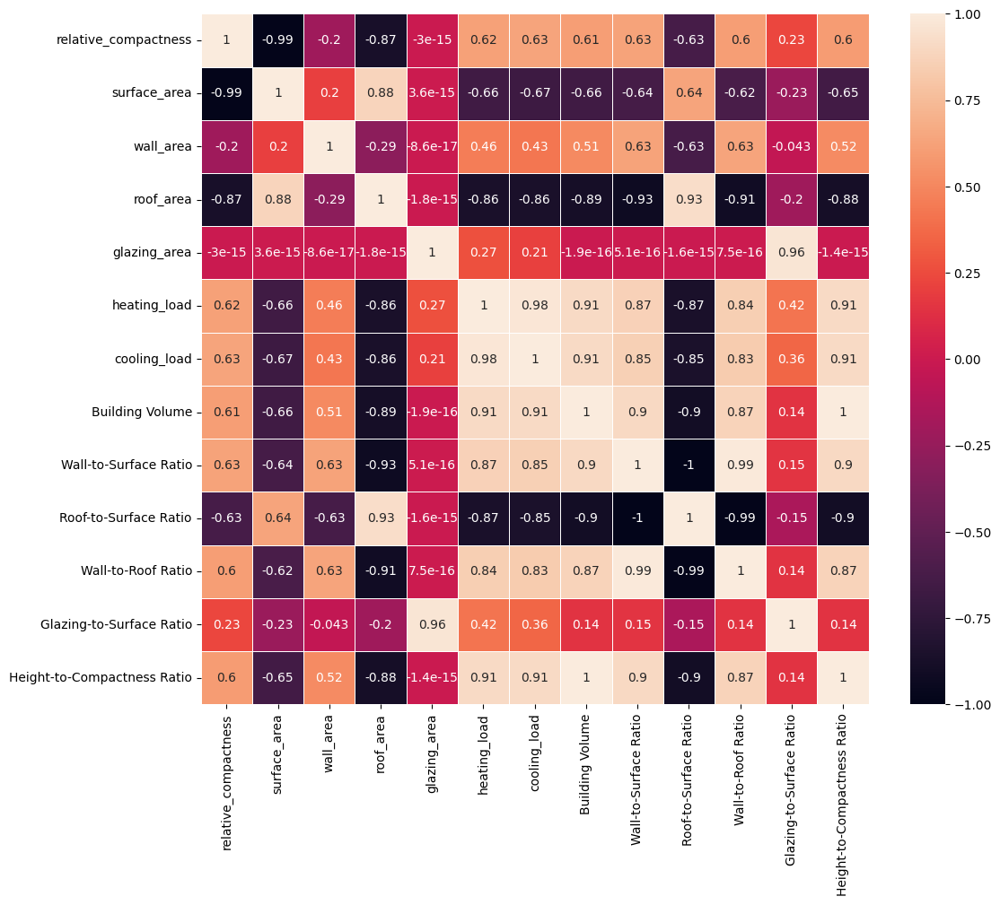

In [ ]:
#dijagram raspršenja
kor = df.select_dtypes(include=['int64', 'float64']).corr(method='pearson')
plt.figure(figsize=(12, 10))
sns.heatmap(kor, annot=True, linewidths=0.5)
plt.show()

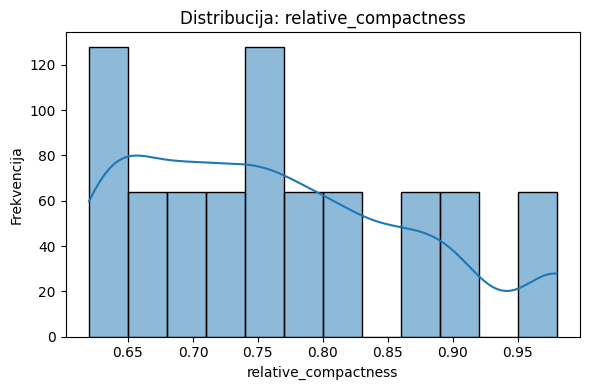

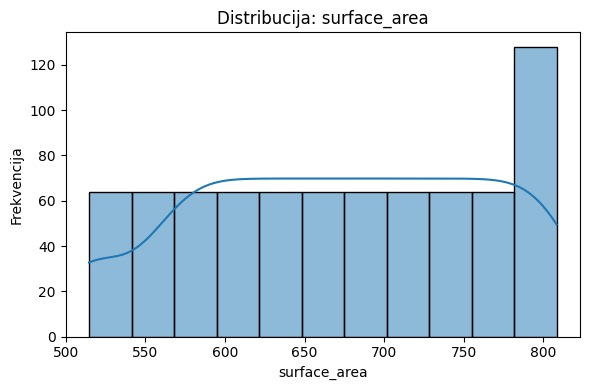

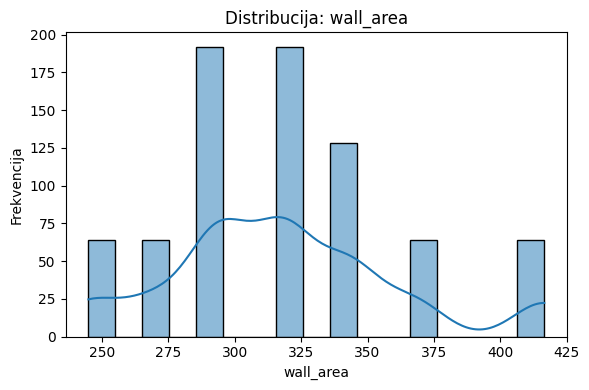

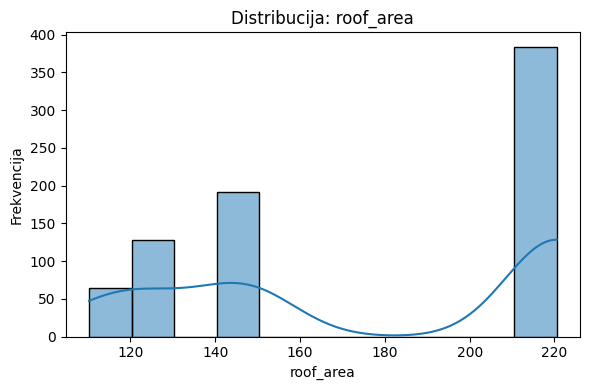

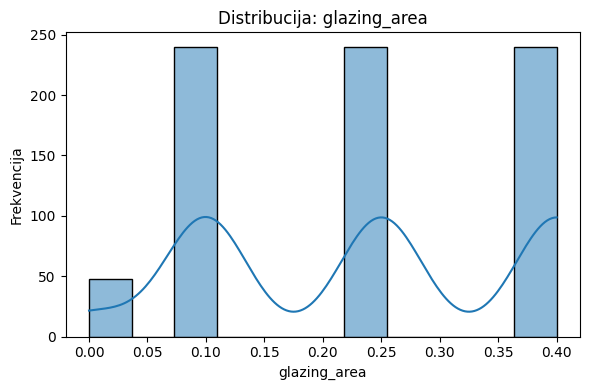

...

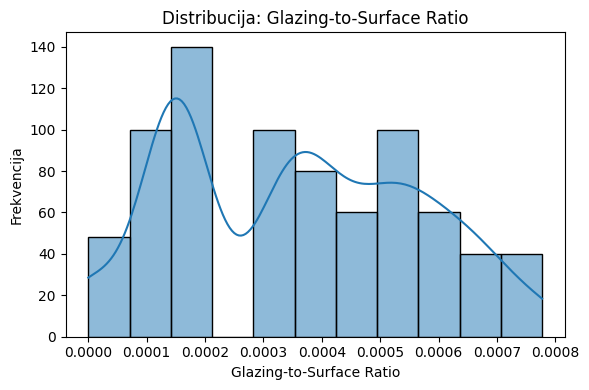

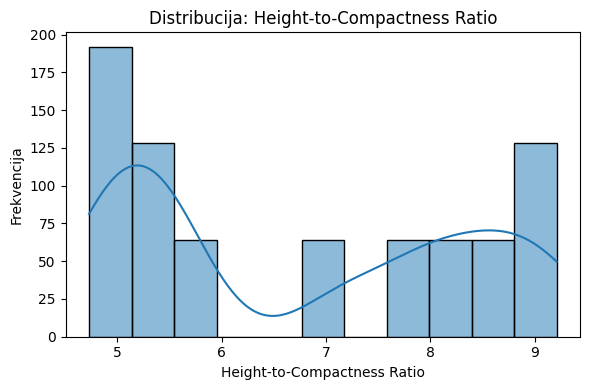

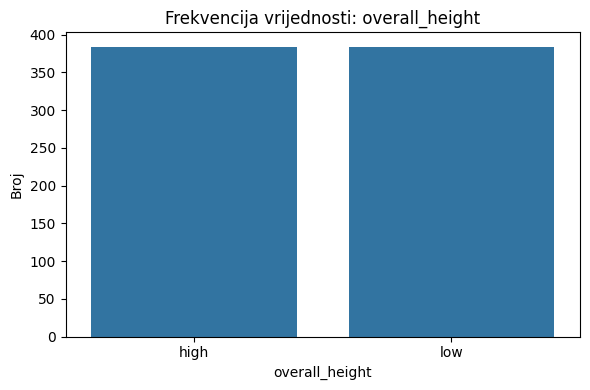

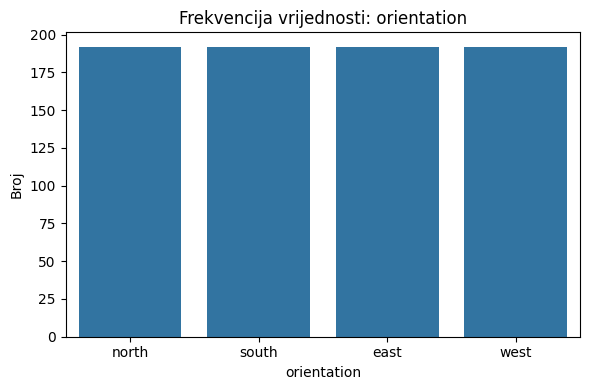

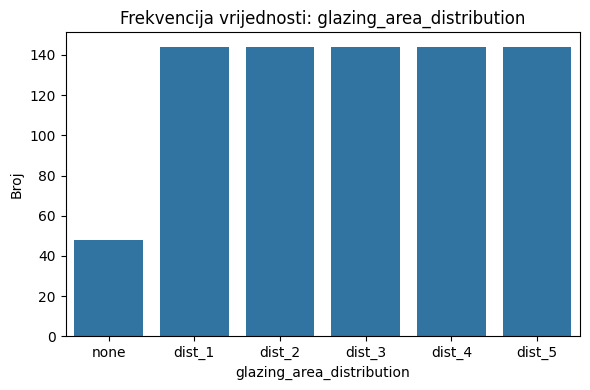

In [ ]:
#Vizualizacija raspodjele numeričkih i kategorijalnih varijabli
num_stupci = df.select_dtypes(include=['float64', 'int64']).columns
kat_stupci = df.select_dtypes(include=['object']).columns

for stu in num_stupci:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[stu], kde=True)
    plt.title(f'Distribucija: {stu}')
    plt.xlabel(stu)
    plt.ylabel('Frekvencija')
    plt.tight_layout()
    plt.show()

for stu in kat_stupci:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=stu, data=df)
    plt.title(f'Frekvencija vrijednosti: {stu}')
    plt.xlabel(stu)
    plt.ylabel('Broj')
    plt.tight_layout()
    plt.show()


# **Priprema podataka**

---



In [ ]:
#Brisanje duplikata
df.drop_duplicates(keep='first', inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   relative_compactness         768 non-null    float64
 1   surface_area                 768 non-null    float64
 2   wall_area                    768 non-null    float64
 3   roof_area                    768 non-null    float64
 4   overall_height               768 non-null    object 
 5   orientation                  768 non-null    object 
 6   glazing_area                 768 non-null    float64
 7   glazing_area_distribution    768 non-null    object 
 8   heating_load                 768 non-null    float64
 9   cooling_load                 768 non-null    float64
 10  Building Volume              768 non-null    float64
 11  Wall-to-Surface Ratio        768 non-null    float64
 12  Roof-to-Surface Ratio        768 non-null    float64
 13  Wall-to-Roof Ratio  

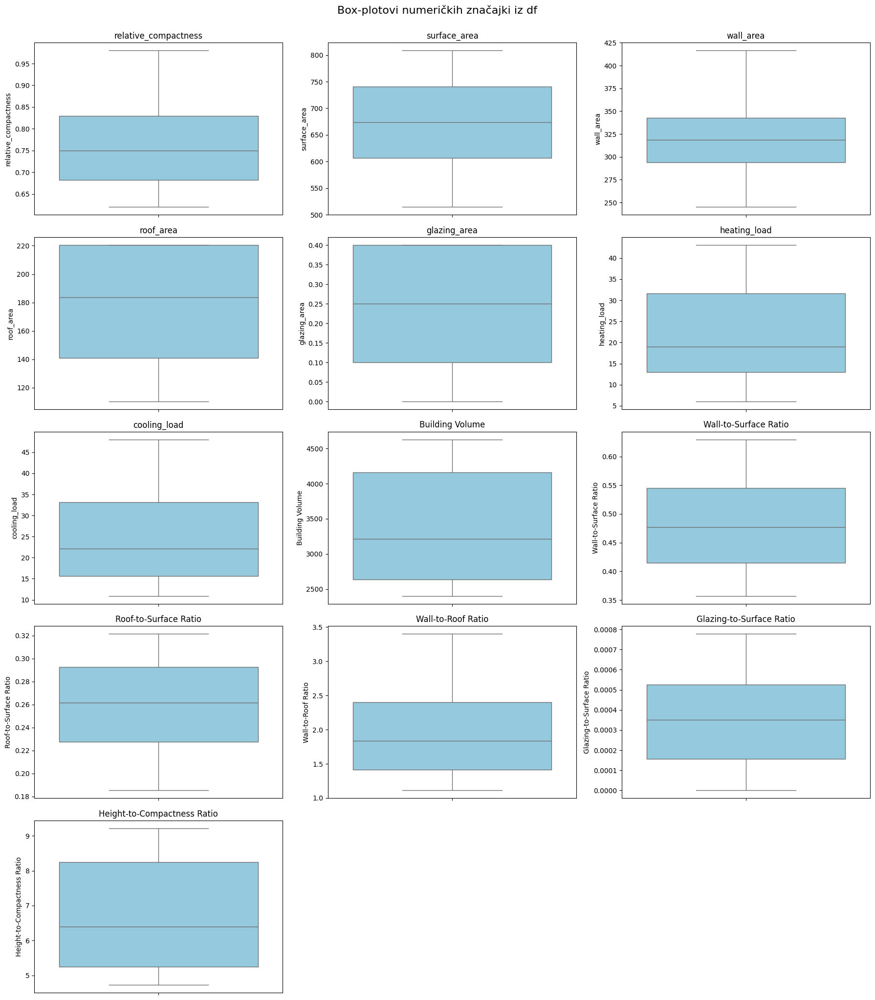

In [ ]:
#Box-plotovi
numericki = df.select_dtypes(include=['int64', 'float64']).columns
num_svojstva = len(numericki)
red = (num_svojstva // 3) + 1
stup = 3
plt.figure(figsize=(18, red * 4))

for i, stu in enumerate(numericki):
    plt.subplot(red, stup, i + 1)
    sns.boxplot(y=df[stu], color='skyblue')
    plt.title(stu, fontsize=12)
    plt.tight_layout()

plt.suptitle('Box-plotovi numeričkih značajki iz df', fontsize=16, y=1.02)
plt.show()

In [ ]:
#Provjera stršila

outlier_mask = pd.Series([False] * len(df), index=df.index)

for stu in numericki:
    Q1 = df[stu].quantile(0.25)
    Q3 = df[stu].quantile(0.75)
    IQR = Q3 - Q1

    donja_granica = Q1 - 1.5 * IQR
    gornja_granica = Q3 + 1.5 * IQR

    outliers_stu = (df[stu] < donja_granica) | (df[stu] > gornja_granica)
    outlier_mask = outlier_mask | outliers_stu

print(f" Broj stršila prema IQR metodi: {outlier_mask.sum()}")


 Broj stršila prema IQR metodi: 0


In [ ]:
#Razdvajanje X značajki i ciljnih varijabli
X = df.drop(columns=['heating_load', 'cooling_load'])
y_heating = df['heating_load']
y_cooling = df['cooling_load']

In [ ]:
#Podjela na skup za testiranje i treniranje u omjeru 30%-70%

X_train, X_test, y_train_heating, y_test_heating, y_train_cooling, y_test_cooling = train_test_split(
    X,
    y_heating,
    y_cooling,
    test_size=0.30,
    random_state=42
)


In [ ]:
#Provjera nedostajućih vrijednosti na skupu za treniranje
print(X_train.isnull().sum())

relative_compactness           0
surface_area                   0
wall_area                      0
roof_area                      0
overall_height                 0
orientation                    0
glazing_area                   0
glazing_area_distribution      0
Building Volume                0
Wall-to-Surface Ratio          0
Roof-to-Surface Ratio          0
Wall-to-Roof Ratio             0
Glazing-to-Surface Ratio       0
Height-to-Compactness Ratio    0
dtype: int64


In [ ]:
#Provjera nedostajućih vrijednosti na skupu za testiranje
print(X_test.isna().sum())

relative_compactness           0
surface_area                   0
wall_area                      0
roof_area                      0
overall_height                 0
orientation                    0
glazing_area                   0
glazing_area_distribution      0
Building Volume                0
Wall-to-Surface Ratio          0
Roof-to-Surface Ratio          0
Wall-to-Roof Ratio             0
Glazing-to-Surface Ratio       0
Height-to-Compactness Ratio    0
dtype: int64


In [ ]:
#Enkodiranje kategorijskih značajki
kategorijska_svojstva = ['orientation', 'overall_height', 'glazing_area_distribution']

onehot_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False, dtype=int)
X_train_encoded = onehot_encoder.fit_transform(X_train[kategorijska_svojstva])
X_test_encoded = onehot_encoder.transform(X_test[kategorijska_svojstva])

X_train_encoded_df = pd.DataFrame(X_train_encoded, columns=onehot_encoder.get_feature_names_out(kategorijska_svojstva))
X_test_encoded_df = pd.DataFrame(X_test_encoded, columns=onehot_encoder.get_feature_names_out(kategorijska_svojstva))

print(X_train_encoded_df.head())

   orientation_east  orientation_north  orientation_south  orientation_west  \
0                 1                  0                  0                 0   
1                 0                  0                  0                 1   
2                 0                  0                  1                 0   
3                 0                  0                  0                 1   
4                 1                  0                  0                 0   

   overall_height_high  overall_height_low  glazing_area_distribution_dist_1  \
0                    0                   1                                 1   
1                    0                   1                                 0   
2                    1                   0                                 0   
3                    1                   0                                 1   
4                    1                   0                                 0   

   glazing_area_distribution_dist_2  glazing

In [ ]:
# Skaliranje numeričkih varijabli

numericka_svojstva = X_train.select_dtypes(include=['int64', 'float64']).columns
scaler = MinMaxScaler()

X_train_scaled = scaler.fit_transform(X_train[numericka_svojstva])
X_test_scaled = scaler.transform(X_test[numericka_svojstva])

X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=numericka_svojstva)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=numericka_svojstva)

X_train_encoded_df = X_train_encoded_df.reset_index(drop=True)
X_train_scaled_df = X_train_scaled_df.reset_index(drop=True)
X_test_encoded_df = X_test_encoded_df.reset_index(drop=True)
X_test_scaled_df = X_test_scaled_df.reset_index(drop=True)

X_train_final = pd.concat([X_train_encoded_df, X_train_scaled_df], axis=1)
X_test_final = pd.concat([X_test_encoded_df, X_test_scaled_df], axis=1)

print(X_train_final.head(10))



   orientation_east  orientation_north  orientation_south  orientation_west  \
0                 1                  0                  0                 0   
1                 0                  0                  0                 1   
2                 0                  0                  1                 0   
3                 0                  0                  0                 1   
4                 1                  0                  0                 0   
5                 0                  0                  1                 0   
6                 0                  1                  0                 0   
7                 1                  0                  0                 0   
8                 1                  0                  0                 0   
9                 1                  0                  0                 0   

   overall_height_high  overall_height_low  glazing_area_distribution_dist_1  \
0                    0                   1        

In [ ]:
#Osnovne informacije o podacima
X_train_final.info()
X_test_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 537 entries, 0 to 536
Data columns (total 23 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   orientation_east                  537 non-null    int64  
 1   orientation_north                 537 non-null    int64  
 2   orientation_south                 537 non-null    int64  
 3   orientation_west                  537 non-null    int64  
 4   overall_height_high               537 non-null    int64  
 5   overall_height_low                537 non-null    int64  
 6   glazing_area_distribution_dist_1  537 non-null    int64  
 7   glazing_area_distribution_dist_2  537 non-null    int64  
 8   glazing_area_distribution_dist_3  537 non-null    int64  
 9   glazing_area_distribution_dist_4  537 non-null    int64  
 10  glazing_area_distribution_dist_5  537 non-null    int64  
 11  glazing_area_distribution_none    537 non-null    int64  
 12  relative

# **Odabir top 10 varijabli za model**


In [ ]:
# Top 11 varijabli za model korištenjem različitih metoda
def get_top_svojstva(X, y, k=10):
    rezultati = {}

    # 1. F-test
    f_test = SelectKBest(score_func=f_regression, k=k)
    f_test.fit(X, y)
    rezultati['F-test'] = X.columns[f_test.get_support()].tolist()

    # 2. Mutual Information
    mi = SelectKBest(score_func=mutual_info_regression, k=k)
    mi.fit(X, y)
    rezultati['Mutual Information'] = X.columns[mi.get_support()].tolist()

    # 3. Random Forest
    rf = RandomForestRegressor(random_state=42)
    rf.fit(X, y)
    rf_svojstva = pd.Series(rf.feature_importances_, index=X.columns)
    rezultati['Random Forest'] = rf_svojstva.sort_values(ascending=False).head(k).index.tolist()

    # 4. Lasso
    lasso = Lasso(alpha=0.01, max_iter=10000)
    lasso.fit(X, y)
    lasso_svojstva = pd.Series(np.abs(lasso.coef_), index=X.columns)
    rezultati['Lasso'] = lasso_svojstva.sort_values(ascending=False).head(k).index.tolist()

    return rezultati

y_heating = df['heating_load']
y_cooling = df['cooling_load']

print("Top 10 varijabli za heating_load:")
heating_svojstva = get_top_svojstva(X_train_final, y_train_heating)
for metoda, svojstva in heating_svojstva.items():
    print(f"{metoda}: {svojstva}")

print("\nTop 10 varijabli za cooling_load:")
cooling_svojstva = get_top_svojstva(X_train_final, y_train_cooling)
for metoda, svojstva in cooling_svojstva.items():
    print(f"{metoda}: {svojstva}")

Top 10 varijabli za heating_load:
F-test: ['overall_height_high', 'overall_height_low', 'relative_compactness', 'surface_area', 'roof_area', 'Building Volume', 'Wall-to-Surface Ratio', 'Roof-to-Surface Ratio', 'Wall-to-Roof Ratio', 'Height-to-Compactness Ratio']
Mutual Information: ['relative_compactness', 'surface_area', 'wall_area', 'roof_area', 'Building Volume', 'Wall-to-Surface Ratio', 'Roof-to-Surface Ratio', 'Wall-to-Roof Ratio', 'Glazing-to-Surface Ratio', 'Height-to-Compactness Ratio']
Random Forest: ['relative_compactness', 'Wall-to-Surface Ratio', 'Building Volume', 'Wall-to-Roof Ratio', 'Glazing-to-Surface Ratio', 'Height-to-Compactness Ratio', 'overall_height_high', 'surface_area', 'Roof-to-Surface Ratio', 'roof_area']
Lasso: ['Building Volume', 'Glazing-to-Surface Ratio', 'glazing_area_distribution_none', 'Wall-to-Roof Ratio', 'Wall-to-Surface Ratio', 'roof_area', 'glazing_area_distribution_dist_4', 'glazing_area_distribution_dist_2', 'glazing_area_distribution_dist_3', '

# **Funkcije**

 ## **Zajedničke funkcije**

In [ ]:
#Funkcija za provjeru overfittinga
def provjera_overfittinga(model, X_train_final, X_test_final, y_train, y_test):

    y_train_pred = model.predict(X_train_final)
    y_test_pred = model.predict(X_test_final)

    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)

    print(f"Train R²: {train_r2:.4f}")
    print(f"Test R²: {test_r2:.4f}")

In [ ]:
#Prikaz krivulje učenja
def prikaz_krivulje_ucenja(model, X, y, naslov):

    train_vel, train_rezultat, test_rezultat = learning_curve(
        estimator=model,
        X=X,
        y=y,
        cv=5,
        scoring='r2',
        train_sizes=np.linspace(0.1, 1.0, 10),
        n_jobs=-1
    )

    train_prosjek = np.mean(train_rezultat, axis=1)
    test_prosjek = np.mean(test_rezultat, axis=1)

    train_std = np.std(train_rezultat, axis=1)
    test_std = np.std(test_rezultat, axis=1)

    plt.figure(figsize=(10,6))

    plt.plot(train_vel, train_prosjek, marker='o', label='Train')
    plt.plot(train_vel, test_prosjek, marker='o', label='Test')

    plt.fill_between(
        train_vel,
        train_prosjek - train_std,
        train_prosjek + train_std,
        alpha=0.2
    )

    plt.fill_between(
        train_vel,
        test_prosjek - test_std,
        test_prosjek + test_std,
        alpha=0.2
    )

    plt.title(naslov)
    plt.xlabel("Veličina skupa za trening")
    plt.ylabel("R² rezultat")

    plt.legend()
    plt.grid()
    plt.show()


In [ ]:
#Evaluacija modela pomoću metrika mae, mse, rmse, r2, mape i evs
def evaluacija_modela(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    evs = explained_variance_score(y_test, y_pred)

    return  y_pred, mae, mse, rmse, r2, mape, evs

In [ ]:
#Ispis evaluacijskih metrika
def ispis_rezultata(mae, mse, rmse, r2, mape, evs):
    print(f"MAE: {mae:.4f}")
    print(f"MSE: {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"R²: {r2:.4f}")
    print(f"MAPE: {mape:.4f}")
    print(f"EVS: {evs:.4f}")

In [ ]:
#Prikaz stvarnih i predviđenih vrijednosti
def prikaz_stvarnih_i_predikcija(y_stvarne, y_predikcije, naslov):

    plt.figure(figsize=(8, 6))

    plt.scatter(y_stvarne, y_predikcije, alpha=0.6)

    plt.plot(
        [y_stvarne.min(), y_stvarne.max()],
        [y_stvarne.min(), y_stvarne.max()],
        color='red',
        linestyle='--'
    )

    plt.xlabel("Stvarne vrijednosti")
    plt.ylabel("Predikcije")
    plt.title(naslov)
    plt.grid(True)
    plt.show()

In [ ]:
#Izračun permutacijske važnosti
def izracun_permutacijske_vaznosti(model, X_test, y_test, nazivi_znacajki):

    rezultati = permutation_importance(
        model,
        X_test,
        y_test,
        scoring='r2',
        n_repeats=10,
        random_state=42
    )

    vaznost_df = pd.DataFrame({
        'Značajka': nazivi_znacajki,
        'Važnost': rezultati.importances_mean,
        'Standardna devijacija': rezultati.importances_std
    })

    vaznost_df = vaznost_df.sort_values(by='Važnost', ascending=False)
    print(vaznost_df)

    return vaznost_df


In [ ]:
#Graf permutacijske važnosti
def graf_permutacijske_vaznosti(vaznost_df, naslov):

    plt.figure(figsize=(10, 6))

    plt.barh(
        vaznost_df['Značajka'],
        vaznost_df['Važnost'],
        xerr=vaznost_df['Standardna devijacija']
    )

    plt.xlabel('Permutacijska važnost')
    plt.title(naslov)
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

In [ ]:
#Kreiranje SHAP vrijednosti za interpretaciju modela
def kreiraj_shap_vrijednosti(model, model_tip, X_train, X_test):

    if model_tip== "linearni" or model_tip == "neuronske":
        explainer = shap.Explainer(model, X_train)
        shap_vrijednosti = explainer(X_test)

    elif model_tip == "knn":
        explainer = shap.KernelExplainer(model.predict, X_train.values)
        shap_vrijednosti = explainer.shap_values(X_test.values, nsamples="auto")

    elif model_tip == "stablo":
        explainer = shap.TreeExplainer(model)
        shap_vrijednosti = explainer.shap_values(X_test.values)

    return explainer, shap_vrijednosti

In [ ]:
#Kreiranje shap summary bar dijagrama
def shap_summary_bar_dijagram(shap_vrijednosti, X_test, naslov):

    shap.summary_plot(
        shap_vrijednosti,
        X_test,
        feature_names=X_test.columns,
        plot_type="bar",
        show=False
    )

    ax = plt.gca()
    ax.set_title(naslov, fontsize=14)
    plt.show()

In [ ]:
#Kreiranje shapbeeswarm dijagrama
def shap_beeswarm_dijagram(shap_vrijednosti, X_test, naslov):

    shap.summary_plot(shap_vrijednosti, X_test, show=False)

    ax = plt.gca()
    ax.set_title(naslov, fontsize=14)
    plt.show()

In [ ]:
#Shap waterfall dijagram
def shap_waterfall_dijagram(explainer, shap_vrijednosti, model_tip, X_test, naslov, broj_primjera=5):

    slucajni_indeksi = random.sample(range(len(X_test)), broj_primjera)

    if model_tip == "knn" or model_tip == "stablo":
        shap_vrijednosti = explainer(X_test)

    shap_vrijednosti.feature_names = X_test.columns.tolist()

    for i in slucajni_indeksi:
        print(f"\nPrikaz za instancu #{i}")
        shap.plots.waterfall(shap_vrijednosti[i],show=False)

        ax = plt.gca()

        labela = [label.get_text().replace("Feature ","")
            for label in ax.get_yticklabels()
        ]

        ax.set_yticklabels(labela)
        ax.set_title(f"{naslov} - Instanca #{i}",fontsize=14)
        plt.show()

In [ ]:
#Optimizacija modela
def optimiziraj_model(model, param_grid, X_train, y_train, cv=5, scoring='r2'):

    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        cv=cv,
        scoring=scoring,
        n_jobs=-1
    )

    grid_search.fit(X_train, y_train)

    return grid_search.best_estimator_, grid_search.best_params_, grid_search.best_score_

## **Funkcije-Linearna regresija**

In [ ]:
# Grafički prikaz koeficijenata značajki u modelu linearne regresije
def koeficijenti_značajki (model, tip):
  koeficijenti = model.coef_
  nazivi_znacajki = X_train_final.columns

  koef_df = pd.DataFrame({
      'Značajka': nazivi_znacajki,
      'Koeficijent': koeficijenti
  }).sort_values(by='Koeficijent', ascending=False)

  plt.figure(figsize=(10, 6))
  plt.barh(koef_df['Značajka'], koef_df['Koeficijent'])
  plt.gca().invert_yaxis()
  plt.axvline(x=0, color='gray', linestyle='--')
  plt.xlabel('Vrijednost koeficijenta')
  plt.title('Koeficijenti značajki u modelu Linearne regresije' + tip)
  plt.tight_layout()
  plt.show()

## **Funkcije-Stablo odlučivanja**

In [ ]:
#Prikaz  optimiziranog Stabla odlučivanja
def prikaz_stabla(model, naslov):
  plt.figure(figsize=(20, 10))
  plot_tree(
      model,
      feature_names=X_train_final.columns,
      filled=True,
      rounded=True,
      fontsize=10
  )
  plt.title(naslov)
  plt.show()

## **Funkcije-Neuronske mreže**

In [ ]:
#Kreiranje neuronske mreže
def treniraj_neuronsku_mrezu(X_train_final, y_train_data, X_test_final, y_test_data, naziv_treninga):

    X_train, X_val, y_train, y_val = train_test_split(
        X_train_final,
        y_train_data,
        test_size=0.2,
        random_state=42,
        shuffle=True
    )

    mae_lista = []
    mse_lista = []
    rmse_lista = []
    r2_lista = []
    mape_lista = []
    evs_lista = []

    najbolji_model = None
    najbolja_povijest = None
    najbolji_y_pred = None
    najbolji_val_loss = np.inf

    for i in range(5):

        print(f"\n===== {naziv_treninga} Trening {i+1}/5 =====")

        tf.keras.backend.clear_session()

        model = Sequential([

            Input(shape=(X_train.shape[1],)),
            Dense(64, activation='relu'),
            BatchNormalization(),
            Dropout(0.1),

            Dense(32, activation='relu'),
            BatchNormalization(),
            Dropout(0.1),
            Dense(1)
        ])

        model.compile(
            optimizer='adam',
            loss='mse',
            metrics=['mae']
        )

        early_stop = EarlyStopping(
            monitor='val_loss',
            patience=10,
            restore_best_weights=True
        )

        povijest = model.fit(
            X_train,
            y_train,
            validation_data=(X_val, y_val),
            epochs=200,
            batch_size=32,
            callbacks=[early_stop],
            verbose=1
        )

        trenutni_val_loss = min(povijest.history['val_loss'])

        print(f"Najbolji val_loss: {trenutni_val_loss:.5f}")

        (
            y_pred_current,
            mae_current,
            mse_current,
            rmse_current,
            r2_current,
            mape_current,
            evs_current
        ) = evaluacija_modela(
            model,
            X_test_final,
            y_test_data
        )

        y_pred_current = y_pred_current.flatten()

        mae_lista.append(mae_current)
        mse_lista.append(mse_current)
        rmse_lista.append(rmse_current)
        r2_lista.append(r2_current)
        mape_lista.append(mape_current)
        evs_lista.append(evs_current)

        if trenutni_val_loss < najbolji_val_loss:

            najbolji_val_loss = trenutni_val_loss
            najbolji_model = model
            najbolja_povijest = povijest
            najbolji_y_pred = y_pred_current

    return (
        X_train,
        X_val,
        y_train,
        y_val,
        mae_lista,
        mse_lista,
        rmse_lista,
        r2_lista,
        mape_lista,
        evs_lista,
        najbolji_model,
        najbolja_povijest,
        najbolji_y_pred,
        najbolji_val_loss
    )

In [ ]:
#Kreiranje krivulje učenja
def prikaz_krivulje_ucenja_neuronska(X_train, y_train, X_test, y_test, naslov, model_fn=None):

    train_vel = np.linspace(0.3, 1.0, 8)
    train_rezultati_prosjek = []
    test_rezultati_prosjek = []
    train_rezultati_std = []
    test_rezultati_std = []
    broj_ponavljanja = 3

    for vel in train_vel:
        broj_uzoraka = int(vel * len(X_train))

        train_rezultati = []
        test_rezultati = []

        for _ in range(broj_ponavljanja):

            indeksi = np.random.choice(len(X_train), broj_uzoraka, replace=False)

            if isinstance(X_train, pd.DataFrame):

                X_dio_skupa = X_train.iloc[indeksi]
                y_dio_skupa = y_train.iloc[indeksi]

            else:

                X_dio_skupa = X_train[indeksi]
                y_dio_skupa = y_train[indeksi]

            tf.keras.backend.clear_session()

            if model_fn is None:
                model_temp = Sequential([
                    Input(shape=(X_train.shape[1],)),
                    Dense(64, activation='relu'),
                    Dense(32, activation='relu'),
                    Dense(1)
                ])

                model_temp.compile(
                    optimizer='adam',
                    loss='mse'
                )
            else:

                model_temp = model_fn()

            early_stop = EarlyStopping(
                monitor='val_loss',
                patience=15,
                restore_best_weights=True
            )

            model_temp.fit(
                X_dio_skupa,
                y_dio_skupa,
                validation_split=0.2,
                epochs=150,
                batch_size=32,
                callbacks=[early_stop],
                verbose=0
            )

            y_train_pred = model_temp.predict(X_dio_skupa, verbose=0).flatten()
            y_test_pred = model_temp.predict(X_test, verbose=0).flatten()

            train_r2 = r2_score(y_dio_skupa, y_train_pred)
            test_r2 = r2_score(y_test, y_test_pred)

            train_rezultati.append(train_r2)
            test_rezultati.append(test_r2)

        train_rezultati_prosjek.append(np.mean(train_rezultati))
        test_rezultati_prosjek.append(np.mean(test_rezultati))

        train_rezultati_std.append(np.std(train_rezultati))
        test_rezultati_std.append(np.std(test_rezultati))

    plt.figure(figsize=(10,6))
    x_osi = train_vel * len(X_train)
    plt.plot(x_osi, train_rezultati_prosjek, marker='o', label='Train')
    plt.plot(x_osi, test_rezultati_prosjek, marker='o', label='Test')

    plt.fill_between(
        x_osi,
        np.array(train_rezultati_prosjek) - np.array(train_rezultati_std),
        np.array(train_rezultati_prosjek) + np.array(train_rezultati_std),
        alpha=0.2
    )

    plt.fill_between(
        x_osi,
        np.array(test_rezultati_prosjek) - np.array(test_rezultati_std),
        np.array(test_rezultati_prosjek) + np.array(test_rezultati_std),
        alpha=0.2
    )

    plt.title(naslov)
    plt.xlabel("Veličina skupa za trening")
    plt.ylabel("R² rezultat")
    plt.legend()
    plt.grid()
    plt.show()

In [ ]:
# Graf validationLoss i trainLoss
def prikaz_krivulje_ucenja_trainLoss_validationLoss(povijest):
    plt.figure(figsize=(10,6))
    plt.plot(povijest.history['loss'], label='train loss')
    plt.plot(povijest.history['val_loss'], label='validation loss')
    plt.title("Krivulja učenja neuronske mreže")
    plt.xlabel("Epohe")
    plt.ylabel("MSE gubitak")
    plt.legend()
    plt.grid()
    plt.show()

In [ ]:
#Optimizacija modela Neuronskih mreža
def optimiziraj_neuronske_mreze(X_train, y_train, X_val, y_val, ime_projekta):

    def izradi_model(hp):
        model_Neu_Hip = Sequential()
        model_Neu_Hip.add(Input(shape=(X_train.shape[1],)))

        broj_slojeva = hp.Int('broj_slojeva', min_value=1, max_value=3)

        for i in range(broj_slojeva):
            model_Neu_Hip.add(Dense(
                units=hp.Choice(f'units_{i}',[32, 64, 128, 256]),
                activation=hp.Choice(f'activation_{i}',['relu', 'elu']),
                kernel_regularizer=l2(hp.Float(f'l2_{i}', min_value=1e-5, max_value=1e-2, sampling='log'))
            ))

            model_Neu_Hip.add(BatchNormalization())
            model_Neu_Hip.add(Dropout(hp.Float(f'dropout_{i}', min_value=0.0, max_value=0.5, step=0.1)))

        model_Neu_Hip.add(Dense(1))
        lr = hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')
        model_Neu_Hip.compile(
            optimizer=Adam(learning_rate=lr),
            loss='mse',
            metrics=['mae']
        )
        return model_Neu_Hip

    early_stop = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

    tuner = kt.BayesianOptimization(
        izradi_model,
        objective='val_loss',
        max_trials=20,
        executions_per_trial=3,
        overwrite=True,
        directory='my_dir',
        project_name=ime_projekta
    )

    tuner.search(
        X_train,
        y_train,
        validation_data=(X_val, y_val),
        epochs=150,
        batch_size=32,
        callbacks=[early_stop],
        verbose=1
    )

    return tuner

## **Funkcije-Usporedba modela**

In [ ]:
# Kreiranje rangova na temelju metrika bez rmse

def napravi_rang_df(modeli, mae, mse, rmse, r2, mape, evs):

    df = pd.DataFrame({
        'Model': modeli,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2,
        'MAPE': mape,
        'EVS': evs
    })

    manje_bolje = ['MAE', 'MSE', 'MAPE']

    vise_bolje = ['R2', 'EVS']

    for kol in manje_bolje:
        df[f'Rang_{kol}'] = (df[kol].rank(method='min', ascending=True).astype(float))

    for kolona in vise_bolje:
        df[f'Rang_{kolona}'] = (df[kolona].rank(method='min', ascending=False).astype(float))

    rang_kolone = [f'Rang_{k}' for k in manje_bolje + vise_bolje]
    df['Prosječni_rang'] = df[rang_kolone].mean(axis=1)
    df = df.sort_values(by='Prosječni_rang')
    return df

In [ ]:
#Grafički prikaz usporedbe uspješnosti regresijskih modela s optimizacijom parametara prema prosječnom rangu evaluacijskih metrika
def prikaz_usporedbe_modela(df_model, naslov, rang):
  plt.figure(figsize=(8, 5))
  plt.bar(df_model['Model'], df_model[rang])
  plt.ylabel(rang)
  plt.title(naslov)
  plt.xticks(rotation=20)
  plt.grid(axis='y')
  plt.tight_layout()
  plt.show()


In [ ]:
#Toplinski graf za prikaz usporedbe regresijskih modela bez optimizacije parametara prema evaluacijskim metrikama
def prikaz_toplinskog_grafa_usporedbe_modela(df_model, naslov):
  plt.figure(figsize=(10, 6))
  metrics = df_model[['MAE', 'MSE', 'RMSE', 'R2', 'MAPE', 'EVS']]
  sns.heatmap(metrics, annot=True, fmt=".3f", cmap="coolwarm", yticklabels=df_model['Model'])
  plt.title(naslov)
  plt.show()

In [ ]:
# Grafička usporedba bilo koja dva skupa rangova
def prikaz_usporedbe_rangova(df_model1, df_model2, naslov, label1, label2):

    usporedba = pd.DataFrame({
        'Model': df_model1['Model'],
        label1: df_model1['Prosječni_rang'],
        label2: df_model2['Prosječni_rang']
    })

    x = np.arange(len(usporedba['Model']))
    width = 0.35

    plt.figure(figsize=(10, 6))
    plt.bar(x - width/2, usporedba[label1], width, label=label1)
    plt.bar(x + width/2, usporedba[label2], width, label=label2)
    plt.xticks(x, usporedba['Model'], rotation=20)
    plt.ylabel('Prosječni rang')
    plt.title(naslov)
    plt.legend()
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

    return usporedba

In [ ]:
#Izračun završnog ranga
def izracunaj_zavrsni_rang(df_heating, df_cooling, tip=""):
    naziv_heating = f"Rang_Heating" + tip
    naziv_cooling = f"Rang_Cooling" + tip

    df_spojeno = pd.merge(df_heating[['Model', 'Prosječni_rang']].rename(
            columns={'Prosječni_rang': naziv_heating}
        ),
        df_cooling[['Model', 'Prosječni_rang']].rename(
            columns={'Prosječni_rang': naziv_cooling}
        ),
        on='Model'
    )

    df_spojeno['Završni_rang'] = df_spojeno[[naziv_heating, naziv_cooling]].mean(axis=1)
    df_spojeno = df_spojeno.sort_values(by='Završni_rang')
    print(df_spojeno)
    return df_spojeno

In [ ]:
#Prikaz poboljšanja svake metrike prije i nakon optimizacije
def prikaz_postotnog_poboljsanja_metrika(df_prije, df_nakon, naslov):

    metrike_manje_bolje = ['MAE', 'MSE', 'RMSE','MAPE']

    metrike_vise_bolje = ['R2','EVS']

    metrike = (metrike_manje_bolje + metrike_vise_bolje)

    modeli = df_prije['Model']
    poboljsanja = pd.DataFrame()
    poboljsanja['Model'] = modeli

    for metrika in metrike_manje_bolje:

        pob = ((df_prije[metrika]- df_nakon[metrika])/df_prije[metrika]) * 100
        poboljsanja[metrika] = pob

    for metrika in metrike_vise_bolje:

        pob = ((df_nakon[metrika]- df_prije[metrika])/df_prije[metrika]) * 100
        poboljsanja[metrika] = pob

    x = np.arange(len(modeli))
    width = 0.12
    plt.figure(figsize=(14, 7))

    for i, metrika in enumerate(metrike):

        bars = plt.bar(x + i * width, poboljsanja[metrika], width, label=metrika)

        for bar in bars:

            height = bar.get_height()

            plt.text(
                bar.get_x() + bar.get_width() / 2,
                height,
                f'{height:.1f}%',
                ha='center',
                va='bottom' if height >= 0 else 'top',
                fontsize=8,
                rotation=90
            )

    plt.xticks(x + width * (len(metrike)-1) / 2, modeli, rotation=20)

    plt.axhline(0, color='black', linewidth=1)

    plt.ylabel('Poboljšanje (%)')
    plt.title(naslov)
    plt.legend()
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

    return poboljsanja

In [ ]:
# Grafički prikaz postotnog poboljšanja regresijskih modela nakon optimizacije parametara
def prikaz_postotnog_poboljsanja(usporedba, naslov):
  usporedba['Poboljšanje_%'] = (((usporedba['Prije_optimizacije'] - usporedba['Nakon_optimizacije'])) / 3) * 100

  prikaz_vrijednosti = usporedba['Poboljšanje_%'].replace(0, 0.1)
  plt.figure(figsize=(8, 5))

  bars = plt.bar(usporedba['Model'], prikaz_vrijednosti)

  plt.ylabel('Poboljšanje (%)')
  plt.title(naslov)

  for i, vrijednost in enumerate(usporedba['Poboljšanje_%']):

      if vrijednost == 0:
          plt.text(i, 0.15, 'Nema\npoboljšanja',ha='center', fontsize=9)
      else:
          plt.text(i, vrijednost + 0.2, f'{vrijednost:.2f}%', ha='center', fontsize=9)

  plt.grid(axis='y')
  plt.tight_layout()
  plt.show()

In [ ]:
# Grafička usporedba rangova modela za Heating i Cooling sustava
def usporedba_heating_cooling(df_spojeno, naslov, rang1, rang2):

  plt.figure(figsize=(8, 5))

  plt.plot(
      df_spojeno['Model'],
      df_spojeno[rang1],
      marker='o',
      alpha=0.8,
      linewidth=2,
      label='Heating'
  )

  plt.plot(
      df_spojeno['Model'],
      df_spojeno[rang2],
      marker='s',
      alpha=0.8,
      linewidth=2,
      linestyle='--',
      label='Cooling'
  )

  plt.ylabel('Rang')
  plt.title(naslov)
  plt.xticks(rotation=20)

  plt.legend()
  plt.grid(True)
  plt.tight_layout()
  plt.show()

# **Linearna regresija-heating_load**

In [ ]:
#Linearna regresija za Heating
model_Lin_He = LinearRegression()
model_Lin_He.fit(X_train_final, y_train_heating)

LinearRegression()

## Evaluacija modela


In [ ]:
#Provjera overfittinga-Linearna regresija za Heating
provjera_overfittinga(model_Lin_He, X_train_final, X_test_final, y_train_heating, y_test_heating)

Train R²: 0.9663
Test R²: 0.9660


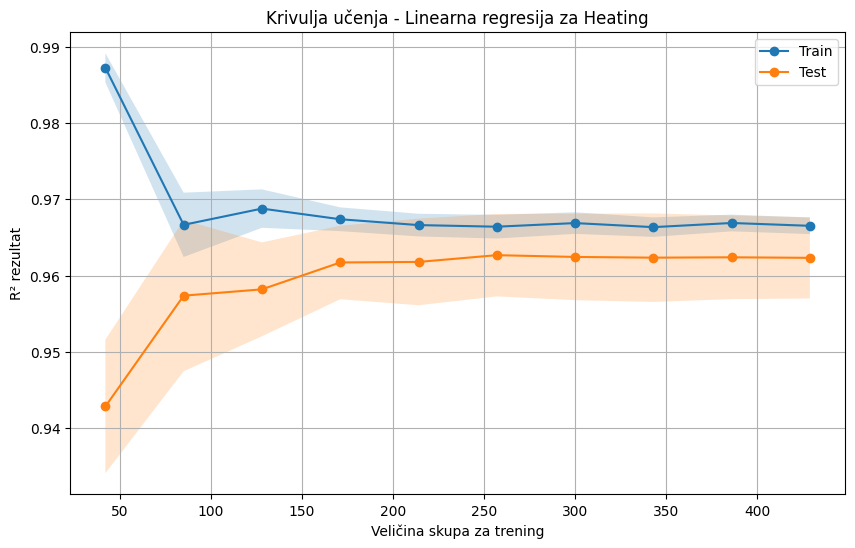

In [ ]:
#Prikaz krivulje učenja Linearne regresije za Heating
prikaz_krivulje_ucenja(model_Lin_He, X_train_final, y_train_heating, "Krivulja učenja - Linearna regresija za Heating")

In [ ]:
# Evaluacijske metrike Linearne regresije za Heating
y_pred_Lin_He, mae_Lin_He, mse_Lin_He, rmse_Lin_He, r2_Lin_He, mape_Lin_He, evs_Lin_He=evaluacija_modela(model_Lin_He, X_test_final, y_test_heating)
ispis_rezultata(mae_Lin_He,mse_Lin_He, rmse_Lin_He, r2_Lin_He, mape_Lin_He, evs_Lin_He)


MAE: 1.4886
MSE: 3.4482
RMSE: 1.8569
R²: 0.9660
MAPE: 0.0819
EVS: 0.9661


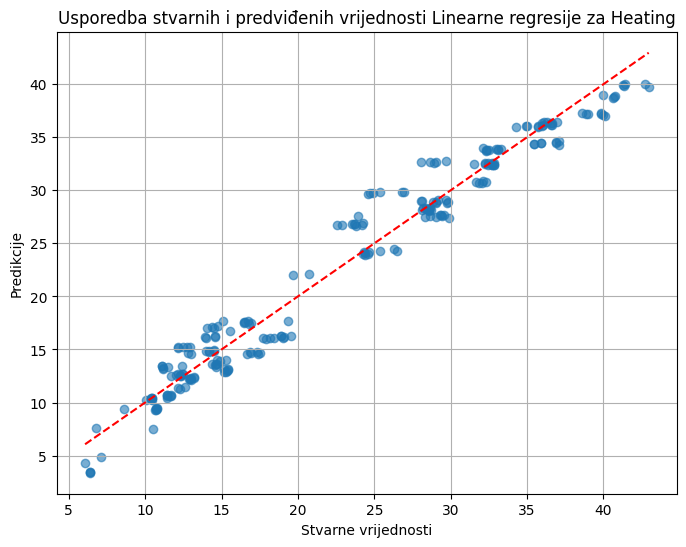

In [ ]:
#Dijagram raspršenja između stvarnih i predviđenih vrijednosti Linearne regresije za Heating
prikaz_stvarnih_i_predikcija(y_test_heating, y_pred_Lin_He, "Usporedba stvarnih i predviđenih vrijednosti Linearne regresije za Heating")


In [ ]:
#Procjena koliko je svaka značajka važna za točnost modela Linearne regresije za Heating tako što mjeri pad performanse (R²) nakon nasumičnog miješanja vrijednosti te značajke
nazivi_znacajki = X_train_final.columns
vaznost_df_Lin_He=izracun_permutacijske_vaznosti(model_Lin_He, X_test_final, y_test_heating, nazivi_znacajki)


                            Značajka       Važnost  Standardna devijacija
17                   Building Volume  5.717217e+02              26.995878
5                 overall_height_low  2.007831e+02              12.079653
4                overall_height_high  2.007831e+02              12.079653
20                Wall-to-Roof Ratio  6.191776e+01               4.194754
15                         roof_area  5.520666e+01               3.850570
12              relative_compactness  3.585079e+01               3.033871
22       Height-to-Compactness Ratio  3.569586e+01               1.653088
13                      surface_area  9.519170e+00               0.799101
19             Roof-to-Surface Ratio  4.865933e+00               0.341509
18             Wall-to-Surface Ratio  4.865933e+00               0.341509
14                         wall_area  1.744864e+00               0.114037
21          Glazing-to-Surface Ratio  5.711341e-01               0.035486
16                      glazing_area  

## Najznačajnije varijable

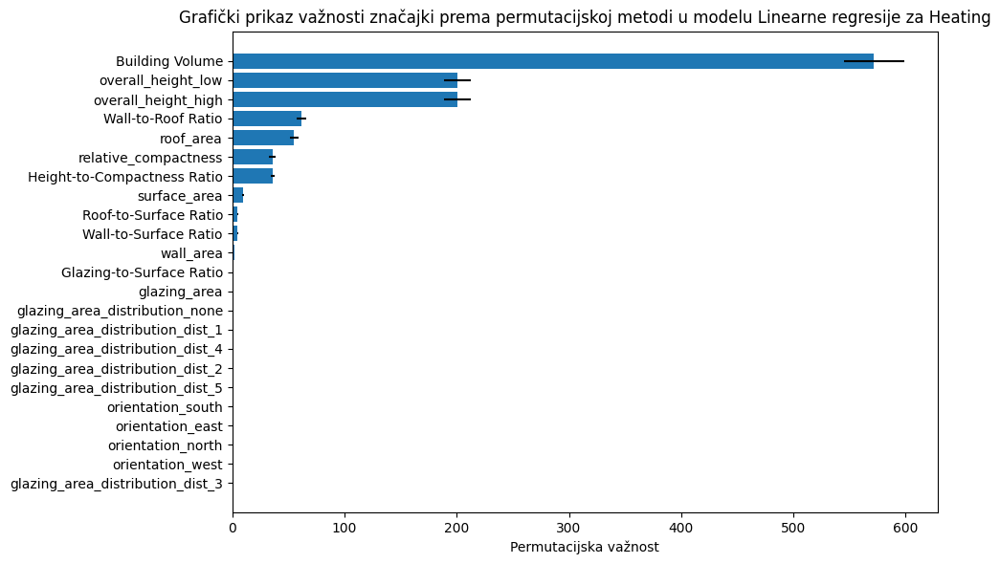

In [ ]:
#Grafički prikaz važnosti značajki prema permutacijskoj metodi u modelu Linearne regresije za Heating
graf_permutacijske_vaznosti(vaznost_df_Lin_He, "Grafički prikaz važnosti značajki prema permutacijskoj metodi u modelu Linearne regresije za Heating")

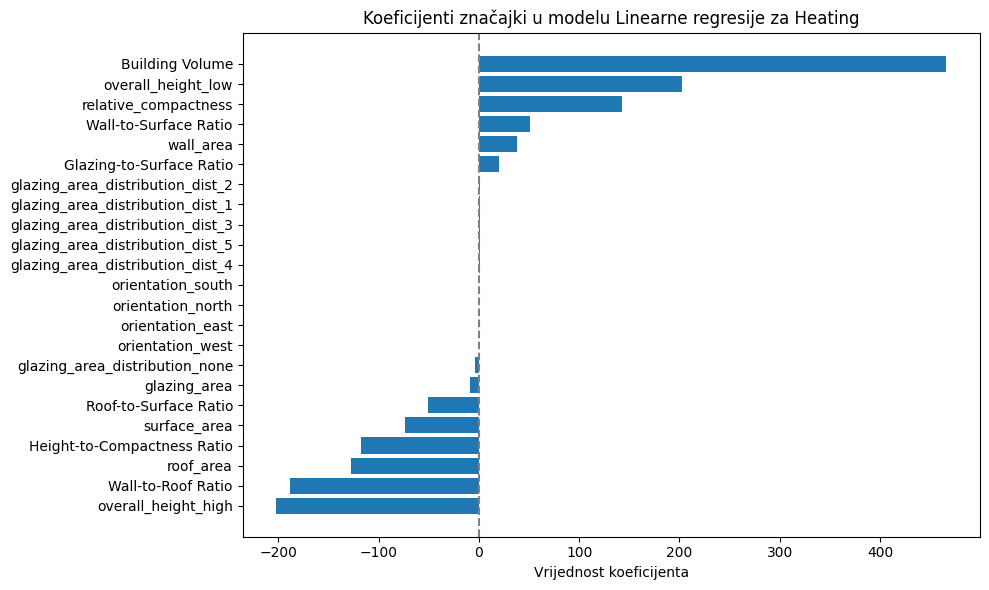

In [ ]:
# Grafički prikaz koeficijenata značajki u modelu Linearne regresije za Heating
koeficijenti_značajki(model_Lin_He, " za Heating")

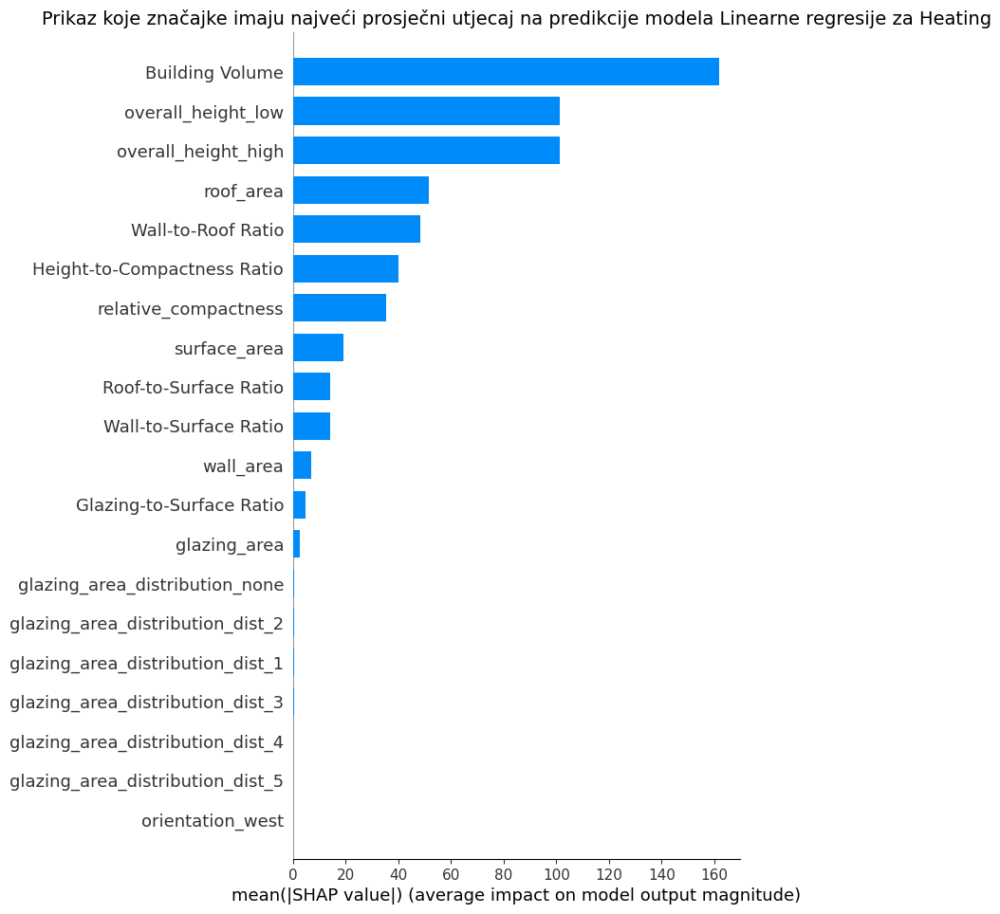

In [ ]:
# Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije modela Linearne regresije za Heating
explainer_Lin_He, shap_vrijednosti_Lin_He = kreiraj_shap_vrijednosti(model_Lin_He, "linearni", X_train_final, X_test_final)
shap_summary_bar_dijagram(shap_vrijednosti_Lin_He, X_test_final,"Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije modela Linearne regresije za Heating")

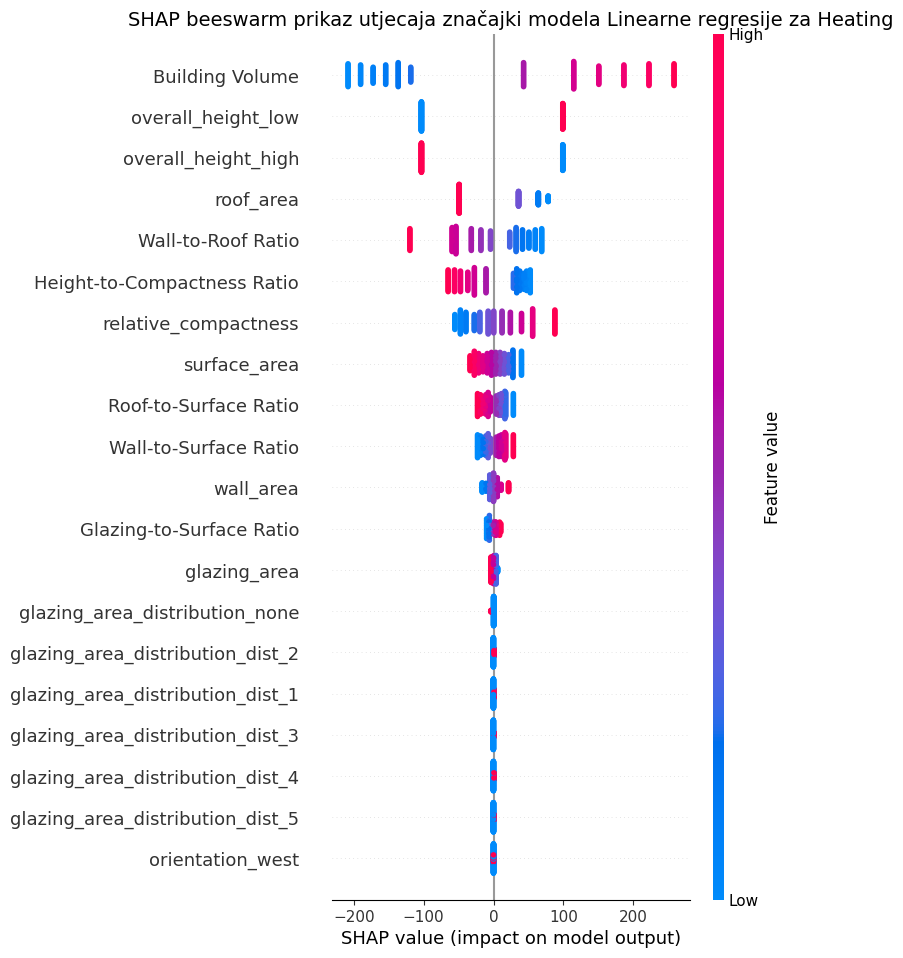

In [ ]:
#Prikaz kako i koliko svaka značajka utječe na predikcije modela Linearne regresije za Heating za sve uzorke
shap_beeswarm_dijagram(shap_vrijednosti_Lin_He, X_test_final, 'SHAP beeswarm prikaz utjecaja značajki modela Linearne regresije za Heating')


Prikaz za instancu #186


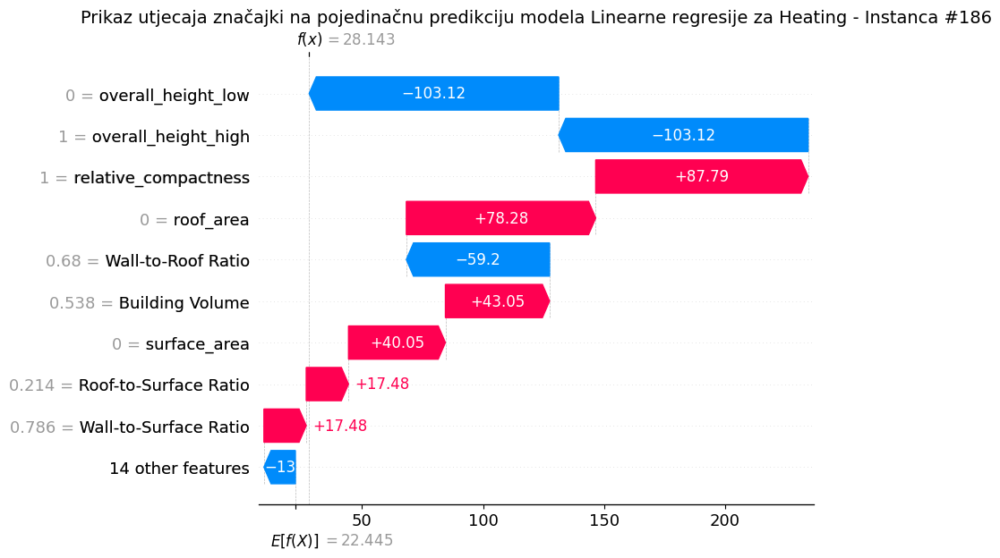


Prikaz za instancu #80


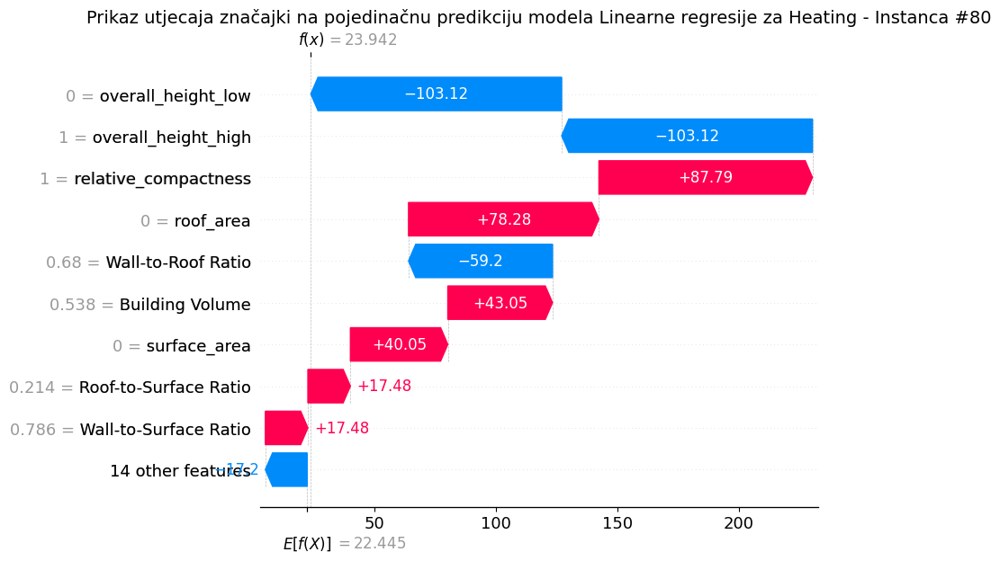


Prikaz za instancu #59


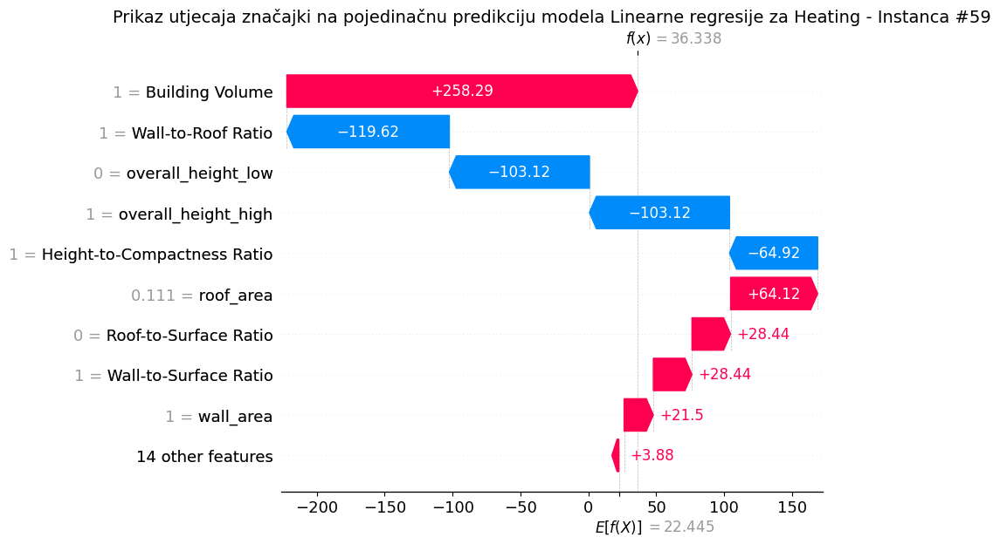


Prikaz za instancu #209


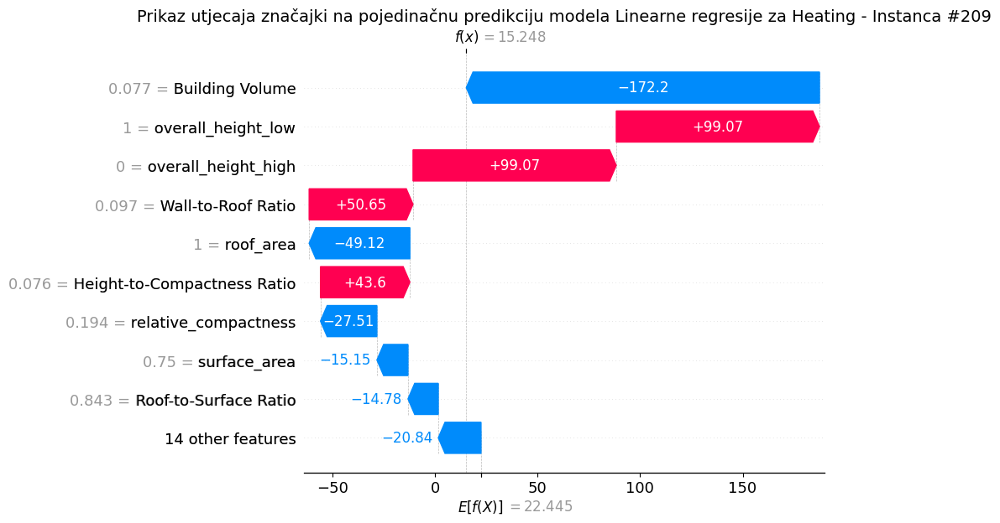


Prikaz za instancu #26


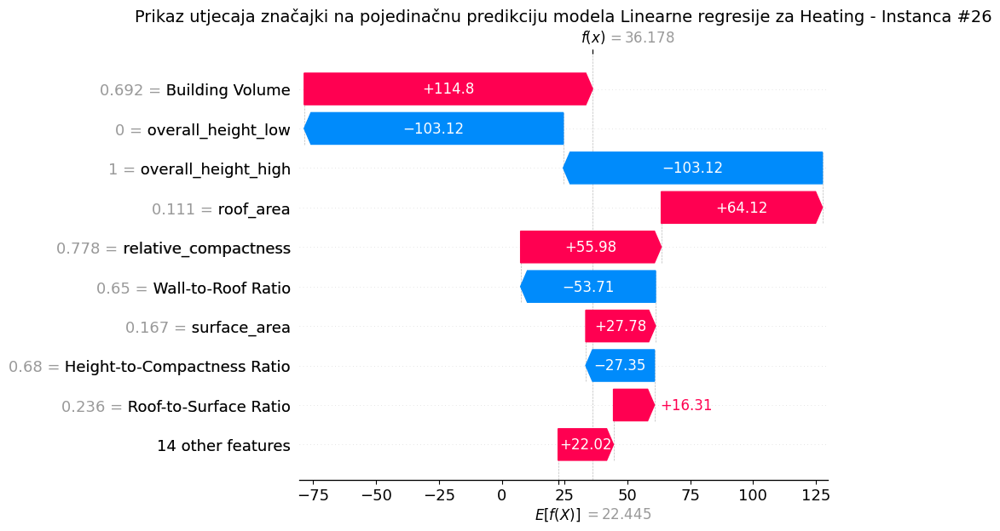

In [ ]:
#Nasumičan odabir 5 uzoraka iz testnog skupa i za svaki od njih se prikazuje SHAP waterfall plot koji detaljno vizualizira kako su pojedine značajke utjecale na konačnu predikciju modela Linearne regresije za Heating za tu konkretnu instancu

shap_waterfall_dijagram(explainer_Lin_He, shap_vrijednosti_Lin_He, "linearni", X_test_final, "Prikaz utjecaja značajki na pojedinačnu predikciju modela Linearne regresije za Heating")

## Podešavanje hiperparametara

In [ ]:
# Optimizacija modela Linearne regresije za Heating

lasso = Lasso(max_iter=200000)
param_grid_lasso = {'alpha': np.logspace(-3, 2, 50)}

optimizirani_model_Lin_He, optimizirani_parametri_Lin_He, optimizirani_r2_Lin_He = optimiziraj_model(lasso, param_grid_lasso, X_train_final, y_train_heating)
optimizirana_alfa_Lin_He = optimizirani_parametri_Lin_He['alpha']

print("Najbolja alfa:", optimizirani_parametri_Lin_He)

Najbolja alfa: {'alpha': np.float64(0.001)}


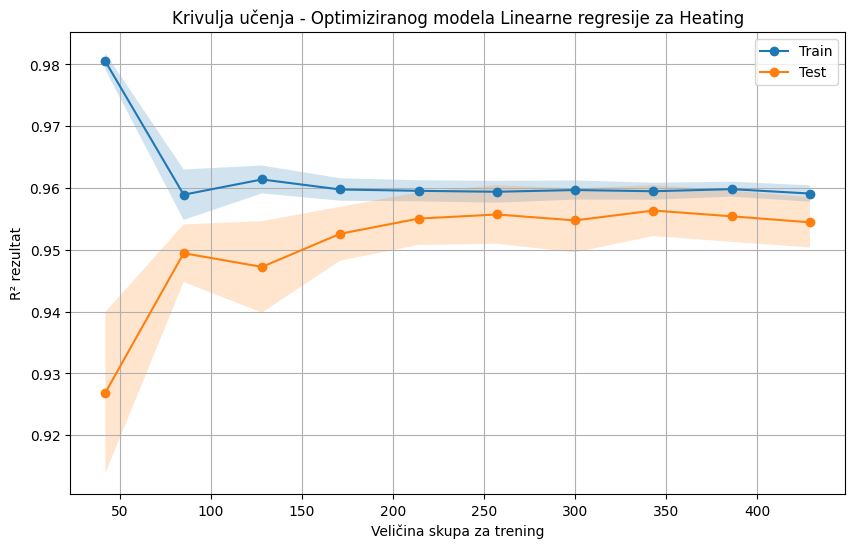

In [ ]:
# Krivulja učenja Linearne regresije za Heating nakon optimizacije
prikaz_krivulje_ucenja(optimizirani_model_Lin_He, X_train_final, y_train_heating, "Krivulja učenja - Optimiziranog modela Linearne regresije za Heating")


In [ ]:
## Evaluacijske metrike nakon optimizacije Linearne regresije za Heating

print(f" Evaluacija optimiziranog modela Linearne regresije za Heating (alfa={optimizirana_alfa_Lin_He})")
y_pred_Lin_He_Hi, mae_Lin_He_Hi, mse_Lin_He_Hi, rmse_Lin_He_Hi, r2_Lin_He_Hi, mape_Lin_He_Hi, evs_Lin_He_Hi=evaluacija_modela(optimizirani_model_Lin_He, X_test_final, y_test_heating)
ispis_rezultata(mae_Lin_He_Hi,mse_Lin_He_Hi, rmse_Lin_He_Hi, r2_Lin_He_Hi, mape_Lin_He_Hi, evs_Lin_He_Hi)

 Evaluacija optimiziranog modela Linearne regresije za Heating (alfa=0.001)
MAE: 1.5763
MSE: 4.5321
RMSE: 2.1289
R²: 0.9553
MAPE: 0.0768
EVS: 0.9555


# **KNN-heating_load**

In [ ]:
# Kreiranje KNN modela za Heating

knn_He = KNeighborsRegressor()
knn_He.fit(X_train_final, y_train_heating)


KNeighborsRegressor()

## Evaluacija modela

In [ ]:
#Provjera overfittinga  KNN modela za Heating
provjera_overfittinga(knn_He, X_train_final, X_test_final, y_train_heating, y_test_heating)


Train R²: 0.9159
Test R²: 0.8610


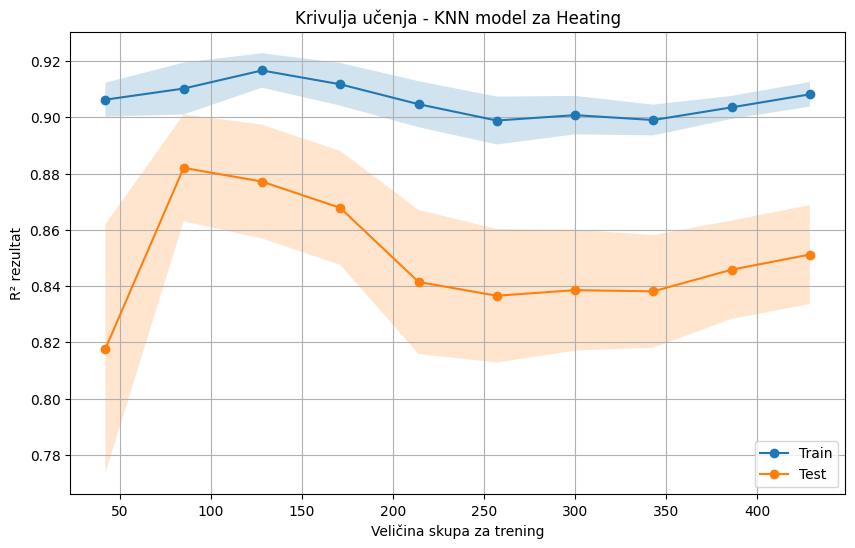

In [ ]:
# Krivulja učenja- KNN model za Heating
prikaz_krivulje_ucenja(knn_He, X_train_final, y_train_heating, "Krivulja učenja - KNN model za Heating")

In [ ]:
#Evaluacijske metrike KNN modela

y_pred_KNN_He, mae_KNN_He, mse_KNN_He, rmse_KNN_He, r2_KNN_He, mape_KNN_He, evs_KNN_He=evaluacija_modela(knn_He, X_test_final, y_test_heating)
ispis_rezultata(mae_KNN_He, mse_KNN_He, rmse_KNN_He, r2_KNN_He, mape_KNN_He, evs_KNN_He)


MAE: 2.7111
MSE: 14.0901
RMSE: 3.7537
R²: 0.8610
MAPE: 0.1169
EVS: 0.8612


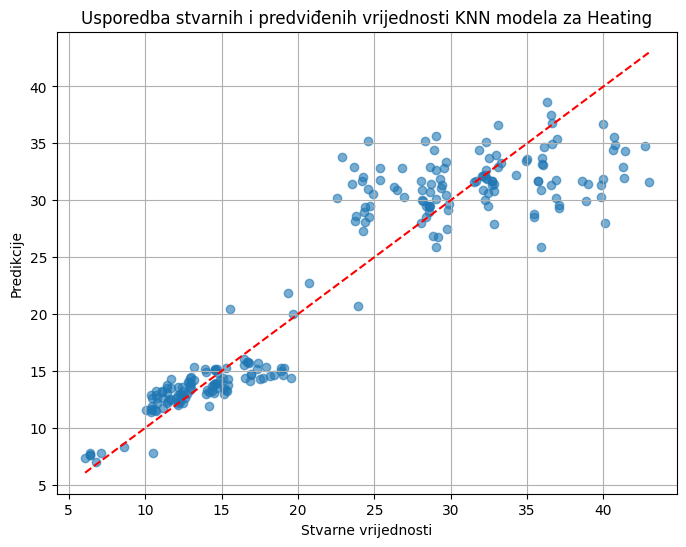

In [ ]:
#Dijagram raspršenja između stvarnih i predviđanih vrijednosti KNN modela za Heating
prikaz_stvarnih_i_predikcija(y_test_heating, y_pred_KNN_He, "Usporedba stvarnih i predviđenih vrijednosti KNN modela za Heating")

## Najznačajnije značajke


In [ ]:
#Procjena koliko je svaka značajka važna za točnost KNN modela za Heating tako što mjeri pad performanse (R²) nakon nasumičnog miješanja vrijednosti te značajke.
nazivi_znacajki = X_train_final.columns
vaznost_df_KNN_He=izracun_permutacijske_vaznosti(knn_He, X_test_final, y_test_heating, nazivi_znacajki)

                            Značajka   Važnost  Standardna devijacija
16                      glazing_area  0.041832               0.004756
21          Glazing-to-Surface Ratio  0.024298               0.003834
14                         wall_area  0.010233               0.005371
11    glazing_area_distribution_none  0.009507               0.002694
22       Height-to-Compactness Ratio  0.006807               0.003619
18             Wall-to-Surface Ratio  0.006648               0.002043
19             Roof-to-Surface Ratio  0.006648               0.002043
17                   Building Volume  0.006454               0.003650
12              relative_compactness  0.006416               0.002961
13                      surface_area  0.006297               0.002080
20                Wall-to-Roof Ratio  0.006027               0.001520
15                         roof_area  0.005841               0.001987
4                overall_height_high  0.000006               0.000005
5                 ov

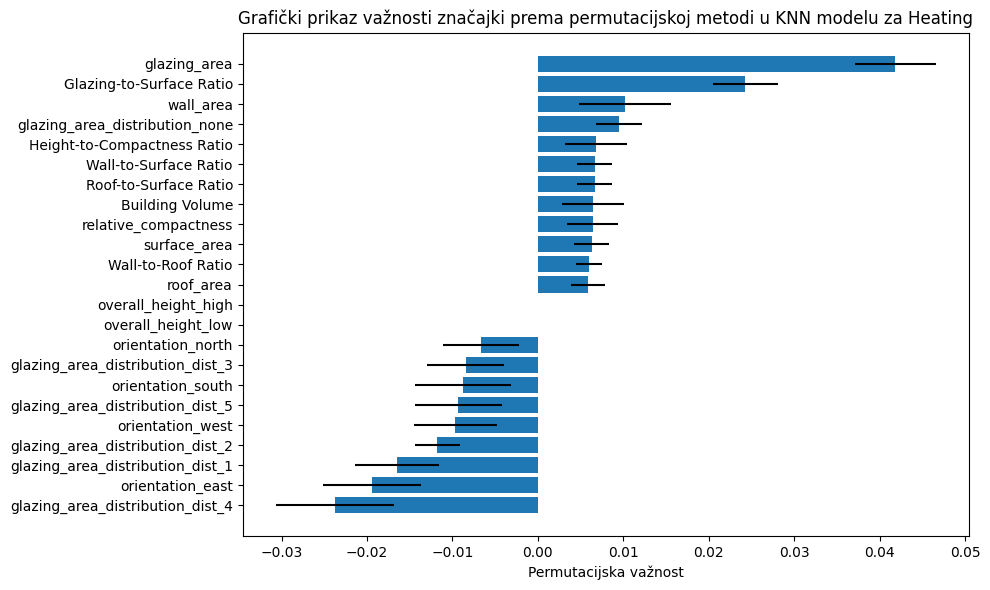

In [ ]:
#Grafički prikaz važnosti značajki prema permutacijskoj metodi u KNN modelu za Heating
graf_permutacijske_vaznosti(vaznost_df_KNN_He, "Grafički prikaz važnosti značajki prema permutacijskoj metodi u KNN modelu za Heating")

  0%|          | 0/231 [00:00<?, ?it/s]

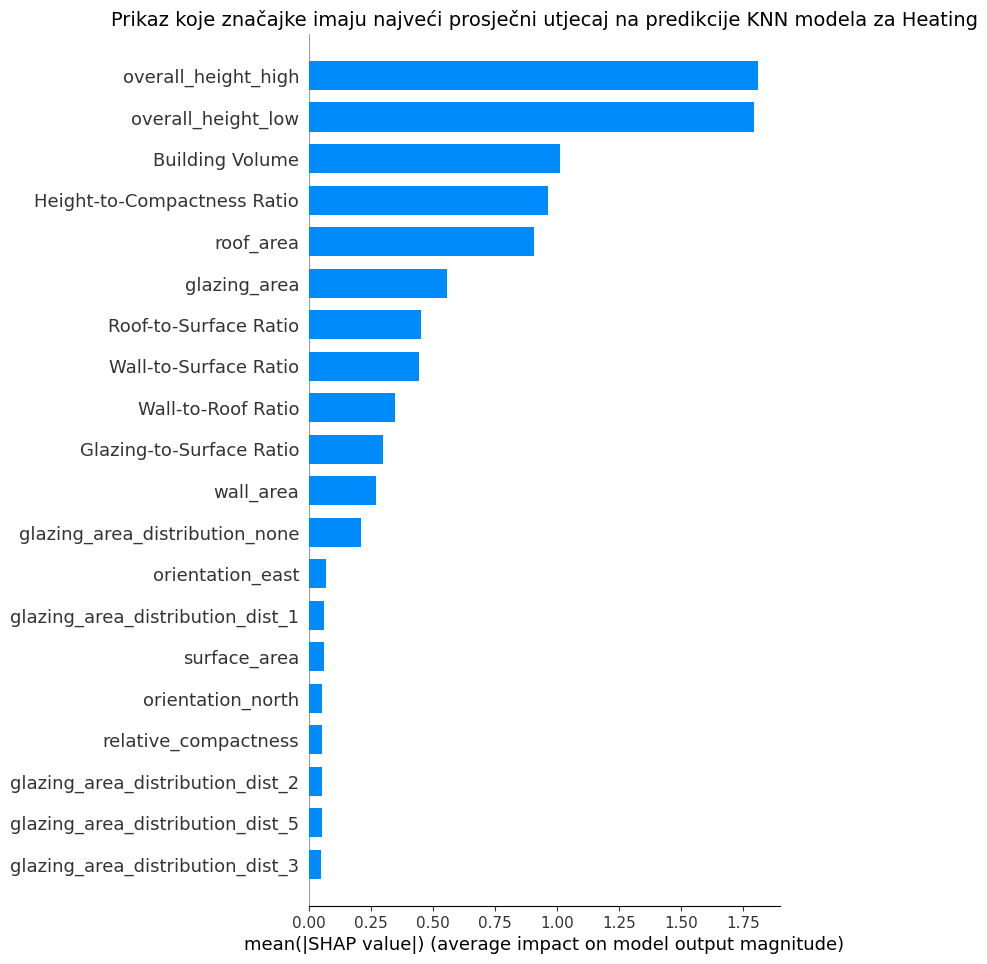

In [ ]:
# Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije KNN modela za Heating
explainer_KNN_He, shap_vrijednosti_KNN_He = kreiraj_shap_vrijednosti(knn_He, "knn", X_train_final, X_test_final)
shap_summary_bar_dijagram(shap_vrijednosti_KNN_He, X_test_final,"Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije KNN modela za Heating")

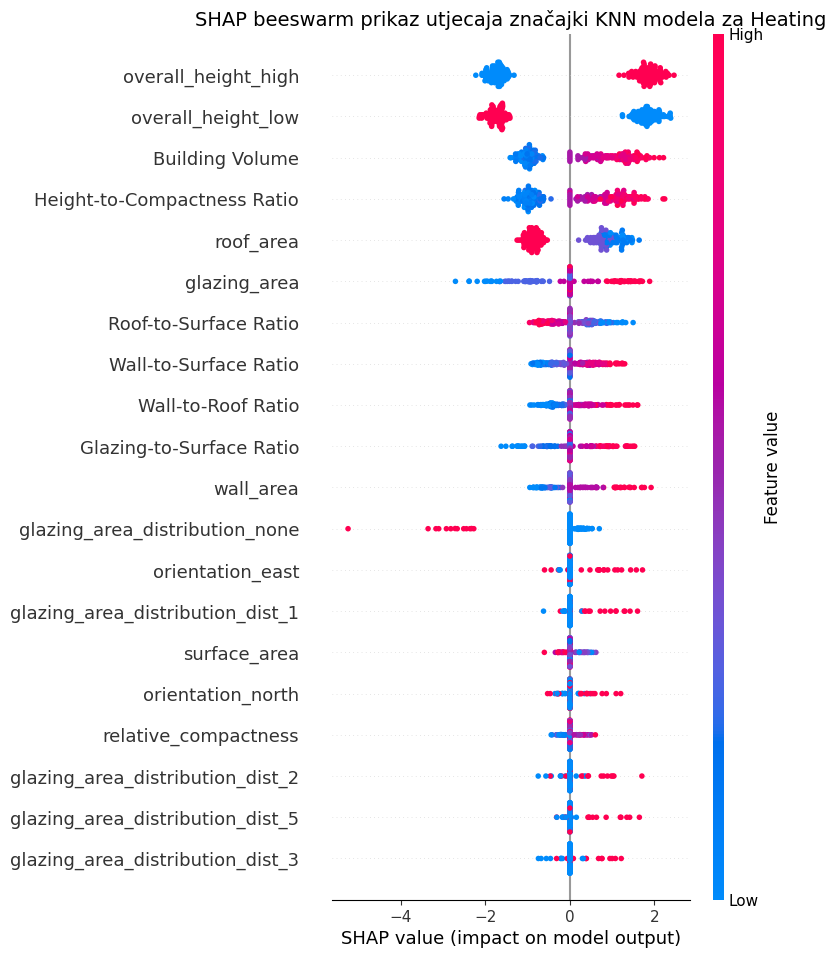

In [ ]:
#Prikaz kako i koliko svaka značajka utječe na predikcije KNN modela za Heating za sve uzorke
shap_beeswarm_dijagram(shap_vrijednosti_KNN_He, X_test_final, 'SHAP beeswarm prikaz utjecaja značajki KNN modela za Heating')

  0%|          | 0/231 [00:00<?, ?it/s]


Prikaz za instancu #75


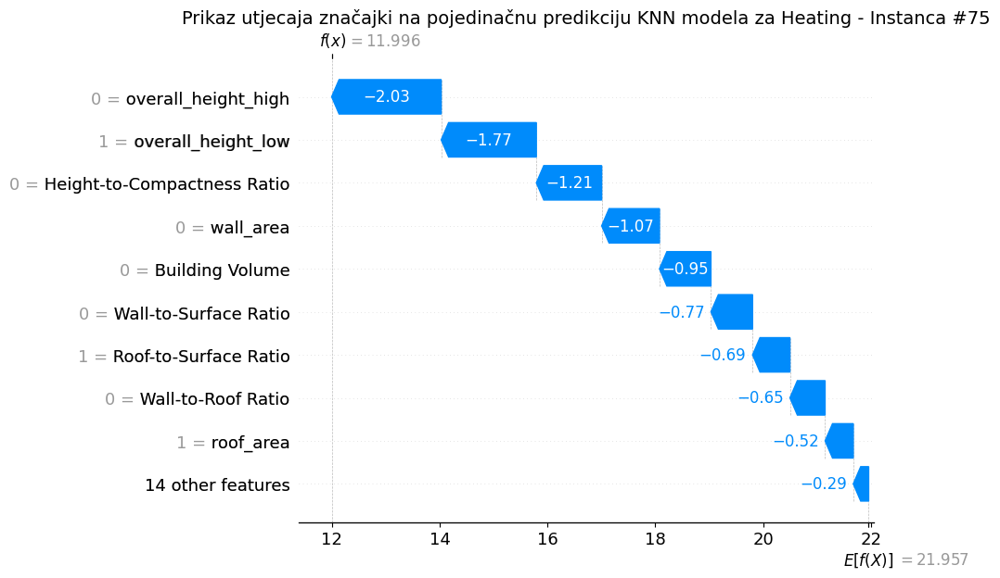


Prikaz za instancu #140


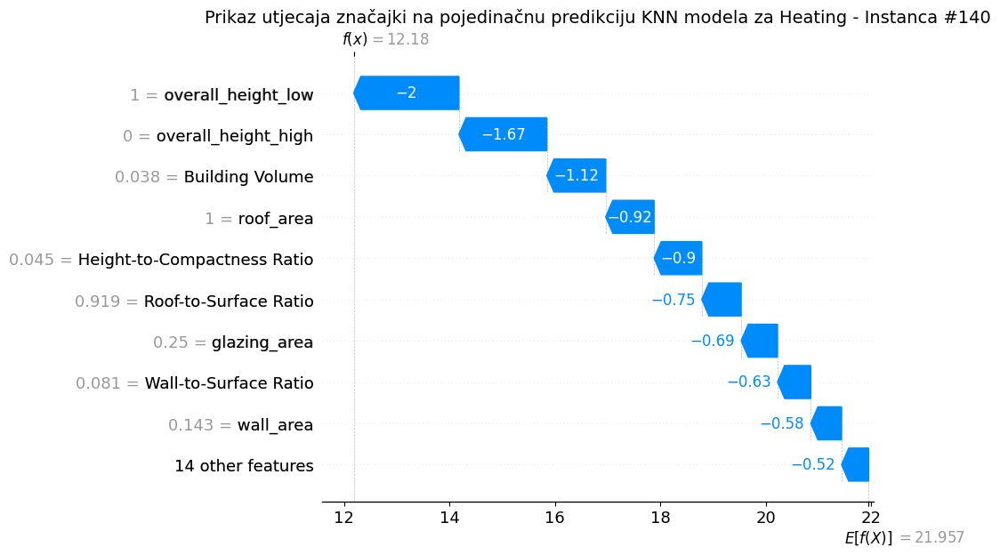


Prikaz za instancu #131


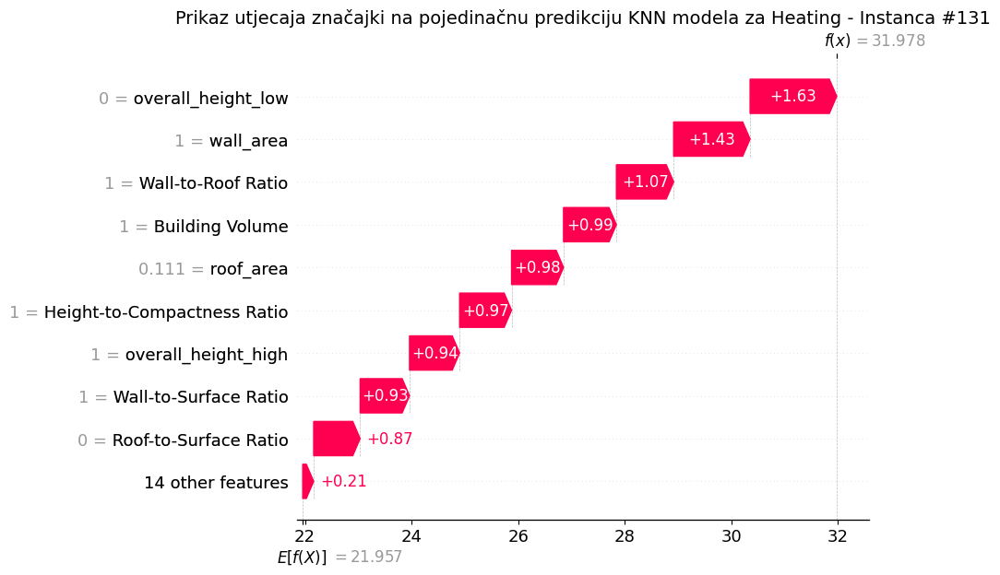


Prikaz za instancu #195


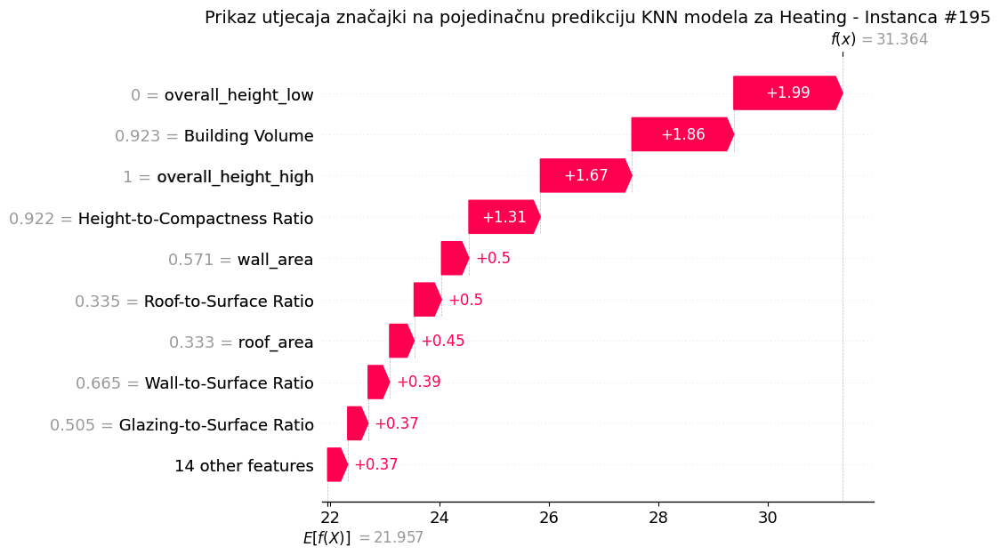


Prikaz za instancu #54


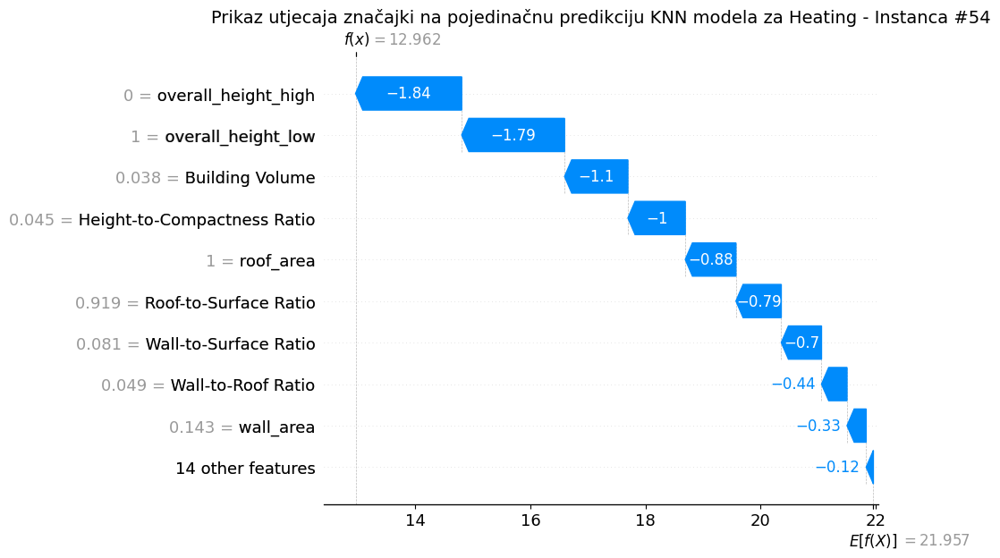

In [ ]:
#Nasumičan odabir 5 uzoraka iz testnog skupa i za svaki od njih se prikazuje SHAP waterfall plot koji detaljno vizualizira kako su pojedine značajke utjecale na konačnu predikciju KNN modela za Heating za tu konkretnu instancu.
shap_waterfall_dijagram(explainer_KNN_He, shap_vrijednosti_KNN_He, "knn", X_test_final,"Prikaz utjecaja značajki na pojedinačnu predikciju KNN modela za Heating")

## Optimizacija hiperparametara

In [ ]:
# Optimizacija KNN modela za Heating

param_grid_knn = {
    'n_neighbors': [3, 5, 7, 9, 11, 15],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

optimizirani_knn_He, optimizirani_parametri_knn_He, optimizirani_r2_knn_He = optimiziraj_model(knn_He, param_grid_knn, X_train_final, y_train_heating)

print("Najbolji parametri KNN:", optimizirani_parametri_knn_He)

Najbolji parametri KNN: {'n_neighbors': 9, 'p': 1, 'weights': 'uniform'}


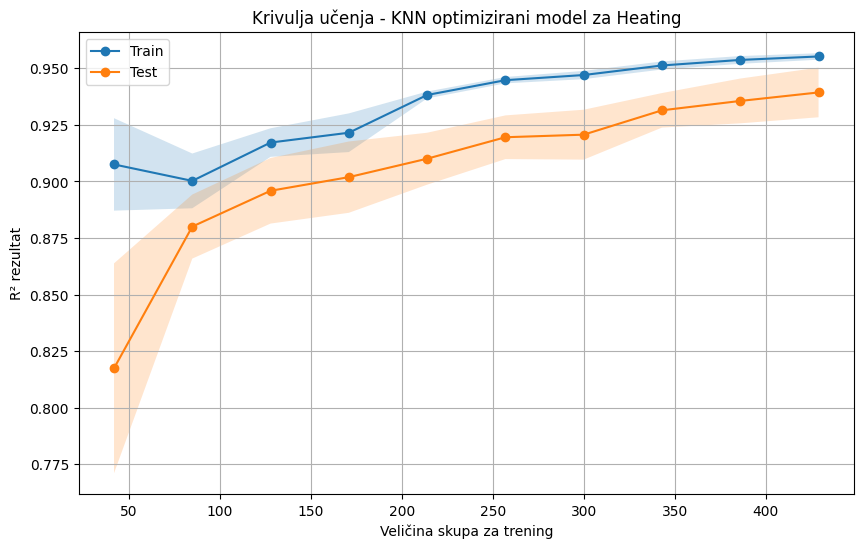

In [ ]:
# Krivulja učenja-KNN modela za Heating
prikaz_krivulje_ucenja(optimizirani_knn_He, X_train_final, y_train_heating, "Krivulja učenja - KNN optimizirani model za Heating")


In [ ]:
# Evaluacijske metrike za optimizirane rezultate KNN modela za Heating

print(f" Evaluacija KNN modela za Heating(parametri={optimizirani_parametri_knn_He})")

y_pred_KNN_He_opt, mae_KNN_He_Hi, mse_KNN_He_Hi, rmse_KNN_He_Hi, r2_KNN_He_Hi, mape_KNN_He_Hi, evs_KNN_He_Hi=evaluacija_modela(optimizirani_knn_He, X_test_final, y_test_heating)
ispis_rezultata(mae_KNN_He_Hi, mse_KNN_He_Hi, rmse_KNN_He_Hi, r2_KNN_He_Hi, mape_KNN_He_Hi, evs_KNN_He_Hi)


 Evaluacija KNN modela za Heating(parametri={'n_neighbors': 9, 'p': 1, 'weights': 'uniform'})
MAE: 1.8764
MSE: 5.8555
RMSE: 2.4198
R²: 0.9423
MAPE: 0.0937
EVS: 0.9423


# **Stablo odlučivanja-heating_load**

In [ ]:
#Kreiranje modela Stabla odlučivanja za Heating

model_stabla_He = DecisionTreeRegressor(random_state=42, max_depth=4)
model_stabla_He.fit(X_train_final, y_train_heating)


DecisionTreeRegressor(max_depth=4, random_state=42)

## Evaluacija modela

In [ ]:
#Provjera overfitting modela Stabla odlučivanja za Heating
provjera_overfittinga(model_stabla_He, X_train_final, X_test_final, y_train_heating, y_test_heating)

Train R²: 0.9856
Test R²: 0.9824


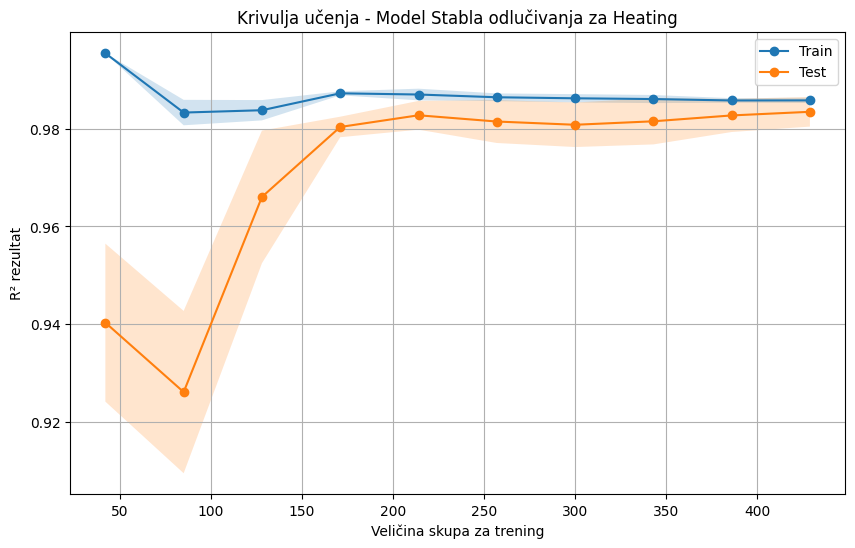

In [ ]:
# Krivulja učenja- Model Stabla odlučivanja za Heating
prikaz_krivulje_ucenja(model_stabla_He, X_train_final, y_train_heating, "Krivulja učenja - Model Stabla odlučivanja za Heating")

In [ ]:
#Evaluacijske metrike modela Stabla odlučivanja za Heating
y_pred_Sta_He, mae_Sta_He, mse_Sta_He, rmse_Sta_He, r2_Sta_He, mape_Sta_He, evs_Sta_He=evaluacija_modela(model_stabla_He, X_test_final, y_test_heating)
ispis_rezultata(mae_Sta_He, mse_Sta_He, rmse_Sta_He, r2_Sta_He, mape_Sta_He, evs_Sta_He)

MAE: 0.9971
MSE: 1.7860
RMSE: 1.3364
R²: 0.9824
MAPE: 0.0449
EVS: 0.9824


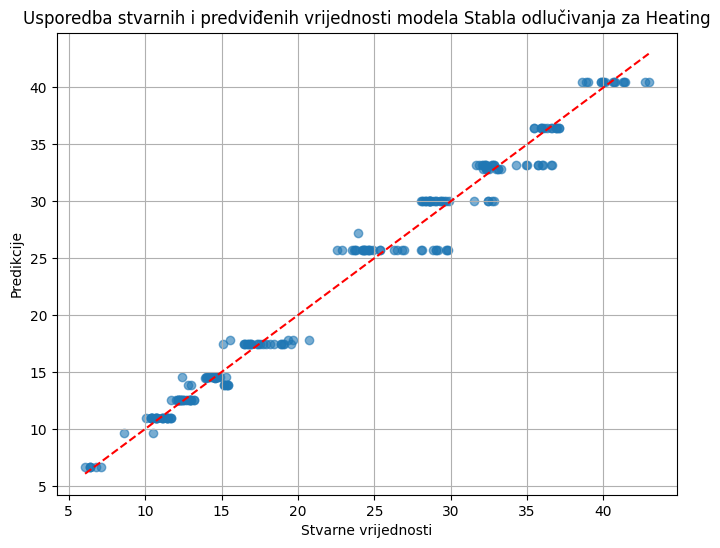

In [ ]:
#Dijagram raspršenja između stvarnih i predviđanih vrijednosti za model Stabla odlučivanja za Heating
prikaz_stvarnih_i_predikcija(y_test_heating, y_pred_Sta_He, "Usporedba stvarnih i predviđenih vrijednosti modela Stabla odlučivanja za Heating")

## Najznačajnije značajke

In [ ]:
#Procjena koliko je svaka značajka važna za točnost modela Stabla odlučivanja za Heating tako što mjeri pad performanse (R²) nakon nasumičnog miješanja vrijednosti te značajke.
nazivi_znacajki = X_train_final.columns
vaznost_df_Sta_He=izracun_permutacijske_vaznosti(model_stabla_He, X_test_final, y_test_heating, nazivi_znacajki)

                            Značajka   Važnost  Standardna devijacija
20                Wall-to-Roof Ratio  2.090631               0.115434
12              relative_compactness  0.317874               0.034161
21          Glazing-to-Surface Ratio  0.113074               0.007611
11    glazing_area_distribution_none  0.024310               0.002310
16                      glazing_area  0.016937               0.001289
18             Wall-to-Surface Ratio  0.007295               0.001401
22       Height-to-Compactness Ratio  0.002036               0.000429
6   glazing_area_distribution_dist_1  0.000000               0.000000
5                 overall_height_low  0.000000               0.000000
4                overall_height_high  0.000000               0.000000
3                   orientation_west  0.000000               0.000000
2                  orientation_south  0.000000               0.000000
1                  orientation_north  0.000000               0.000000
0                   

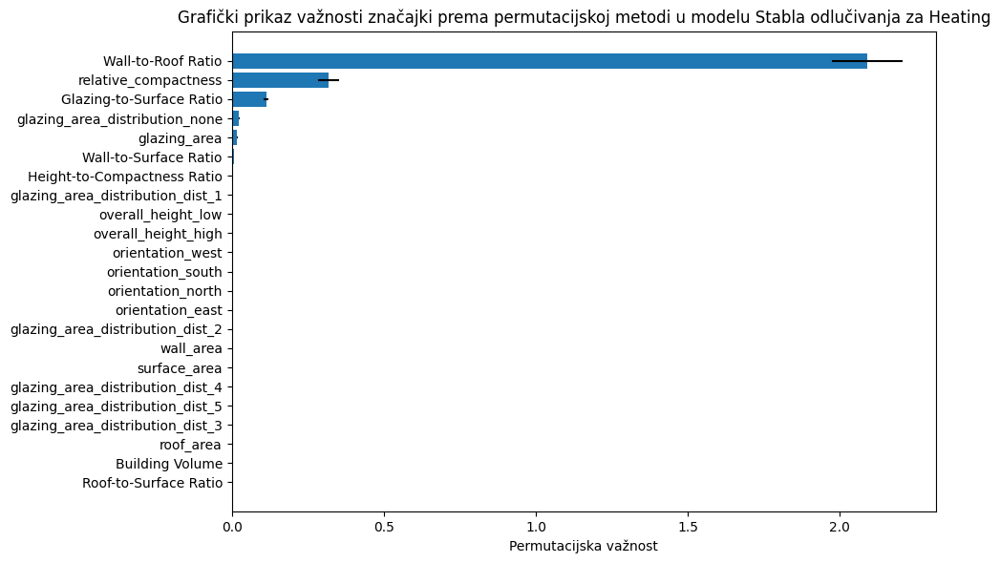

In [ ]:
#Grafički prikaz važnosti značajki prema permutacijskoj metodi u modelu Stabla odlučivanja za Heating
graf_permutacijske_vaznosti(vaznost_df_Sta_He, "Grafički prikaz važnosti značajki prema permutacijskoj metodi u modelu Stabla odlučivanja za Heating")

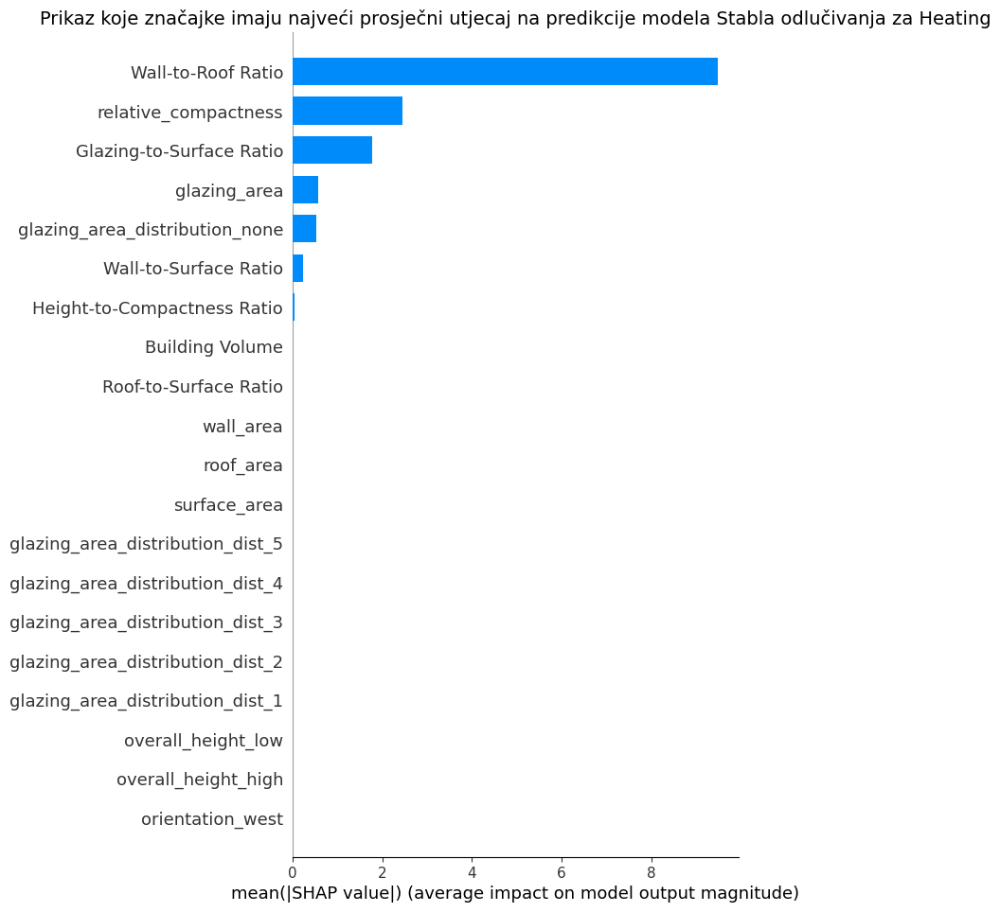

In [ ]:
# Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije modela Stabla odlučivanja za Heating
explainer_Sta_He, shap_vrijednosti_Sta_He = kreiraj_shap_vrijednosti(model_stabla_He, "stablo", X_train_final, X_test_final)
shap_summary_bar_dijagram(shap_vrijednosti_Sta_He, X_test_final,"Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije modela Stabla odlučivanja za Heating")

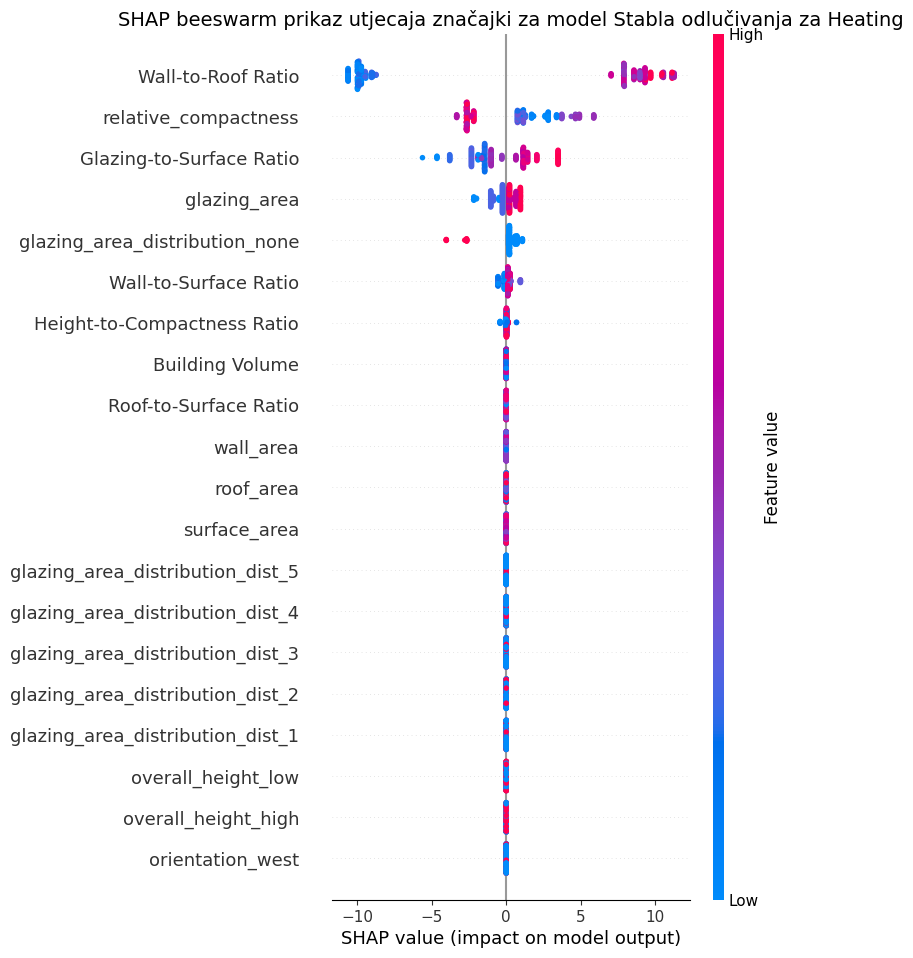

In [ ]:
#Prikaz kako i koliko svaka značajka utječe na predikcije modela Stabla odlučivanja za Heating za sve uzorke
shap_beeswarm_dijagram(shap_vrijednosti_Sta_He, X_test_final, 'SHAP beeswarm prikaz utjecaja značajki za model Stabla odlučivanja za Heating')


Prikaz za instancu #71


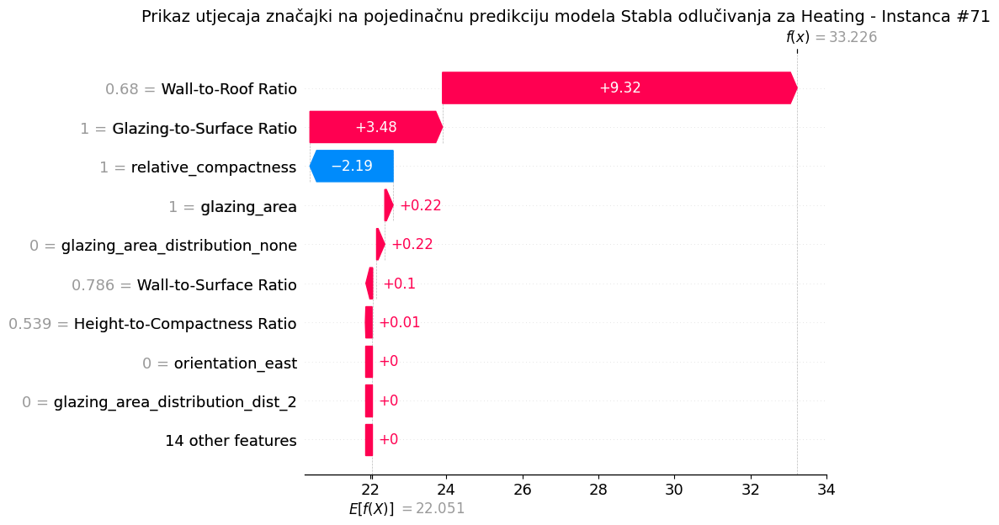


Prikaz za instancu #54


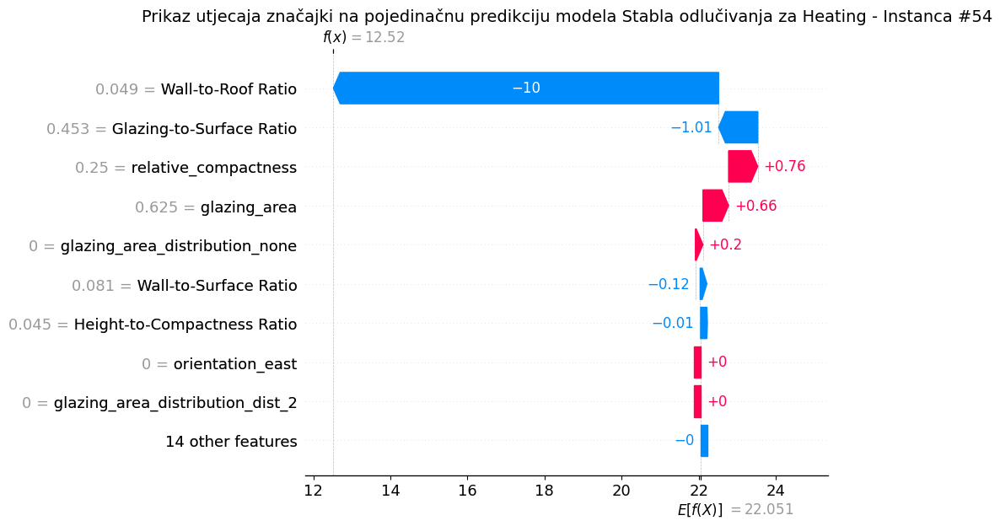


Prikaz za instancu #15


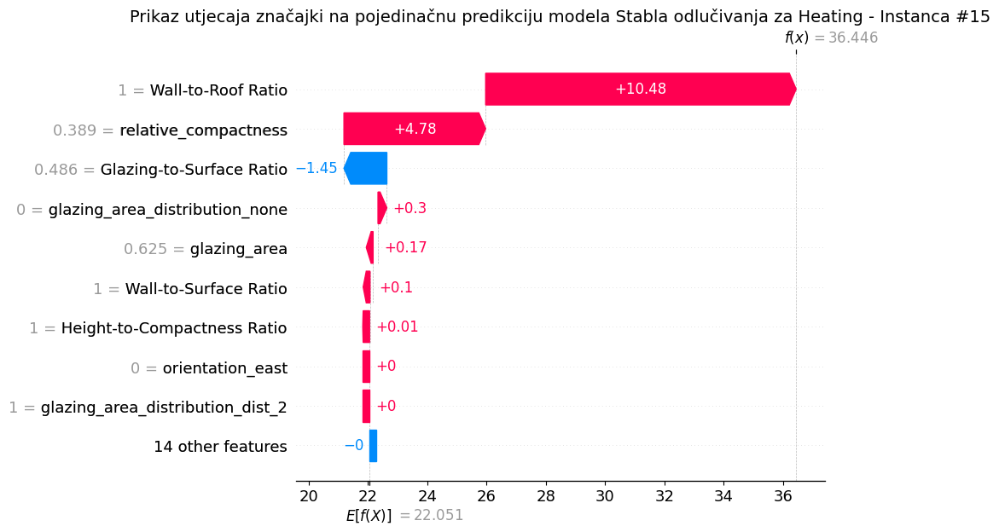


Prikaz za instancu #191


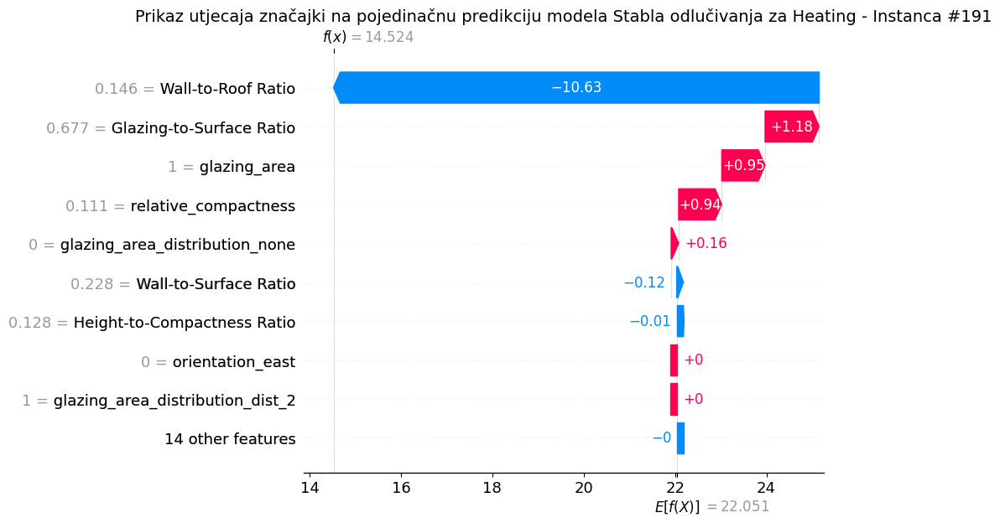


Prikaz za instancu #61


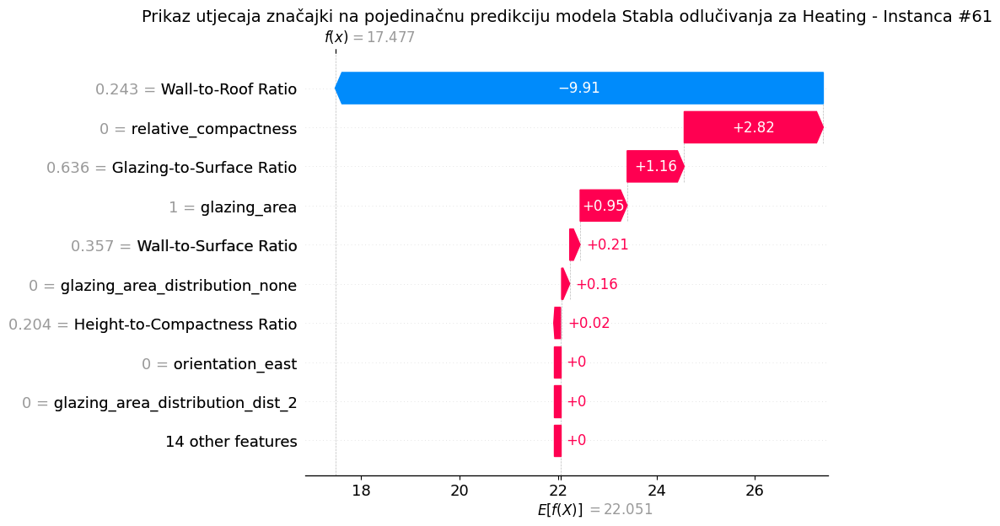

In [ ]:
#Nasumičan odabir 5 uzoraka iz testnog skupa i za svaki od njih se prikazuje SHAP waterfall plot koji detaljno vizualizira kako su pojedine značajke utjecale na konačnu predikciju modela Stabla odlučivanja za Heating za tu konkretnu instancu.
shap_waterfall_dijagram(explainer_Sta_He, shap_vrijednosti_Sta_He, "stablo", X_test_final,"Prikaz utjecaja značajki na pojedinačnu predikciju modela Stabla odlučivanja za Heating")

## Optimizacija hiperparametara

In [ ]:
# Optimizacija modela Stabla odlučivanja za Heating

param_grid_stablo = {
    'max_depth': [2, 3, 4, 5, 6, 8, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [2, 4],
    'max_features': [None, 'sqrt', 'log2']
}

optimizirani_model_Sta_He, optimizirani_parametri_Sta_He, optimizirani_r2_Sta_He = optimiziraj_model(model_stabla_He, param_grid_stablo, X_train_final, y_train_heating)

print("Najbolji parametri stabla:", optimizirani_parametri_Sta_He)

Najbolji parametri stabla: {'max_depth': 8, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 5}


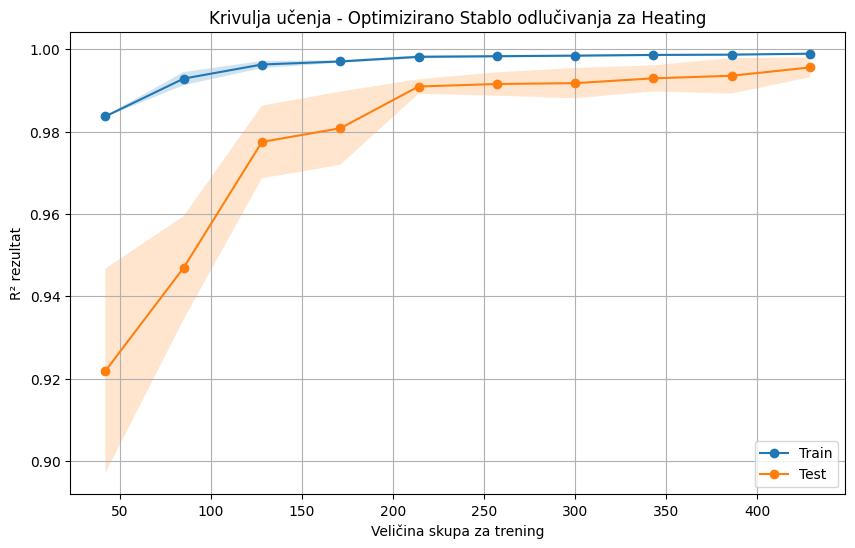

In [ ]:
# Krivulja učenja- optimizirani model Stabla odlučivanja za Heating
prikaz_krivulje_ucenja(optimizirani_model_Sta_He, X_train_final, y_train_heating, "Krivulja učenja - Optimizirano Stablo odlučivanja za Heating")

In [ ]:
#Evaluacijske metrike optimiziranog modela Stabla odlučivanja za Heating
y_pred_Sta_He_opt, mae_Sta_He_Hi, mse_Sta_He_Hi, rmse_Sta_He_Hi, r2_Sta_He_Hi, mape_Sta_He_Hi, evs_Sta_He_Hi=evaluacija_modela(optimizirani_model_Sta_He , X_test_final, y_test_heating)
ispis_rezultata(mae_Sta_He_Hi, mse_Sta_He_Hi, rmse_Sta_He_Hi, r2_Sta_He_Hi, mape_Sta_He_Hi, evs_Sta_He_Hi)

MAE: 0.3532
MSE: 0.2724
RMSE: 0.5219
R²: 0.9973
MAPE: 0.0146
EVS: 0.9973


##Prikaz stabla

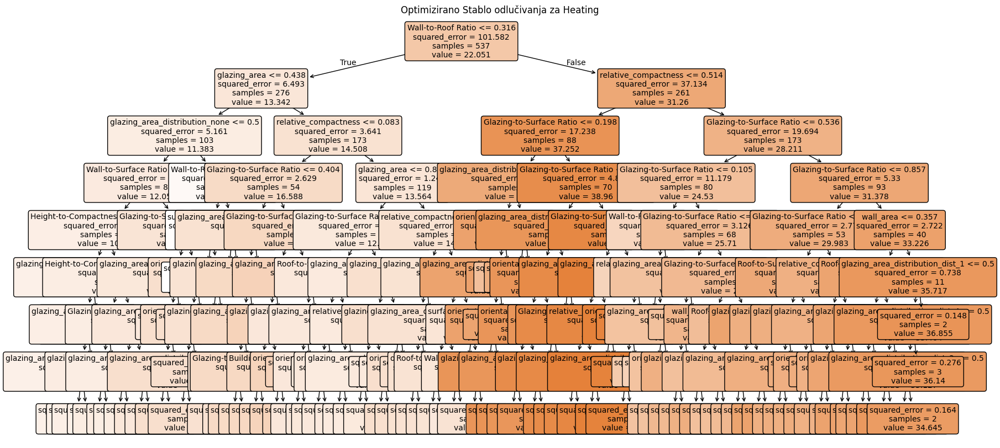

In [ ]:
#Prikaz optimiziranog Stabla odlučivanja za Heating
prikaz_stabla(optimizirani_model_Sta_He, "Optimizirano Stablo odlučivanja za Heating")

# **Neuronske mreže-heating_load**

In [ ]:
#Kreiranje modela Neuronskih mreža za Heating
(
    X_train_He,
    X_val_He,
    y_train_He,
    y_val_He,
    mae_Neu_He,
    mse_Neu_He,
    rmse_Neu_He,
    r2_Neu_He,
    mape_Neu_He,
    evs_Neu_He,
    najbolji_model_Neu_He,
    najbolja_povijest_Neu_He,
    najbolji_y_pred_Neu_He,
    najbolji_val_loss
) = treniraj_neuronsku_mrezu(
    X_train_final,
    y_train_heating,
    X_test_final,
    y_test_heating,
    "Heating"
)


===== Heating Trening 1/5 =====
Epoch 1/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 582.0461 - mae: 21.9342 - val_loss: 584.1359 - val_mae: 22.4907
Epoch 2/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 547.6908 - mae: 21.8103 - val_loss: 572.6192 - val_mae: 22.3529
Epoch 3/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 519.8814 - mae: 21.6480 - val_loss: 559.8687 - val_mae: 22.2018
Epoch 4/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 505.0065 - mae: 21.5708 - val_loss: 546.2675 - val_mae: 22.0494
Epoch 5/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 492.1728 - mae: 21.4182 - val_loss: 532.4281 - val_mae: 21.8832
Epoch 6/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 478.5760 - mae: 21.2411 - val_loss: 516.5266 - val_mae: 21.6725
Epoch 7/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 468.0703 - mae: 21.0963 - val_loss: 499.9082 - val_mae: 21.4256
Epoch 8/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 455.6369 - mae: 20.8736 - val_loss: 482.4736 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

===== Heating Trening 4/5 =====
Epoch 1/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 557.9817 - mae: 21.8527 - val_loss: 563.3652 - val_mae: 22.0851
Epoch 2/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 527.9454 - mae: 21.8189 - val_loss: 546.6942 - val_mae: 21.8702
Epoch 3/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 507.7438 - mae: 21.6963 - val_loss: 529.2316 - val_mae: 21.6512
Epoch 4/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 491.4016 - mae: 21.5378 - val_loss: 512.0481 - val_mae: 21.4351
Epoch 5/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 479.0907 - mae: 21.3622 - val_loss: 496.6689 - val_mae: 21.2381
Epoch 6/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 470.1124 - mae: 21.2466 - val_loss: 483.6870 - val_mae: 21.0661
Epoch 7/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 456.5660 - mae: 21.0058 - val_loss: 470.2922 - val_mae: 20.8643
Epoch 8/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 449.5798

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step

===== Heating Trening 5/5 =====
Epoch 1/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 568.3443 - mae: 21.9156 - val_loss: 555.2377 - val_mae: 21.9111
Epoch 2/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 536.4879 - mae: 21.8208 - val_loss: 533.2485 - val_mae: 21.5351
Epoch 3/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 518.0314 - mae: 21.6935 - val_loss: 510.0076 - val_mae: 21.1411
Epoch 4/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 500.2170 - mae: 21.5802 - val_loss: 486.8622 - val_mae: 20.7561
Epoch 5/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 486.9300 - mae: 21.4151 - val_loss: 463.1544 - val_mae: 20.3575
Epoch 6/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 473.1711 - mae: 21.2574 - val_loss: 440.9144 - val_mae: 19.9711
Epoch 7/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 463.2074 - mae: 21.0353 - val_loss: 420.5165 - val_mae: 19.6003
Epoch 8/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 448.9278

## Evaluacija modela

In [ ]:
#Provjera overfittinga za model Neuronskih mreža za Heating
provjera_overfittinga(najbolji_model_Neu_He, X_train_final, X_test_final, y_train_heating, y_test_heating)

17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Train R²: 0.9504
Test R²: 0.9220


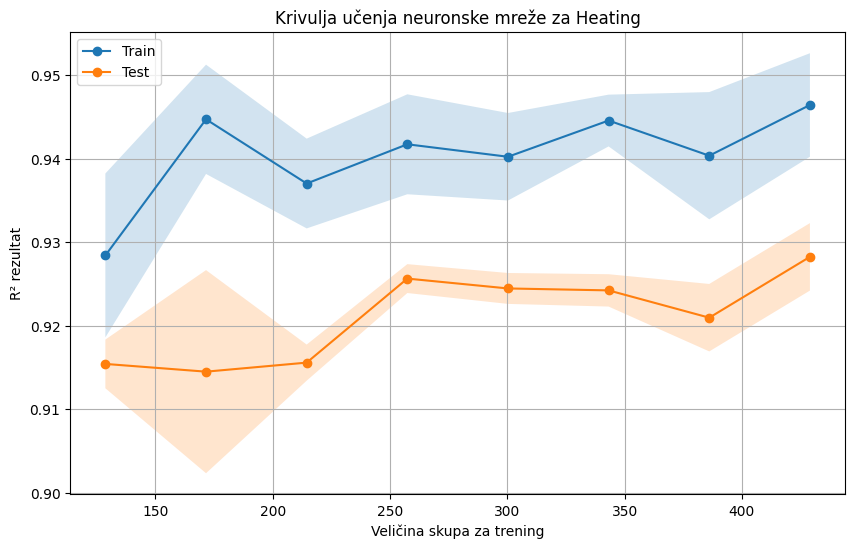

In [ ]:
#Prikaz krivulje učenja modela Neuronskih mreža za Heating
prikaz_krivulje_ucenja_neuronska(X_train_He, y_train_He, X_test_final, y_test_heating, "Krivulja učenja neuronske mreže za Heating")

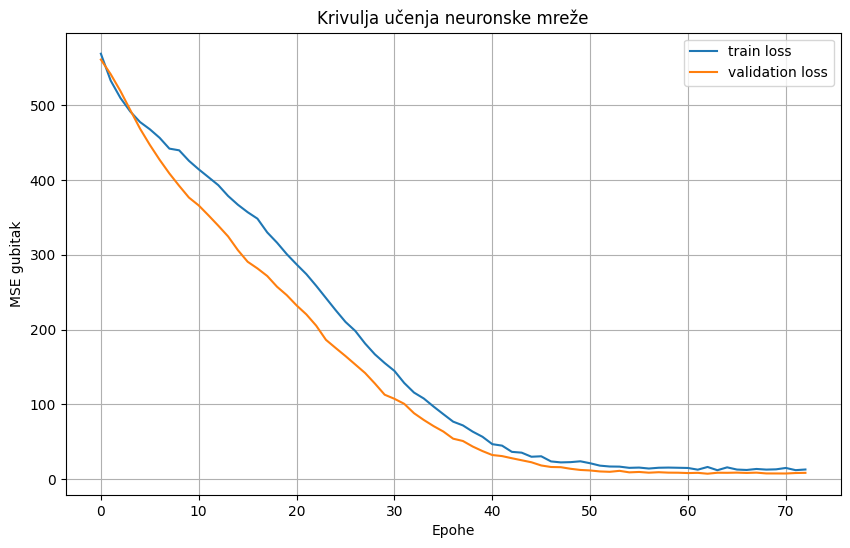

In [ ]:
#Prikaz krivulje učenje trainLoss i validationLoss za model Neuronskih mreža za Heating
prikaz_krivulje_ucenja_trainLoss_validationLoss(najbolja_povijest_Neu_He)


In [ ]:
#Evaluacijske metrike modela Neuronskih mreža za Heating
print("\n===== PROSJEČNI REZULTATI (HEATING, 5 TRENINGA) =====")
mae_Neu_mean = np.mean(mae_Neu_He)
mse_Neu_mean = np.mean(mse_Neu_He)
rmse_Neu_mean = np.mean(rmse_Neu_He)
r2_Neu_mean = np.mean(r2_Neu_He)
mape_Neu_mean = np.mean(mape_Neu_He)
evs_Neu_mean = np.mean(evs_Neu_He)


ispis_rezultata(mae_Neu_mean, mse_Neu_mean, rmse_Neu_mean, r2_Neu_mean, mape_Neu_mean, evs_Neu_mean )



===== PROSJEČNI REZULTATI (HEATING, 5 TRENINGA) =====
MAE: 2.0750
MSE: 8.5707
RMSE: 2.9260
R²: 0.9155
MAPE: 0.0884
EVS: 0.9186


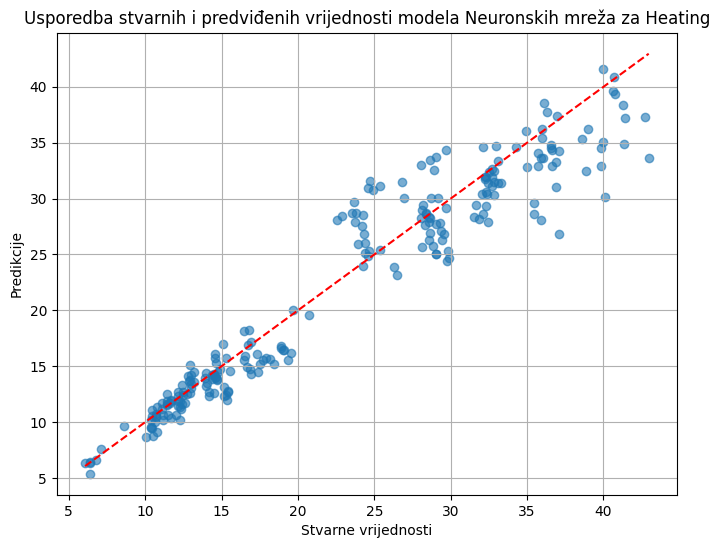

In [ ]:
#Dijagram raspršenja između stvarnih i predviđanih vrijednosti modela Neuronskih mreža za Heating
prikaz_stvarnih_i_predikcija(y_test_heating, najbolji_y_pred_Neu_He, "Usporedba stvarnih i predviđenih vrijednosti modela Neuronskih mreža za Heating")

## Najznačajnije značajke

In [ ]:
#Procjena koliko je svaka značajka važna za točnost modela Neuronskih mreža za Heating tako što mjeri pad performanse (R²) nakon nasumičnog miješanja vrijednosti te značajke.
class KerasRegressorWrapper(BaseEstimator, RegressorMixin):
    def __init__(self, najbolji_model_Neu_He):
        self.najbolji_model_Neu_He = najbolji_model_Neu_He

    def fit(self, X, y):
        return self

    def predict(self, X):
        return self.najbolji_model_Neu_He.predict(X).flatten()

model_He = KerasRegressorWrapper(najbolji_model_Neu_He)
nazivi_znacajki = X_train_final.columns
vaznost_df_Neu_He=izracun_permutacijske_vaznosti(model_He, X_test_final, y_test_heating, nazivi_znacajki)

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━

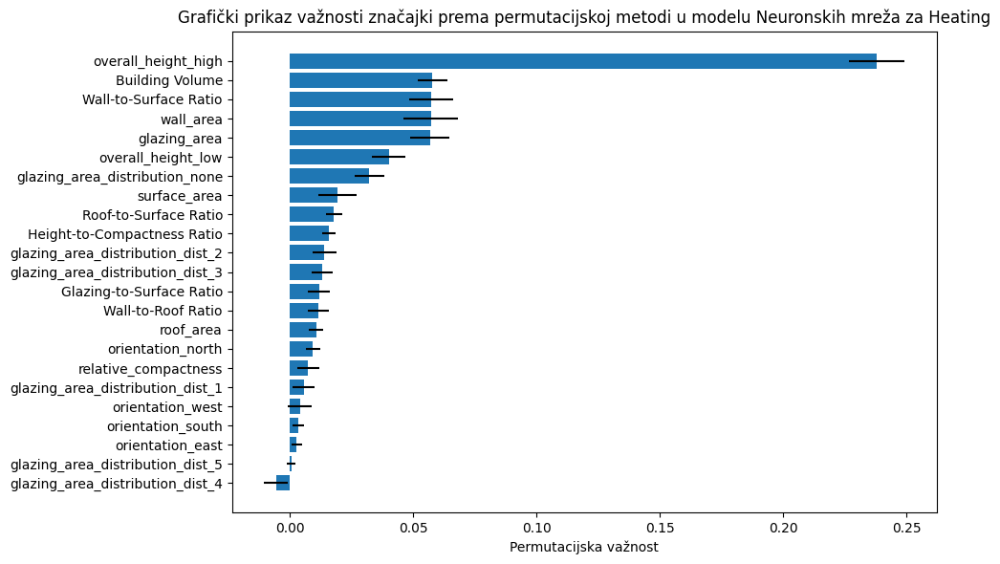

In [ ]:
#Grafički prikaz važnosti značajki prema permutacijskoj metodi u modelu Neuronskih mreža za Heating
graf_permutacijske_vaznosti(vaznost_df_Neu_He, "Grafički prikaz važnosti značajki prema permutacijskoj metodi u modelu Neuronskih mreža za Heating")

PermutationExplainer explainer: 232it [00:39,  4.93it/s]
/tmp/ipykernel_4884/4029197290.py:4: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


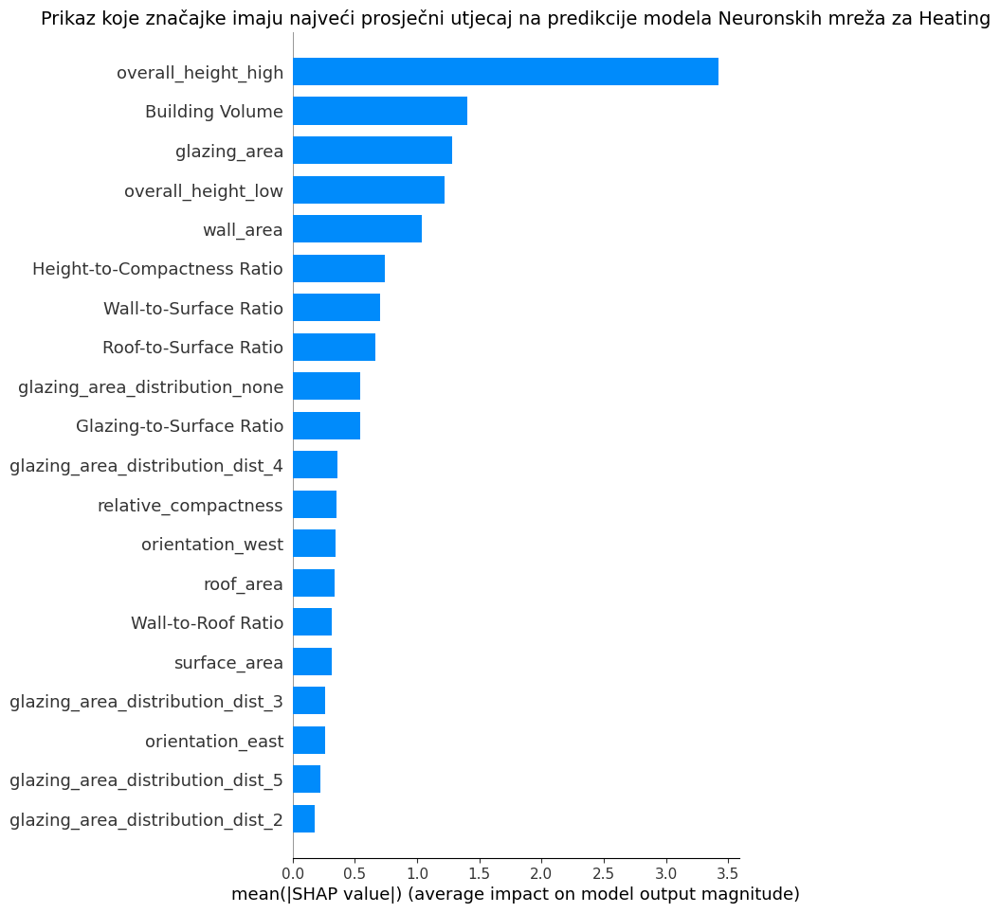

In [ ]:
# Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije modela Neuronskih mreža za Heating
explainer_Neu_He, shap_vrijednosti_Neu_He = kreiraj_shap_vrijednosti(najbolji_model_Neu_He, "neuronske", X_train_final, X_test_final)
shap_summary_bar_dijagram(shap_vrijednosti_Neu_He, X_test_final,"Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije modela Neuronskih mreža za Heating")


/tmp/ipykernel_4884/1040590353.py:4: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vrijednosti, X_test, show=False)


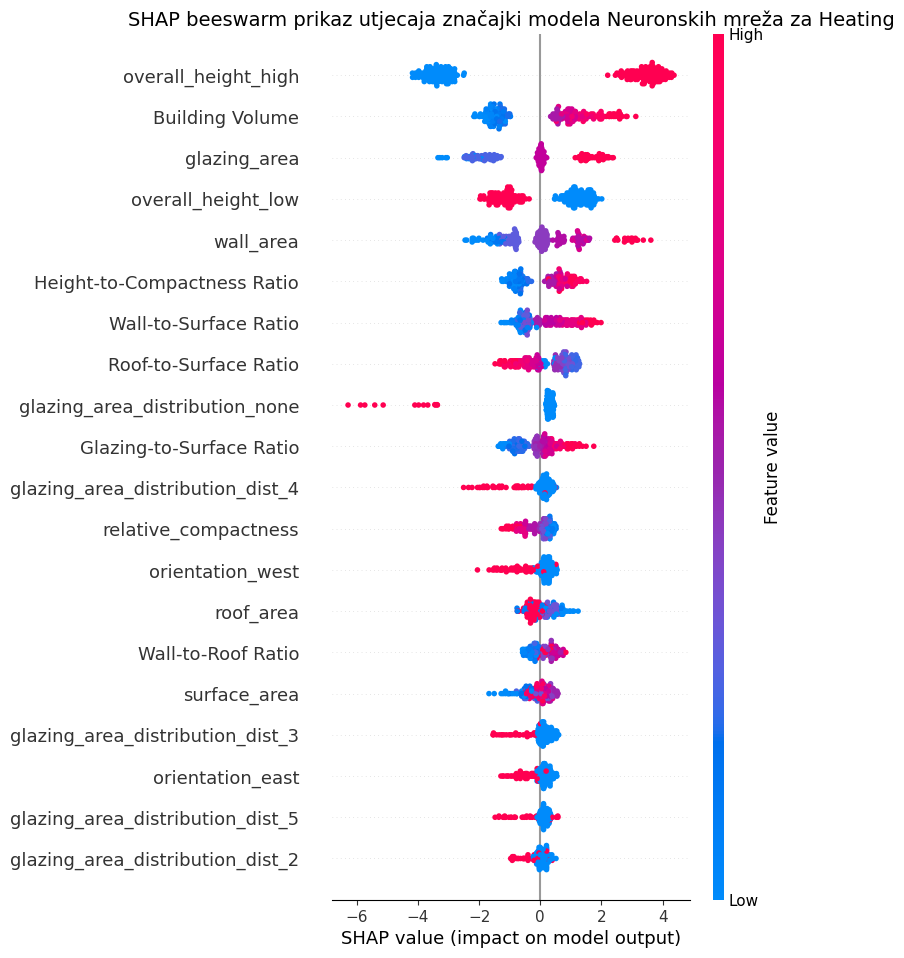

In [ ]:
#Prikaz kako i koliko svaka značajka utječe na predikcije modela Neuronskih mreža za Heating za sve uzorke
shap_beeswarm_dijagram(shap_vrijednosti_Neu_He, X_test_final, 'SHAP beeswarm prikaz utjecaja značajki modela Neuronskih mreža za Heating')


Prikaz za instancu #226


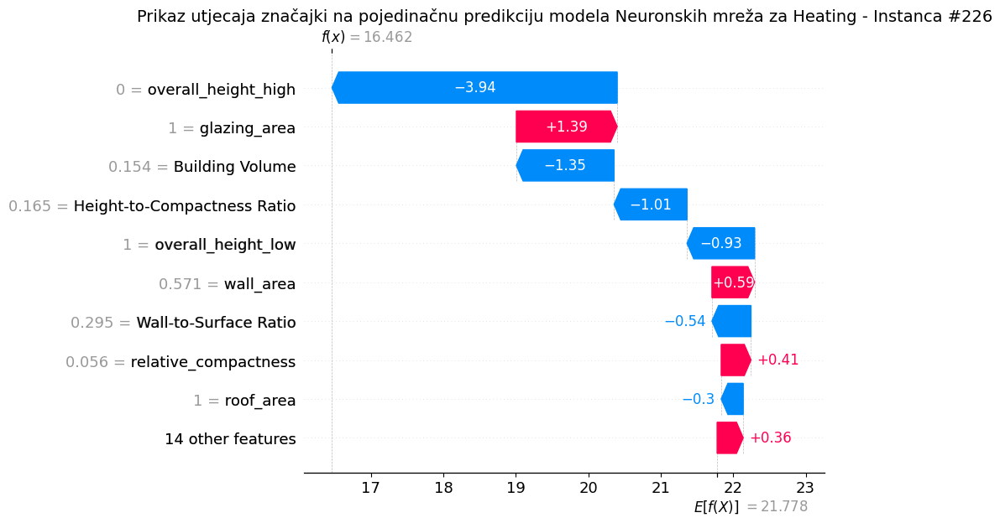


Prikaz za instancu #8


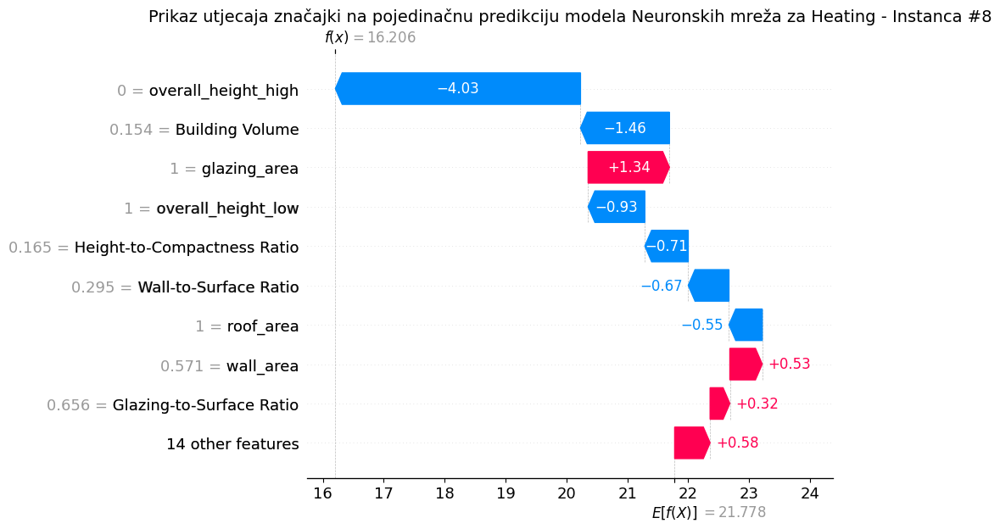


Prikaz za instancu #106


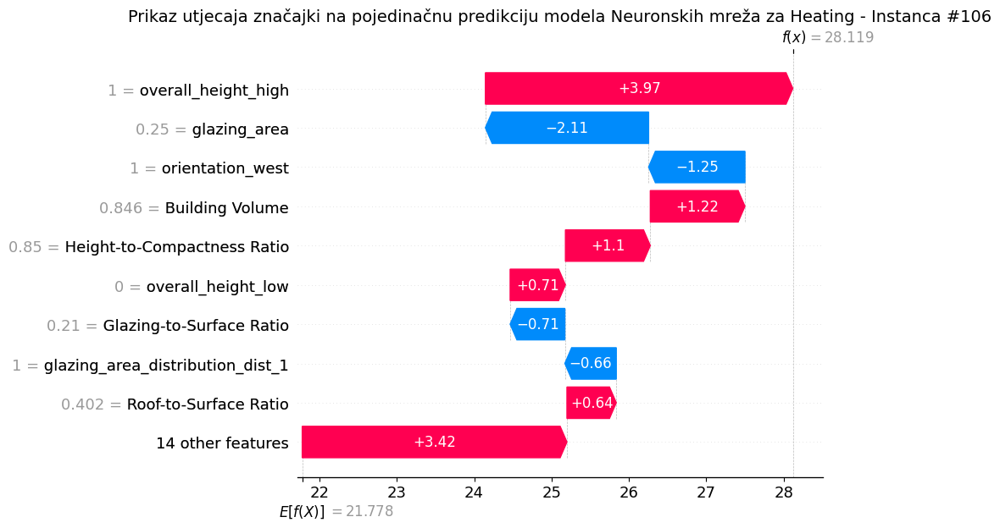


Prikaz za instancu #57


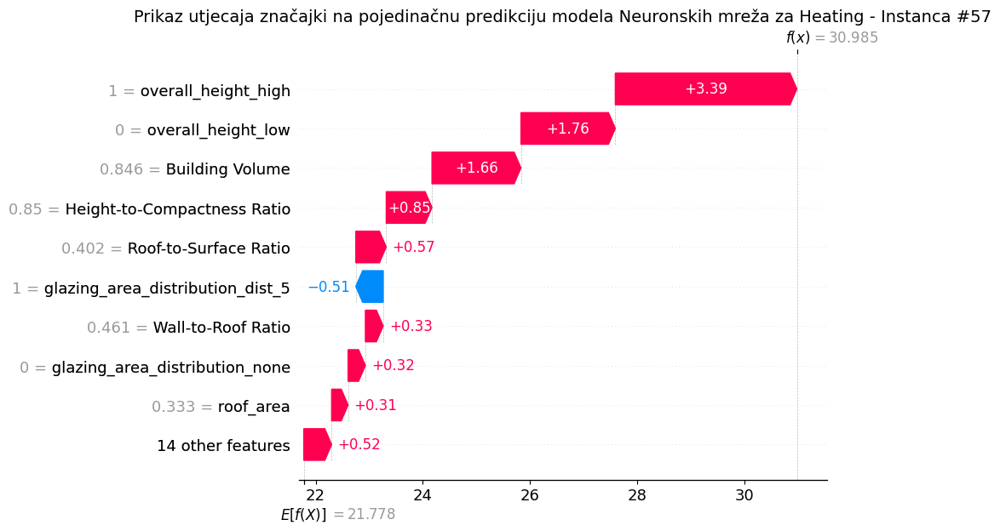


Prikaz za instancu #64


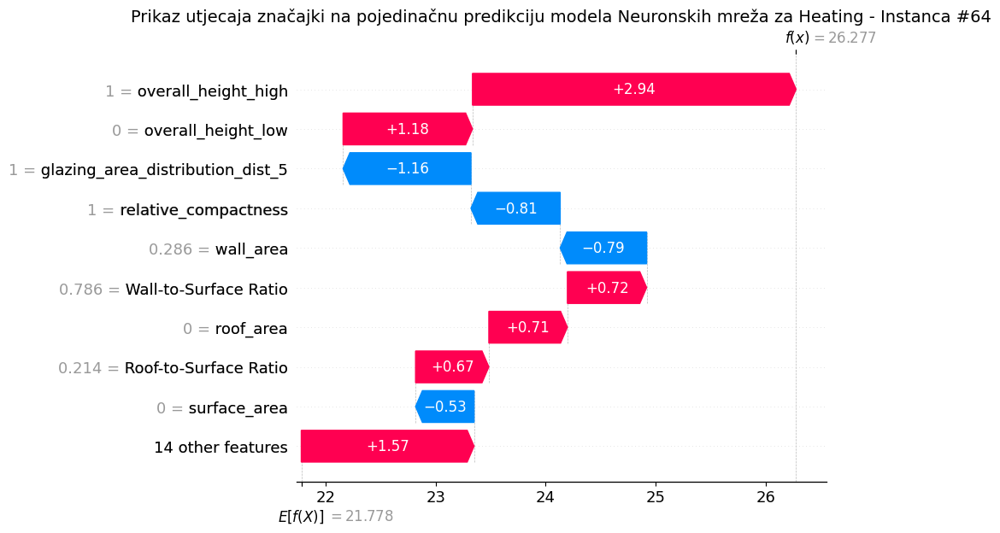

In [ ]:
#Nasumičan odabir 5 uzoraka iz testnog skupa i za svaki od njih se prikazuje SHAP waterfall plot koji detaljno vizualizira kako su pojedine značajke utjecale na konačnu predikciju modela Neuronskih mreža za Heating za tu konkretnu instancu.
shap_waterfall_dijagram(explainer_Neu_He, shap_vrijednosti_Neu_He, "neuronske", X_test_final,"Prikaz utjecaja značajki na pojedinačnu predikciju modela Neuronskih mreža za Heating")

## Optimizacija hiperparametara

In [ ]:
# Optimizacija modela Neuronskih mreža za Heating
tuner = optimiziraj_neuronske_mreze(X_train_He, y_train_He, X_val_He, y_val_He, ime_projekta='Neuronske_mreže_He')
najbolji_model_Neu_He_Hi = tuner.get_best_models(num_models=1)[0]
najbolji_parametri_Neu_He_Hi = tuner.get_best_hyperparameters(1)[0]
def izradi_najbolji_model_He():

    model = tuner.hypermodel.build(najbolji_parametri_Neu_He_Hi)
    return model

Trial 20 Complete [00h 00m 51s]
val_loss: 11.606248537699381

Best val_loss So Far: 0.9525744120279948
Total elapsed time: 00h 20m 17s


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


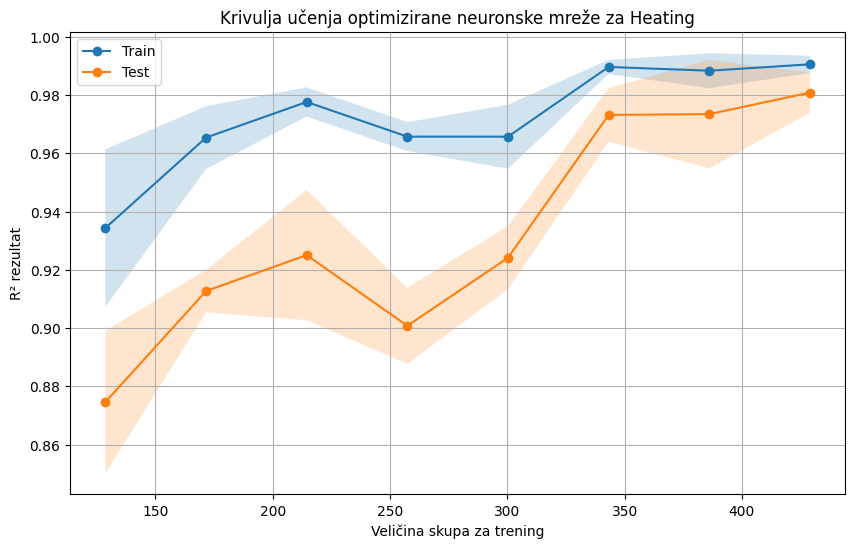

In [ ]:
#Prikaz krivulje učenja optimiziranog modela Neuronskih mreža za Heating
prikaz_krivulje_ucenja_neuronska(X_train_He, y_train_He, X_test_final, y_test_heating, "Krivulja učenja optimizirane neuronske mreže za Heating", model_fn=izradi_najbolji_model_He)

In [ ]:
#Evaluacijske metrike najboljeg rezultata modela Neuronskih mreža za Heating
print("Najbolji hiperparametri:")
print(najbolji_parametri_Neu_He_Hi.values)

y_pred_Neuro_He_Hi, mae_Neu_He_Hi, mse_Neu_He_Hi, rmse_Neu_He_Hi, r2_Neu_He_Hi, mape_Neu_He_Hi, evs_Neu_He_Hi=evaluacija_modela(najbolji_model_Neu_He_Hi, X_test_final, y_test_heating)
y_pred_Neuro_He_Hi=y_pred_Neuro_He_Hi.flatten()
ispis_rezultata(mae_Neu_He_Hi, mse_Neu_He_Hi, rmse_Neu_He_Hi, r2_Neu_He_Hi, mape_Neu_He_Hi, evs_Neu_He_Hi)



Najbolji hiperparametri:
{'broj_slojeva': 3, 'units_0': 256, 'activation_0': 'elu', 'l2_0': 4.302529913223993e-05, 'dropout_0': 0.30000000000000004, 'learning_rate': 0.002001328350043654, 'units_1': 32, 'activation_1': 'relu', 'l2_1': 1e-05, 'dropout_1': 0.0, 'units_2': 32, 'activation_2': 'relu', 'l2_2': 1e-05, 'dropout_2': 0.0}
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
MAE: 0.6301
MSE: 0.7077
RMSE: 0.8413
R²: 0.9930
MAPE: 0.0307
EVS: 0.9933


# **Rangiranje predikcija-heating_load**

In [ ]:
#Rangiranje modela za Heating prema evaluacijskim metrikama
modeli_He = ['Linearna regresija', 'Neuronske mreže', 'Stablo odlučivanja', 'KNN']

df_heating = napravi_rang_df(
    modeli_He,
    [mae_Lin_He, mae_Neu_mean, mae_Sta_He, mae_KNN_He],
    [mse_Lin_He, mse_Neu_mean, mse_Sta_He, mse_KNN_He],
    [rmse_Lin_He, rmse_Neu_mean, rmse_Sta_He, rmse_KNN_He],
    [r2_Lin_He, r2_Neu_mean, r2_Sta_He, r2_KNN_He],
    [mape_Lin_He, mape_Neu_mean, mape_Sta_He, mape_KNN_He],
    [evs_Lin_He, evs_Neu_mean, evs_Sta_He, evs_KNN_He]
)

print(df_heating)

                Model       MAE        MSE      RMSE        R2      MAPE  \
2  Stablo odlučivanja  0.997084   1.785973  1.336403  0.982386  0.044868   
0  Linearna regresija  1.488557   3.448154  1.856920  0.965994  0.081900   
1     Neuronske mreže  2.074963   8.570747  2.925968  0.915474  0.088422   
3                 KNN  2.711091  14.090148  3.753685  0.861040  0.116878   

        EVS  Rang_MAE  Rang_MSE  Rang_MAPE  Rang_R2  Rang_EVS  Prosječni_rang  
2  0.982394       1.0       1.0        1.0      1.0       1.0             1.0  
0  0.966087       2.0       2.0        2.0      2.0       2.0             2.0  
1  0.918628       3.0       3.0        3.0      3.0       3.0             3.0  
3  0.861250       4.0       4.0        4.0      4.0       4.0             4.0  


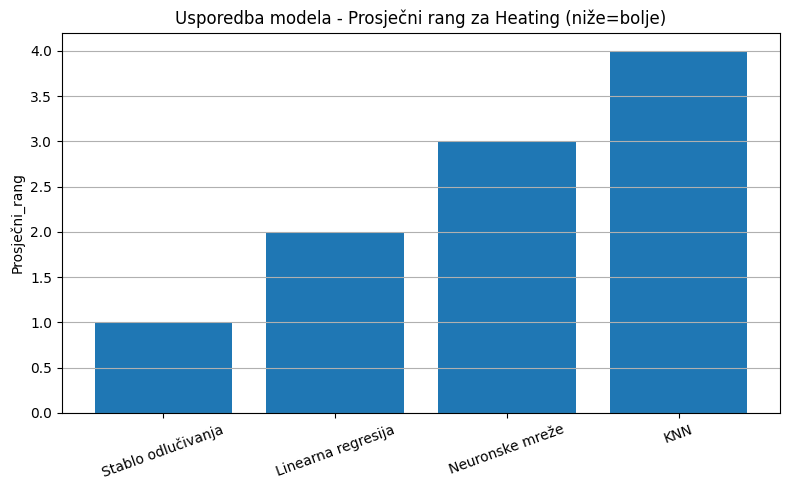

In [ ]:
#Grafički prikaz usporedbe uspješnosti regresijskih modela bez optimizacije parametara prema prosječnom rangu evaluacijskih metrika
prikaz_usporedbe_modela(df_heating, 'Usporedba modela - Prosječni rang za Heating (niže=bolje)', 'Prosječni_rang')

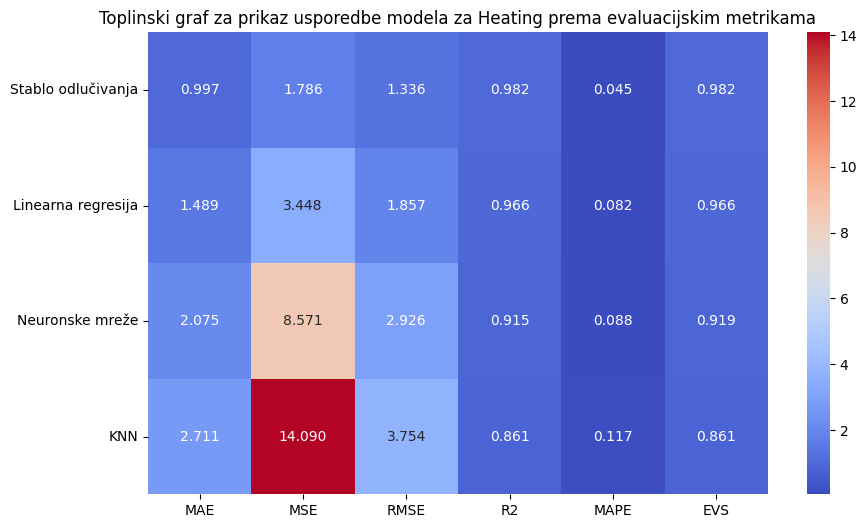

In [ ]:
#Toplinski graf za prikaz usporedbe regresijskih modela bez optimizacije parametara za Heating prema evaluacijskim metrikama
prikaz_toplinskog_grafa_usporedbe_modela(df_heating, 'Toplinski graf za prikaz usporedbe modela za Heating prema evaluacijskim metrikama')

In [ ]:
#Rangiranje optimiziranog modela za Heating prema evaluacijskim metrikama
modeli_He_Hi = ['Linearna regresija', 'Neuronske mreže', 'Stablo odlučivanja', 'KNN']

df_heating_Hi = napravi_rang_df(
    modeli_He_Hi,
    [mae_Lin_He_Hi, mae_Neu_He_Hi, mae_Sta_He_Hi, mae_KNN_He_Hi],
    [mse_Lin_He_Hi, mse_Neu_He_Hi, mse_Sta_He_Hi, mse_KNN_He_Hi],
    [rmse_Lin_He_Hi, rmse_Neu_He_Hi, rmse_Sta_He_Hi, rmse_KNN_He_Hi],
    [r2_Lin_He_Hi, r2_Neu_He_Hi, r2_Sta_He_Hi, r2_KNN_He_Hi],
    [mape_Lin_He_Hi, mape_Neu_He_Hi, mape_Sta_He_Hi, mape_KNN_He_Hi],
    [evs_Lin_He_Hi, evs_Neu_He_Hi, evs_Sta_He_Hi, evs_KNN_He_Hi]
)

print(df_heating_Hi)

                Model       MAE       MSE      RMSE        R2      MAPE  \
2  Stablo odlučivanja  0.353162  0.272408  0.521927  0.997313  0.014632   
1     Neuronske mreže  0.630062  0.707739  0.841272  0.993020  0.030668   
0  Linearna regresija  1.576270  4.532126  2.128879  0.955303  0.076825   
3                 KNN  1.876410  5.855496  2.419813  0.942252  0.093739   

        EVS  Rang_MAE  Rang_MSE  Rang_MAPE  Rang_R2  Rang_EVS  Prosječni_rang  
2  0.997337       1.0       1.0        1.0      1.0       1.0             1.0  
1  0.993332       2.0       2.0        2.0      2.0       2.0             2.0  
0  0.955549       3.0       3.0        3.0      3.0       3.0             3.0  
3  0.942286       4.0       4.0        4.0      4.0       4.0             4.0  


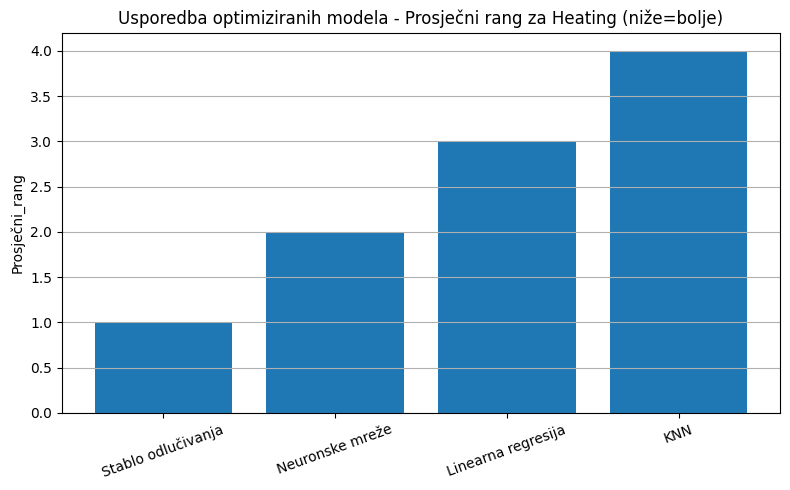

In [ ]:
#Grafički prikaz usporedbe uspješnosti regresijskih modela s optimizacijom parametara za Heating prema prosječnom rangu evaluacijskih metrika
prikaz_usporedbe_modela(df_heating_Hi, 'Usporedba optimiziranih modela - Prosječni rang za Heating (niže=bolje)','Prosječni_rang')

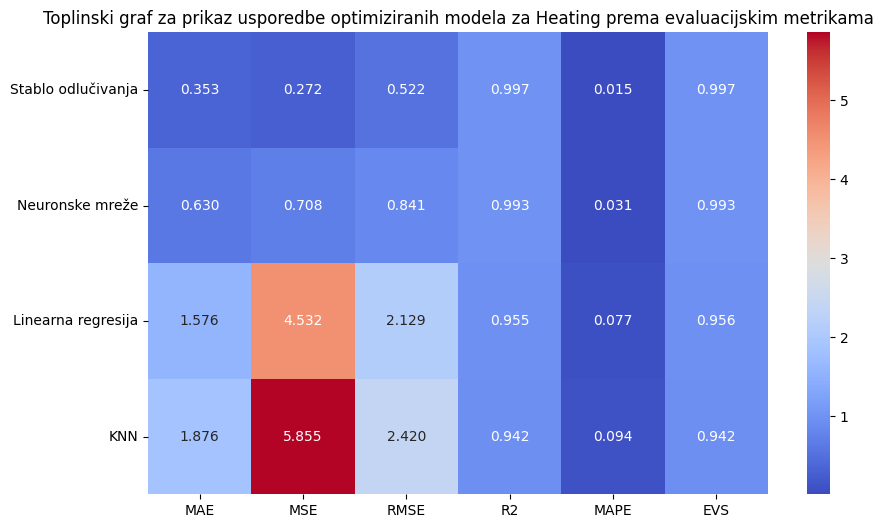

In [ ]:
#Toplinski graf za prikaz usporedbe regresijskih modela s optimizacijom parametara za Heating prema evaluacijskim metrikama
prikaz_toplinskog_grafa_usporedbe_modela(df_heating_Hi, 'Toplinski graf za prikaz usporedbe optimiziranih modela za Heating prema evaluacijskim metrikama')

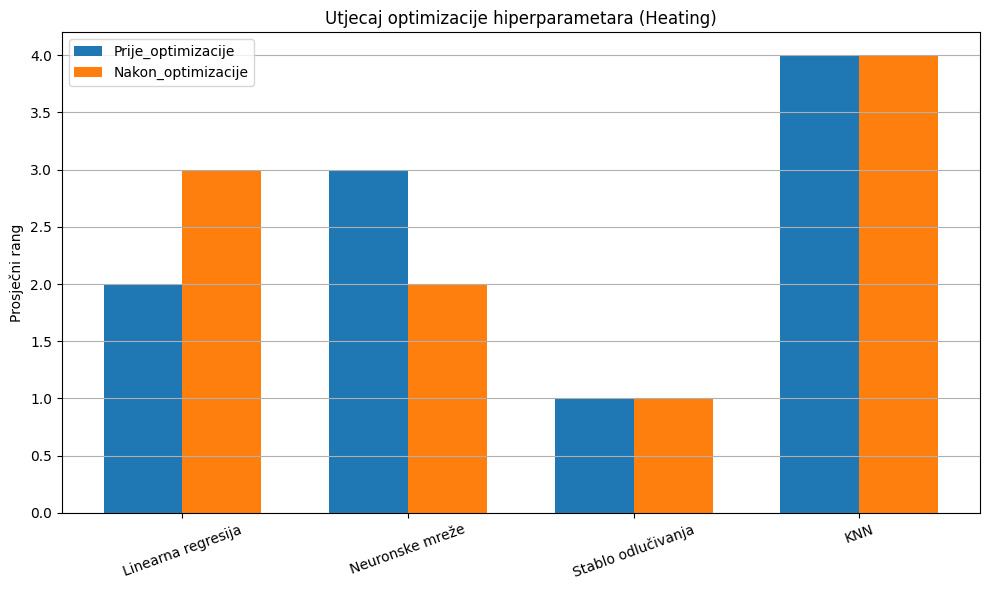

In [ ]:
#Grafički prikaz usporedbe regresijskih modela prije i nakon optimizacije parametara za Heating
usporedba_Heating = prikaz_usporedbe_rangova(df_heating, df_heating_Hi, "Utjecaj optimizacije hiperparametara (Heating)", "Prije_optimizacije", "Nakon_optimizacije")

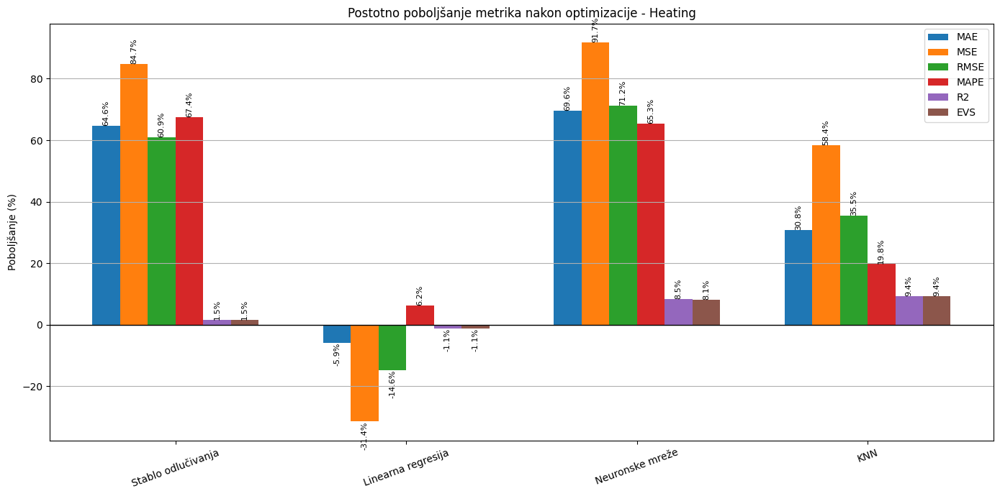

In [ ]:
#Graf za postotno poboljšanje metrika nakon optimizacije Heating za svaku metriku
poboljsanja_heating = prikaz_postotnog_poboljsanja_metrika(df_heating, df_heating_Hi,'Postotno poboljšanje metrika nakon optimizacije - Heating')

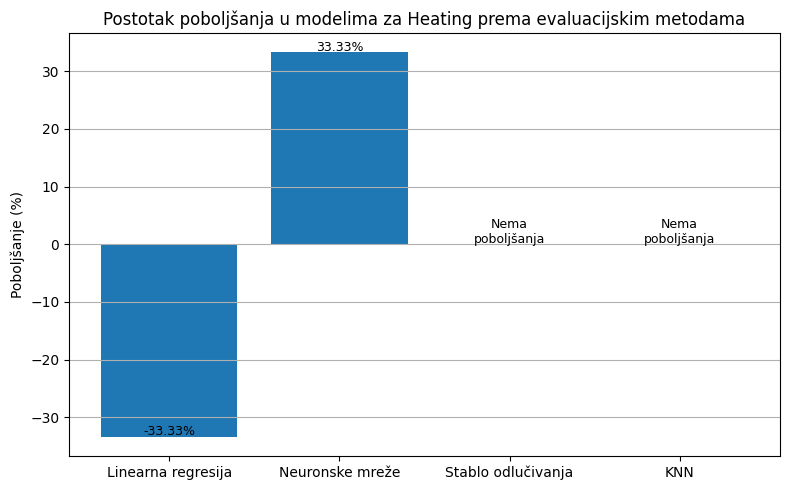

In [ ]:
#Postotak poboljšanja u modelima za Heating prema evaluacijskim metodama
prikaz_postotnog_poboljsanja(usporedba_Heating,"Postotak poboljšanja u modelima za Heating prema evaluacijskim metodama")

# **Linearna regresija-cooling_load**

In [ ]:
#Linearna regresija za Cooling
model_Lin_Coo = LinearRegression()
model_Lin_Coo.fit(X_train_final, y_train_cooling)

LinearRegression()

## Evaluacija modela

In [ ]:
#Provjera overfittinga - linearna regresija za Cooling
provjera_overfittinga(model_Lin_Coo, X_train_final, X_test_final, y_train_cooling, y_test_cooling)

Train R²: 0.9302
Test R²: 0.9312


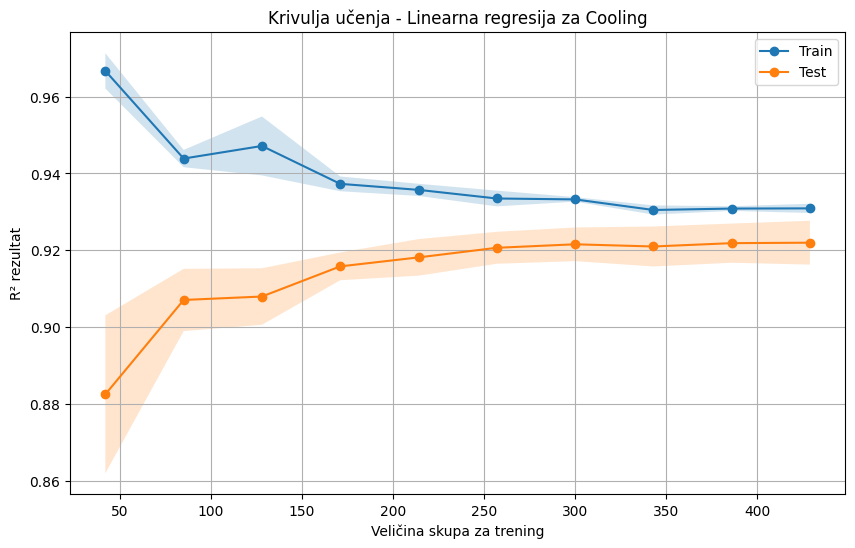

In [ ]:
#Prikaz krivulje učenja za linearnu regresiju za Cooling
prikaz_krivulje_ucenja(model_Lin_Coo, X_train_final, y_train_cooling, "Krivulja učenja - Linearna regresija za Cooling")

In [ ]:
#Evaluacija linearne regresije za Cooling

y_pred_Lin_Co, mae_Lin_Co, mse_Lin_Co, rmse_Lin_Co, r2_Lin_Co, mape_Lin_Co, evs_Lin_Co=evaluacija_modela(model_Lin_Coo, X_test_final, y_test_cooling)
ispis_rezultata(mae_Lin_Co, mse_Lin_Co, rmse_Lin_Co, r2_Lin_Co, mape_Lin_Co, evs_Lin_Co)

MAE: 1.9132
MSE: 6.2029
RMSE: 2.4906
R²: 0.9312
MAPE: 0.0802
EVS: 0.9318


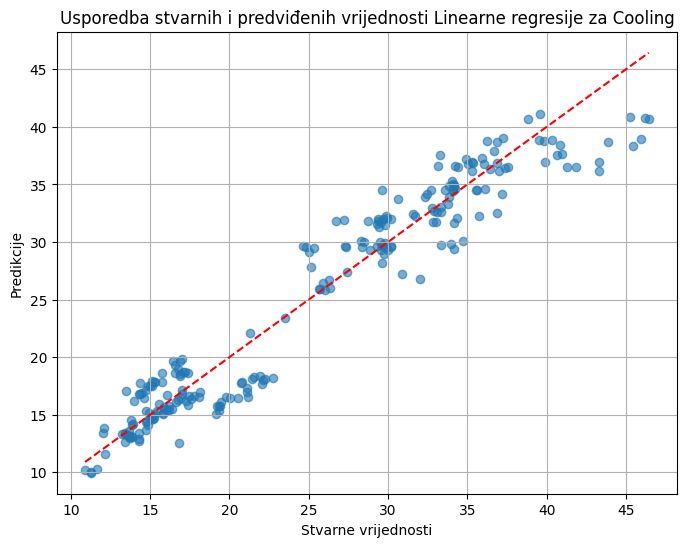

In [ ]:
#Dijagram raspršenja između stvarnih i predviđanih vrijednosti Linearne regresije za Cooling
prikaz_stvarnih_i_predikcija(y_test_cooling, y_pred_Lin_Co, "Usporedba stvarnih i predviđenih vrijednosti Linearne regresije za Cooling")

## Najznačajnije značajke

In [ ]:
#Procjena koliko je svaka značajka važna za točnost modela Linearne regresije za Cooling tako što mjeri pad performanse (R²) nakon nasumičnog miješanja vrijednosti te značajke
nazivi_znacajki = X_train_final.columns
vaznost_df_Lin_Co=izracun_permutacijske_vaznosti(model_Lin_Coo, X_test_final, y_test_cooling, nazivi_znacajki)

                            Značajka     Važnost  Standardna devijacija
17                   Building Volume  591.122456              27.611313
5                 overall_height_low  160.546343               9.798499
4                overall_height_high  160.546343               9.798499
22       Height-to-Compactness Ratio   64.673262               3.111624
20                Wall-to-Roof Ratio   52.271323               3.564512
15                         roof_area   29.874071               2.045972
12              relative_compactness   20.137863               1.674623
19             Roof-to-Surface Ratio   10.029508               0.677374
18             Wall-to-Surface Ratio   10.029508               0.677374
13                      surface_area    8.701378               0.715523
21          Glazing-to-Surface Ratio    0.446567               0.031985
16                      glazing_area    0.140002               0.009765
11    glazing_area_distribution_none    0.002803               0

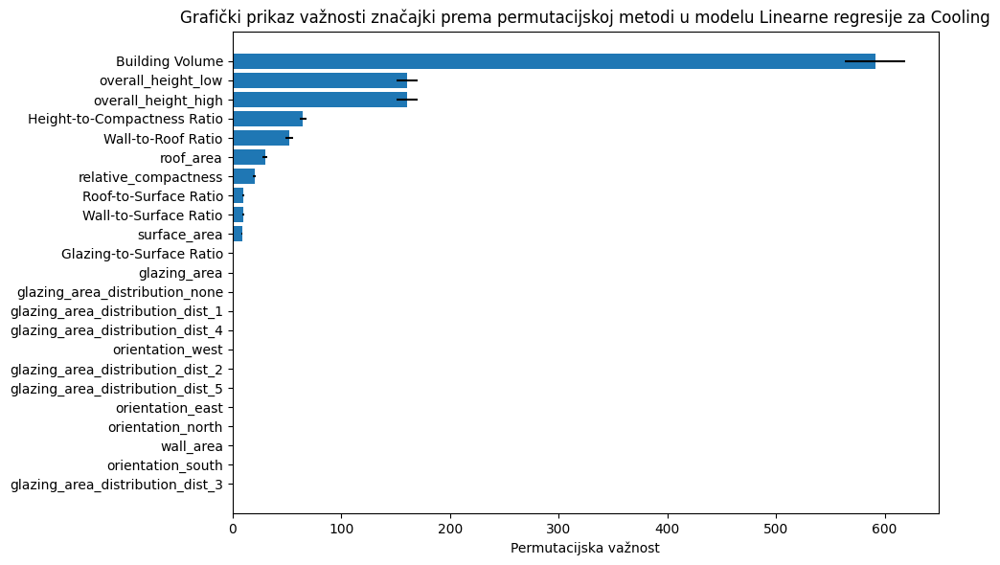

In [ ]:
#Grafički prikaz važnosti značajki prema permutacijskoj metodi u modelu Linearne regresije za Cooling
graf_permutacijske_vaznosti(vaznost_df_Lin_Co, "Grafički prikaz važnosti značajki prema permutacijskoj metodi u modelu Linearne regresije za Cooling")

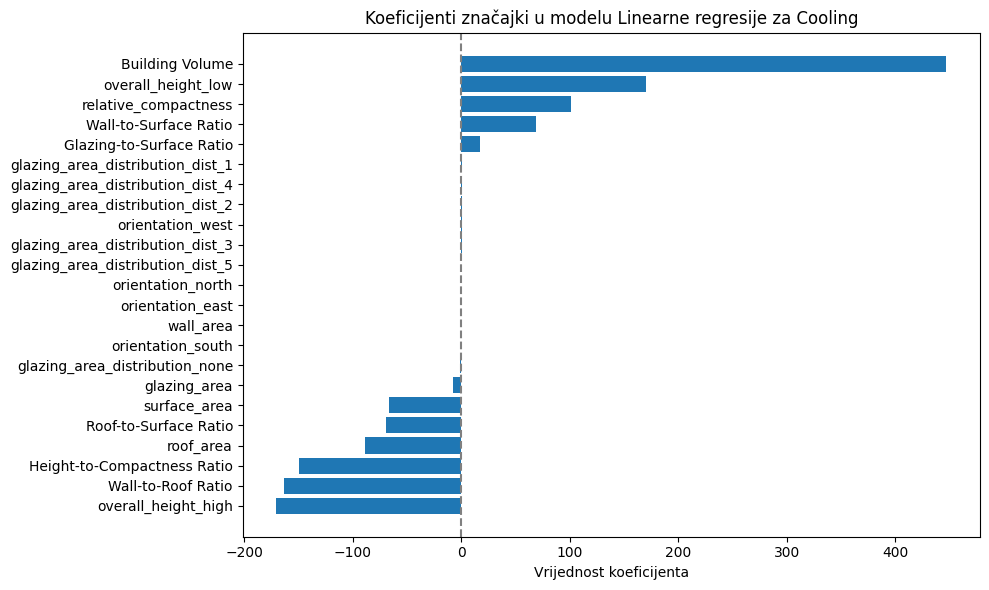

In [ ]:
# Grafički prikaz koeficijenata značajki u modelu Linearne regresije za Cooling
koeficijenti_značajki(model_Lin_Coo, " za Cooling")

/tmp/ipykernel_4884/4029197290.py:4: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


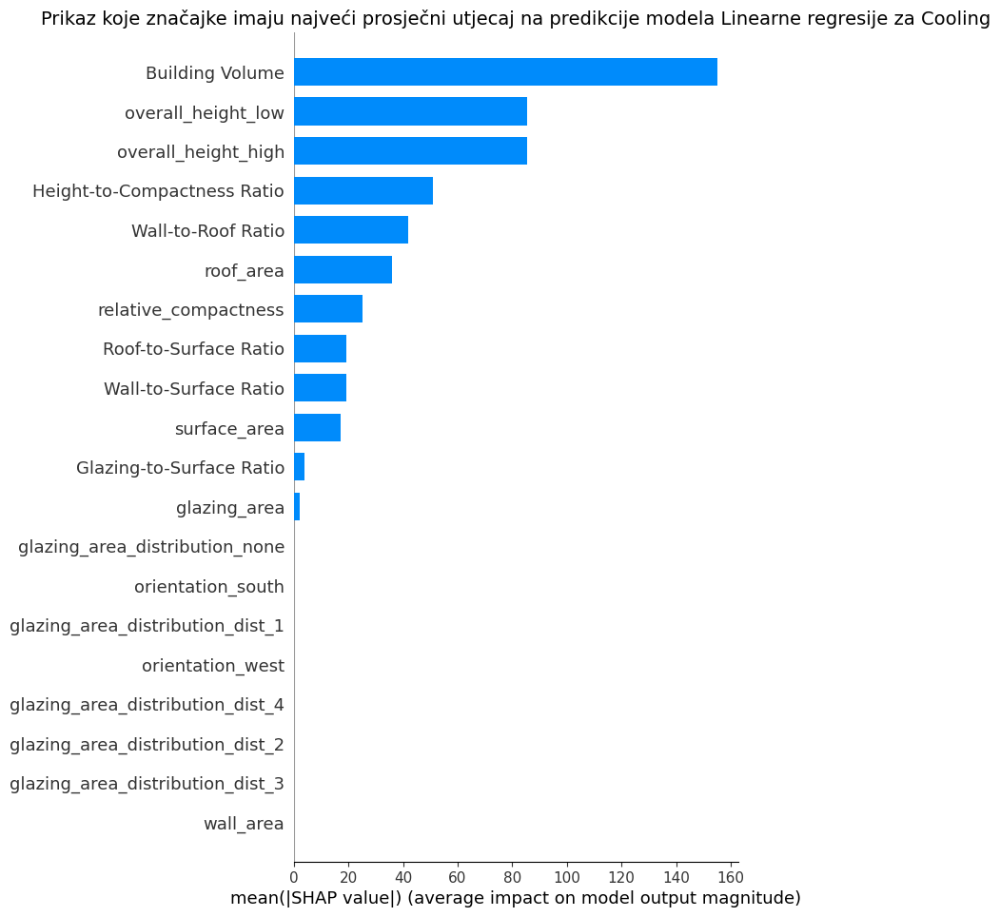

In [ ]:
# Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije modela Linerne regresije za Cooling
explainer_Lin_Co, shap_vrijednosti_Lin_Co = kreiraj_shap_vrijednosti(model_Lin_Coo, "linearni", X_train_final, X_test_final)
shap_summary_bar_dijagram(shap_vrijednosti_Lin_Co, X_test_final,"Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije modela Linearne regresije za Cooling")

/tmp/ipykernel_4884/1040590353.py:4: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vrijednosti, X_test, show=False)


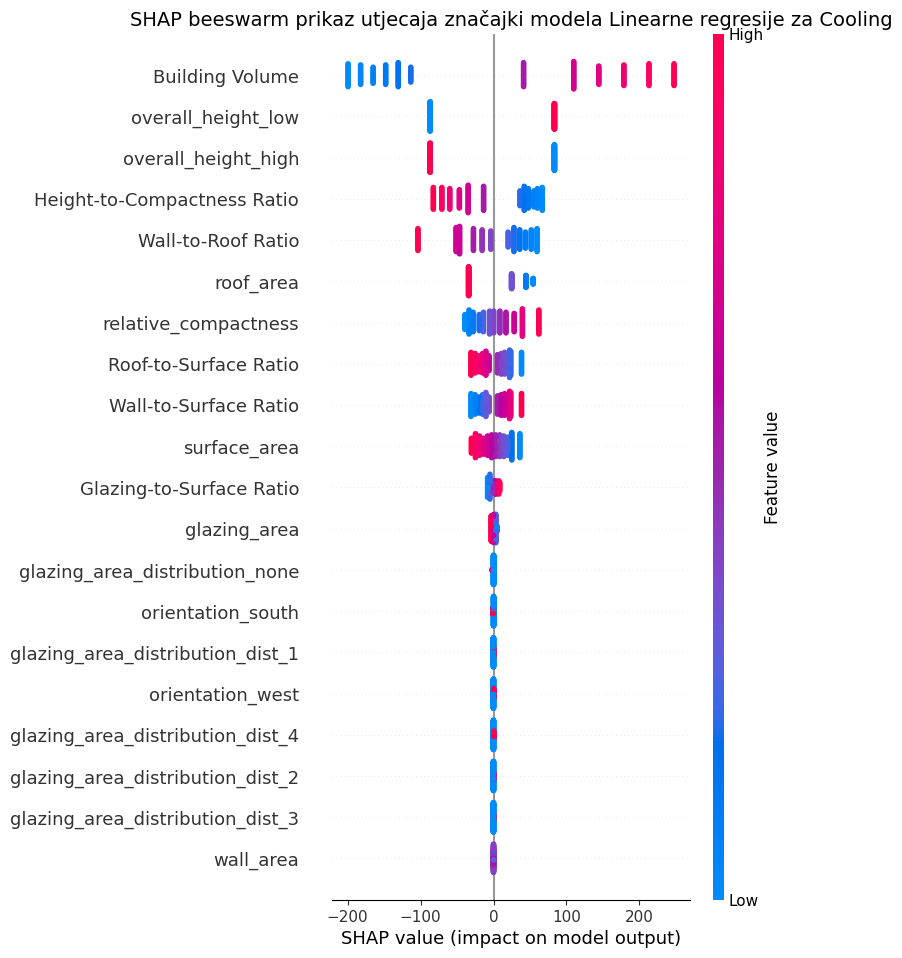

In [ ]:
#Prikaz kako i koliko svaka značajka utječe na predikcije modela Linearne regresije za Cooling za sve uzorke
shap_beeswarm_dijagram(shap_vrijednosti_Lin_Co, X_test_final, 'SHAP beeswarm prikaz utjecaja značajki modela Linearne regresije za Cooling')


Prikaz za instancu #114


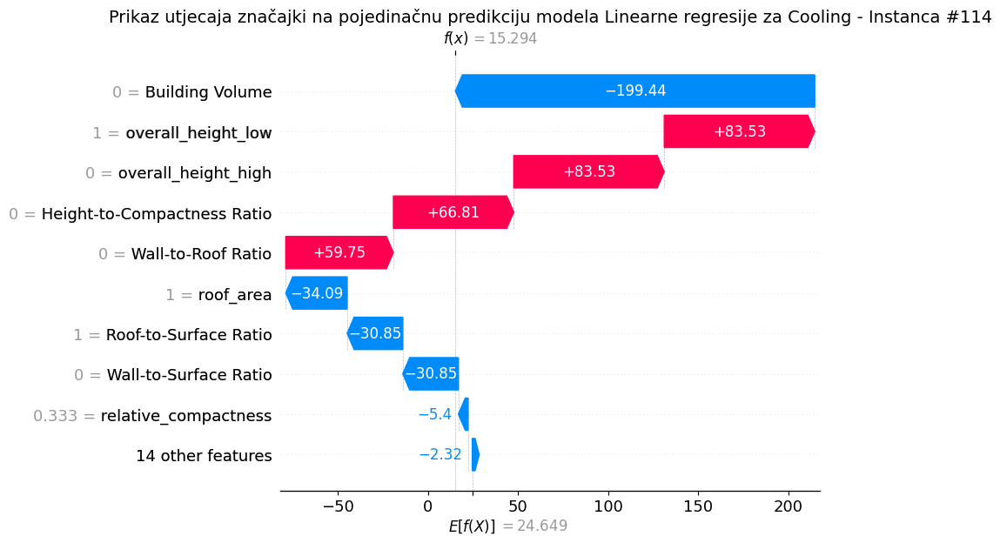


Prikaz za instancu #106


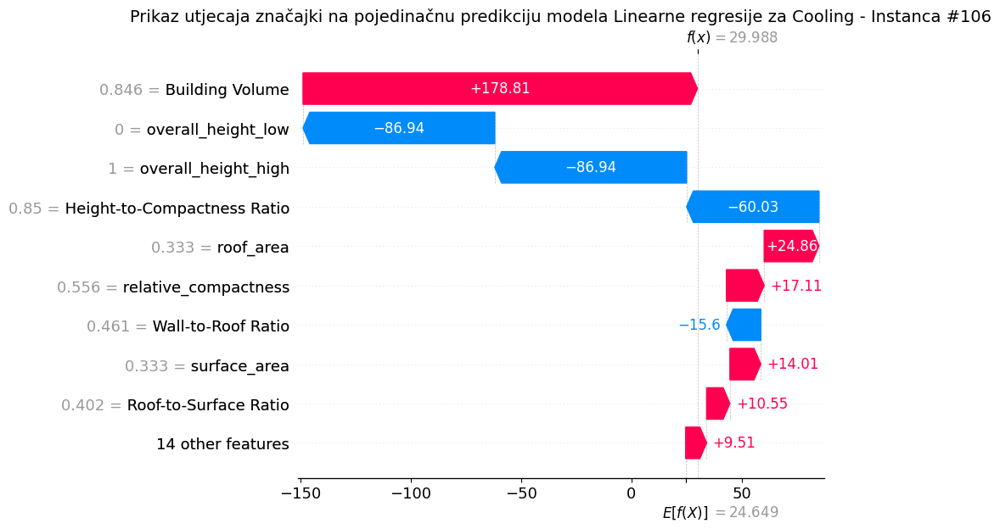


Prikaz za instancu #75


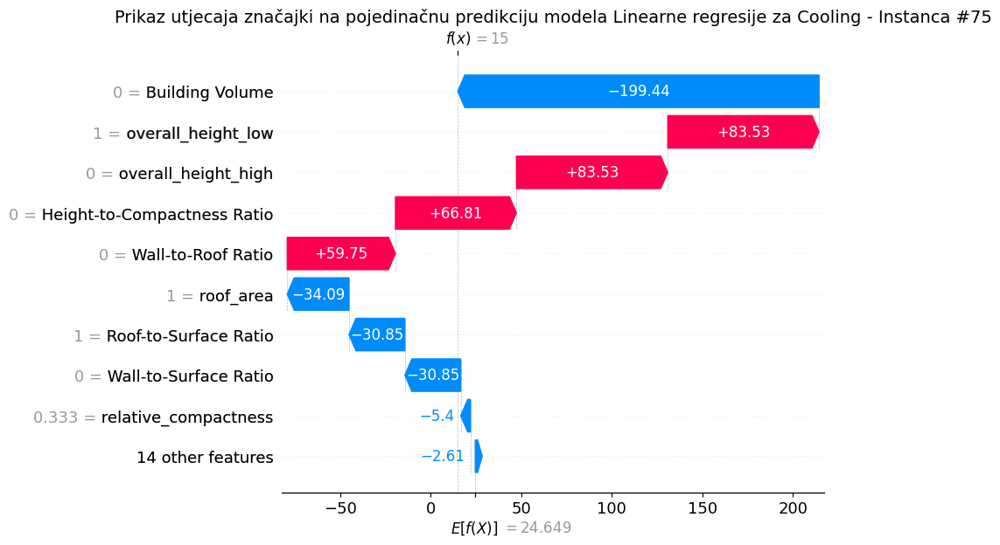


Prikaz za instancu #36


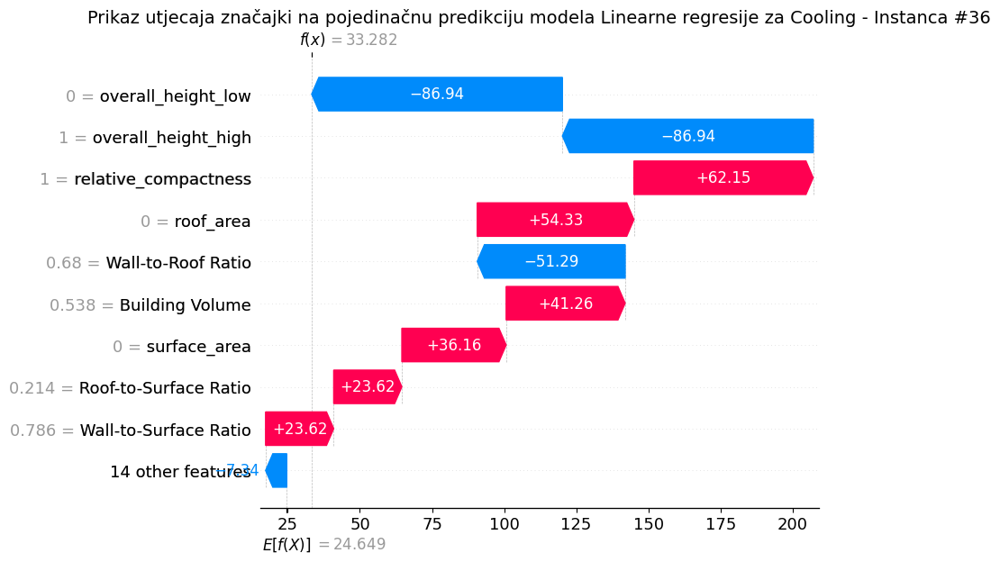


Prikaz za instancu #227


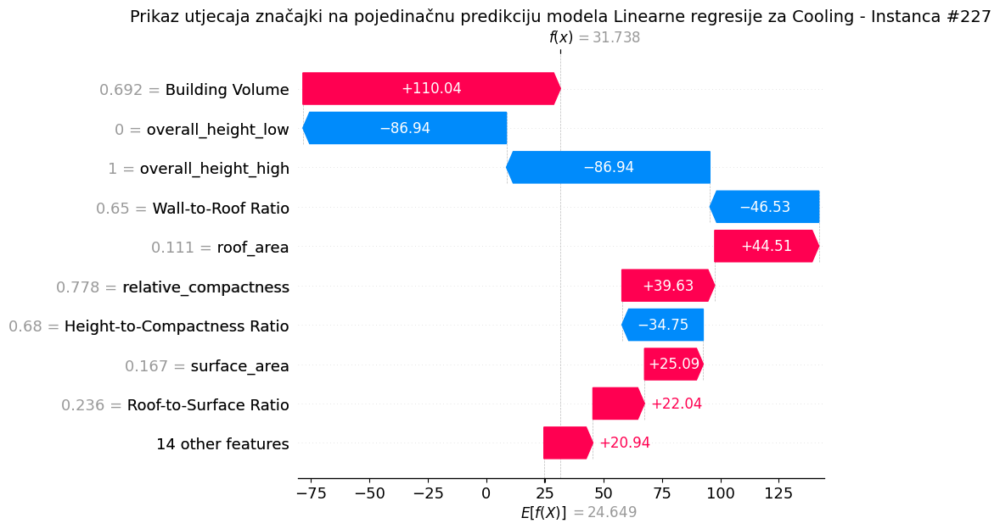

In [ ]:
#Nasumičan odabir 5 uzoraka iz testnog skupa i za svaki od njih se prikazuje SHAP waterfall plot koji detaljno vizualizira kako su pojedine značajke utjecale na konačnu predikciju modela Linearne regresije za Cooling za tu konkretnu instancu.
shap_waterfall_dijagram(explainer_Lin_Co, shap_vrijednosti_Lin_Co, "linearni", X_test_final, "Prikaz utjecaja značajki na pojedinačnu predikciju modela Linearne regresije za Cooling")

## Podešavanje hiperparametara

In [ ]:
# Optimizacija modela Linearne regresije za Cooling
lasso = Lasso(max_iter=200000)

param_grid_lasso = {'alpha': np.logspace(-3, 2, 50)}

optimizirani_model_Lin_Co, optimizirani_parametri_Lin_Co, optimizirani_r2_Lin_Co= optimiziraj_model(lasso, param_grid_lasso, X_train_final, y_train_cooling)

optimizirana_alfa_Lin_Co = optimizirani_parametri_Lin_Co['alpha']

print("Najbolja alfa:", optimizirani_parametri_Lin_Co)

Najbolja alfa: {'alpha': np.float64(0.001)}


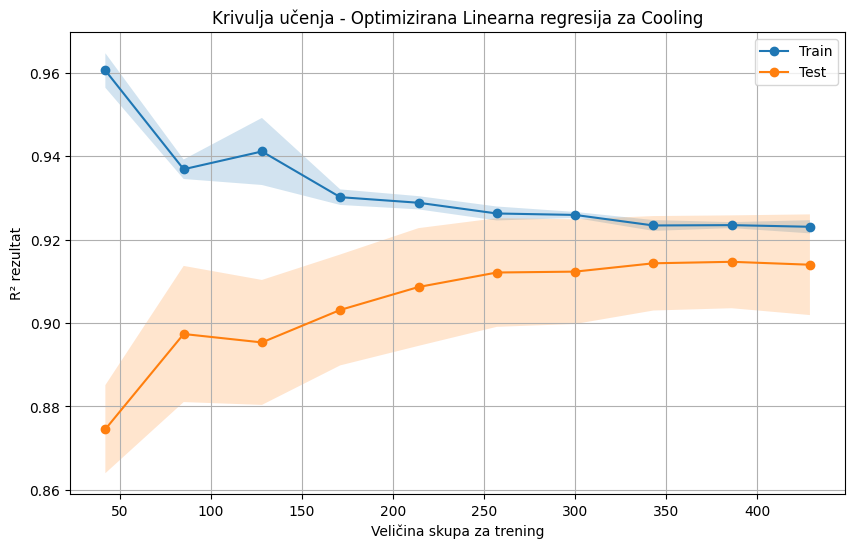

In [ ]:
# Krivulja učenja nakon optimizacije Linearne regresije za Cooling
prikaz_krivulje_ucenja(optimizirani_model_Lin_Co, X_train_final, y_train_cooling, "Krivulja učenja - Optimizirana Linearna regresija za Cooling")


In [ ]:
#Evaluacija modela nakon optimizacije Linearne regresije za Cooling

print(f" Evaluacija optimiziranog modela Linearne regresije za Cooling(alfa={optimizirana_alfa_Lin_Co})")
y_pred_Lin_Co_opt, mae_Lin_Co_Hi, mse_Lin_Co_Hi, rmse_Lin_Co_Hi, r2_Lin_Co_Hi, mape_Lin_Co_Hi, evs_Lin_Co_Hi=evaluacija_modela(optimizirani_model_Lin_Co, X_test_final, y_test_cooling)
ispis_rezultata(mae_Lin_Co_Hi, mse_Lin_Co_Hi, rmse_Lin_Co_Hi, r2_Lin_Co_Hi, mape_Lin_Co_Hi, evs_Lin_Co_Hi)


 Evaluacija optimiziranog modela Linearne regresije za Cooling(alfa=0.001)
MAE: 1.9092
MSE: 7.1161
RMSE: 2.6676
R²: 0.9211
MAPE: 0.0769
EVS: 0.9220


# **KNN-cooling_load**

In [ ]:
# Kreiranje KNN modela za Cooling

knn_Coo = KNeighborsRegressor()
knn_Coo.fit(X_train_final, y_train_cooling)

KNeighborsRegressor()

## Evaluacija modela

In [ ]:
#Provjera overfittinga- KNN za Cooling
provjera_overfittinga(knn_Coo, X_train_final, X_test_final, y_train_cooling, y_test_cooling)

Train R²: 0.9020
Test R²: 0.8404


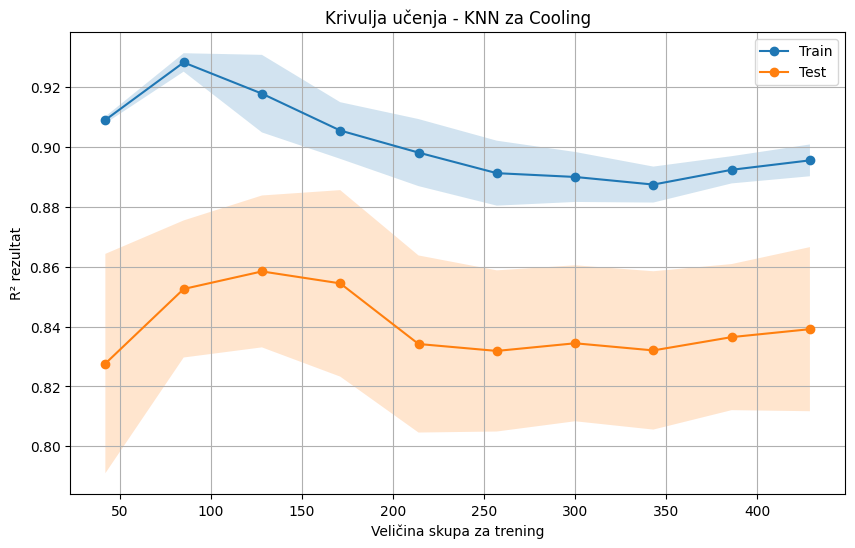

In [ ]:
#Prikaz krivulje učenja za KNN model za Cooling
prikaz_krivulje_ucenja(knn_Coo, X_train_final, y_train_cooling, "Krivulja učenja - KNN za Cooling")

In [ ]:
# Evaluacijske metrike KNN modela za Cooling

y_pred_KNN_Co, mae_KNN_Co, mse_KNN_Co, rmse_KNN_Co, r2_KNN_Co, mape_KNN_Co, evs_KNN_Co=evaluacija_modela(knn_Coo, X_test_final, y_test_cooling)
ispis_rezultata(mae_KNN_Co, mse_KNN_Co, rmse_KNN_Co, r2_KNN_Co, mape_KNN_Co, evs_KNN_Co)

MAE: 2.8254
MSE: 14.3860
RMSE: 3.7929
R²: 0.8404
MAPE: 0.1075
EVS: 0.8404


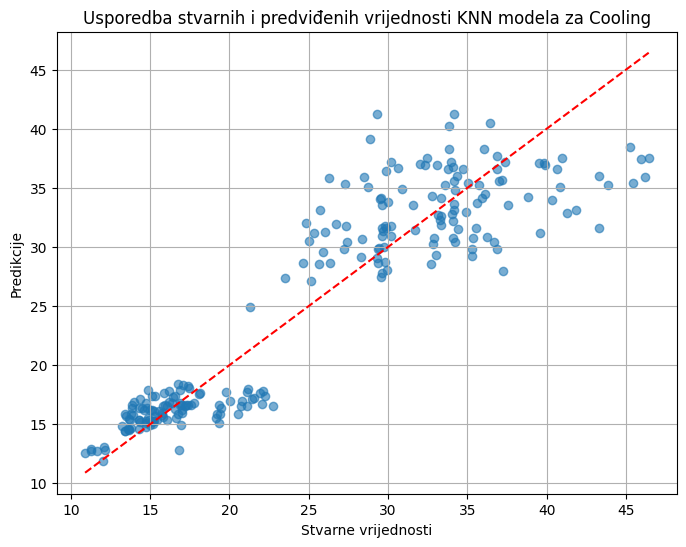

In [ ]:
#Dijagram raspršenja između stvarnih i predviđanih vrijednosti KNN modela za Cooling
prikaz_stvarnih_i_predikcija(y_test_cooling, y_pred_KNN_Co, "Usporedba stvarnih i predviđenih vrijednosti KNN modela za Cooling")

## Najznačajnije značajke


In [ ]:
#Procjena koliko je svaka značajka važna za točnost KNN modela za Cooling tako što mjeri pad performanse (R²) nakon nasumičnog miješanja vrijednosti te značajke.
nazivi_znacajki = X_train_final.columns
vaznost_df_Knn_Co=izracun_permutacijske_vaznosti(knn_Coo, X_test_final, y_test_cooling, nazivi_znacajki)

                            Značajka   Važnost  Standardna devijacija
16                      glazing_area  0.030821               0.005086
21          Glazing-to-Surface Ratio  0.018086               0.004696
14                         wall_area  0.009761               0.006009
12              relative_compactness  0.008971               0.003186
13                      surface_area  0.007960               0.001869
15                         roof_area  0.007119               0.001869
18             Wall-to-Surface Ratio  0.006492               0.002101
19             Roof-to-Surface Ratio  0.006492               0.002101
20                Wall-to-Roof Ratio  0.006234               0.001321
22       Height-to-Compactness Ratio  0.006122               0.003206
17                   Building Volume  0.005825               0.003137
11    glazing_area_distribution_none  0.001130               0.001665
4                overall_height_high  0.000003               0.000003
5                 ov

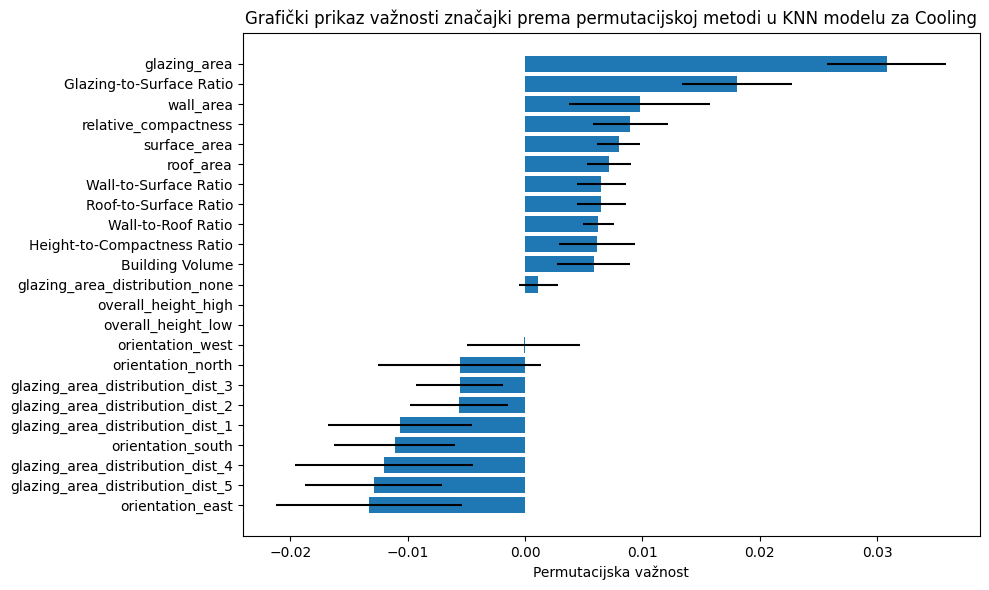

In [ ]:
#Grafički prikaz važnosti značajki prema permutacijskoj metodi u KNN modelu za Cooling
graf_permutacijske_vaznosti(vaznost_df_Knn_Co, "Grafički prikaz važnosti značajki prema permutacijskoj metodi u KNN modelu za Cooling")

  0%|          | 0/231 [00:00<?, ?it/s]

/tmp/ipykernel_4884/4029197290.py:4: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


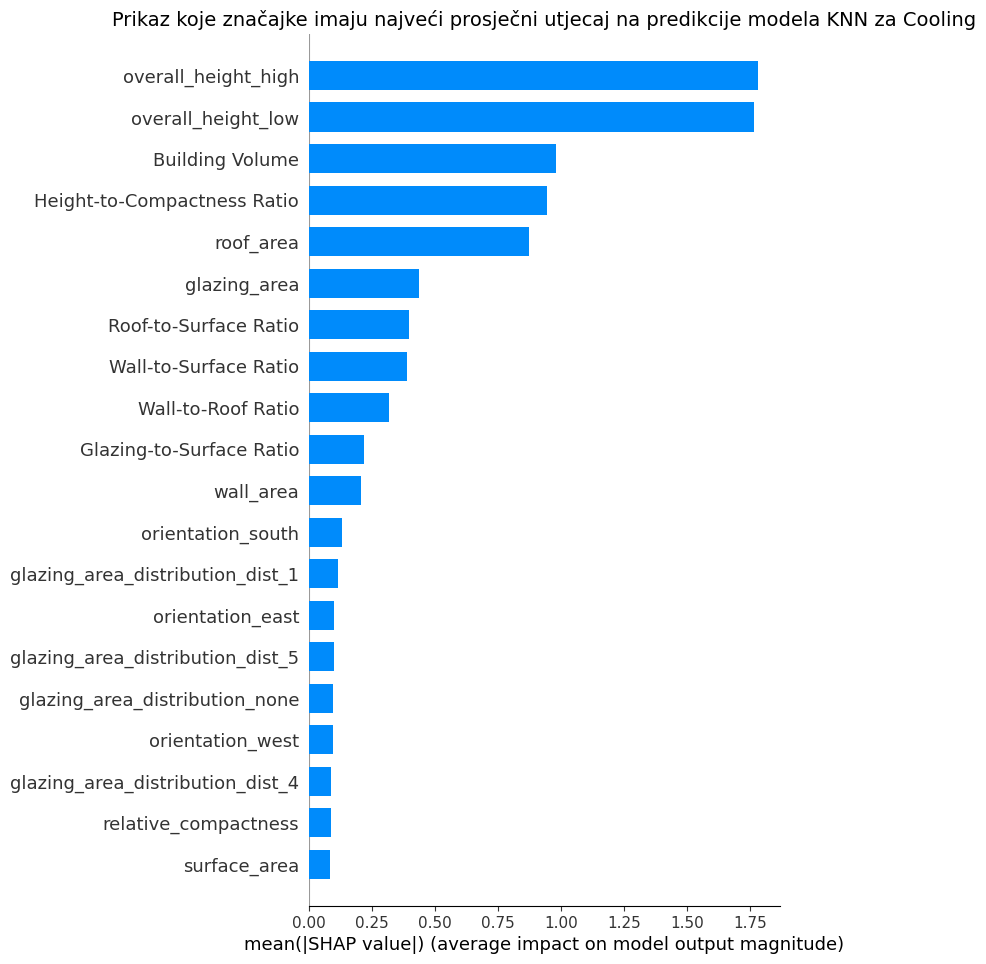

In [ ]:
# Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije KNN modela za Cooling
explainer_KNN_Co, shap_vrijednosti_KNN_Co = kreiraj_shap_vrijednosti(knn_Coo, "knn", X_train_final, X_test_final)
shap_summary_bar_dijagram(shap_vrijednosti_KNN_Co, X_test_final,"Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije modela KNN za Cooling")

/tmp/ipykernel_4884/1040590353.py:4: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vrijednosti, X_test, show=False)


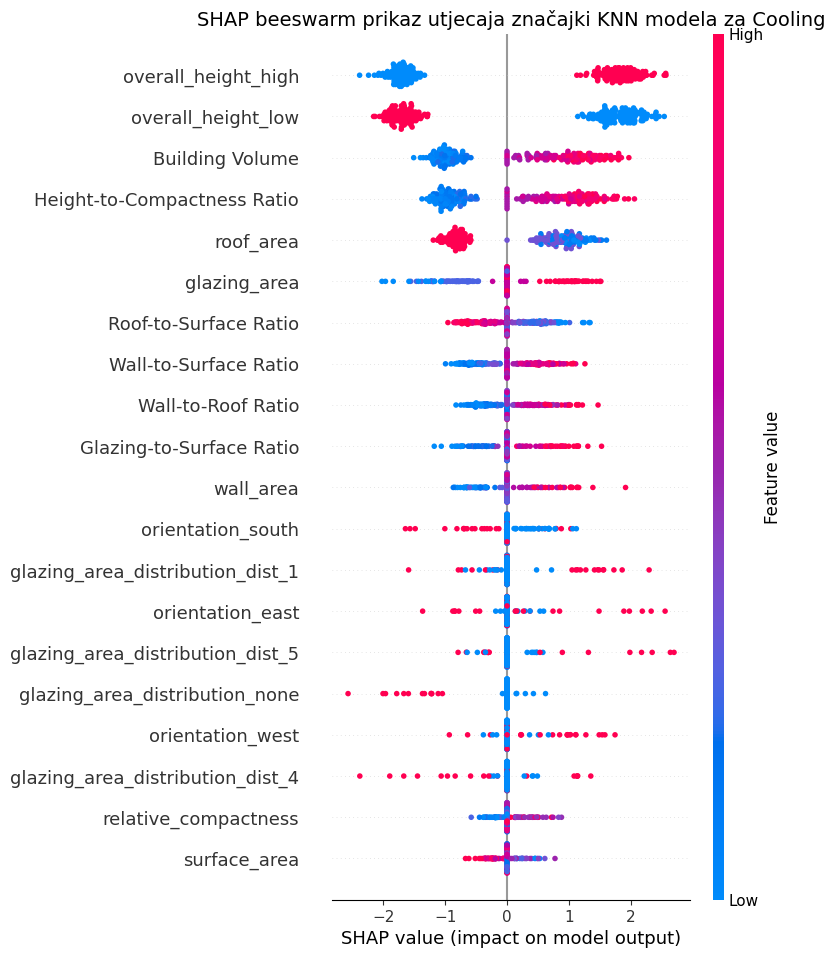

In [ ]:
#Prikaz kako i koliko svaka značajka utječe na predikcije KNN modela za Cooling za sve uzorke
shap_beeswarm_dijagram(shap_vrijednosti_KNN_Co, X_test_final, 'SHAP beeswarm prikaz utjecaja značajki KNN modela za Cooling')

  0%|          | 0/231 [00:00<?, ?it/s]


Prikaz za instancu #32


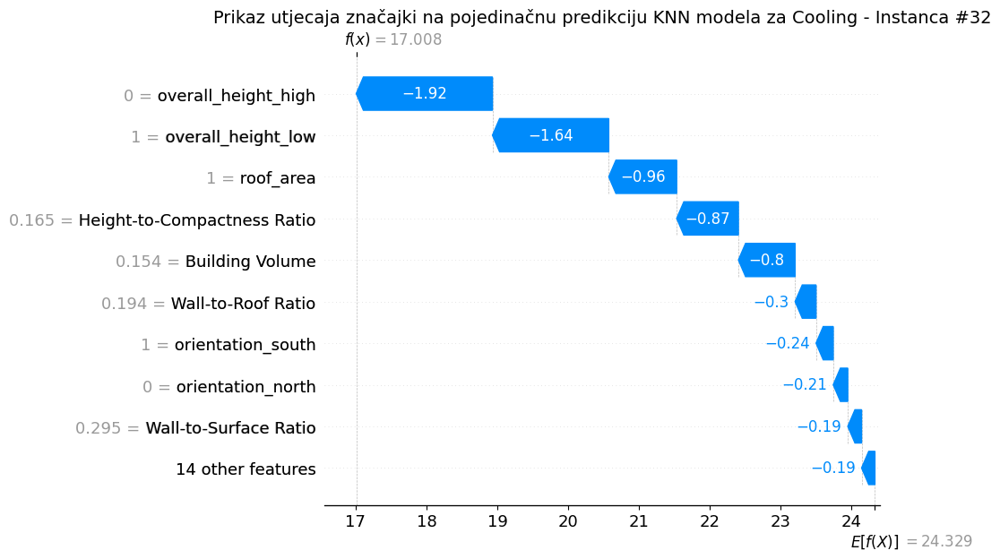


Prikaz za instancu #182


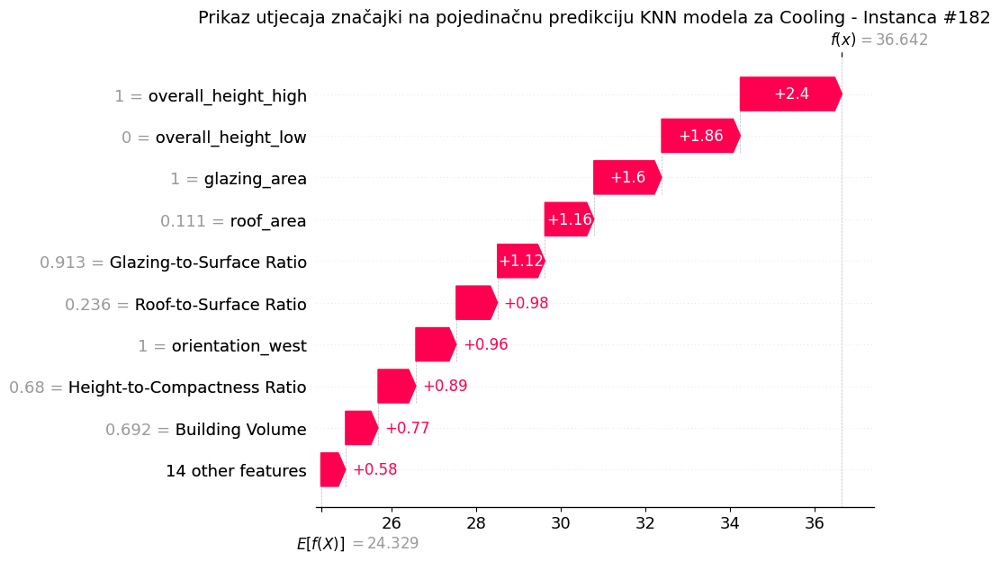


Prikaz za instancu #217


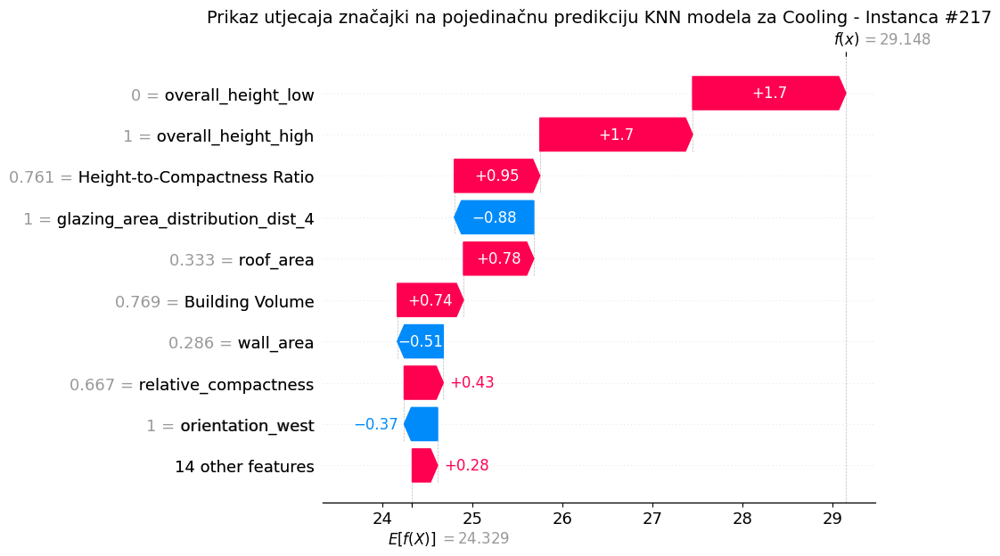


Prikaz za instancu #201


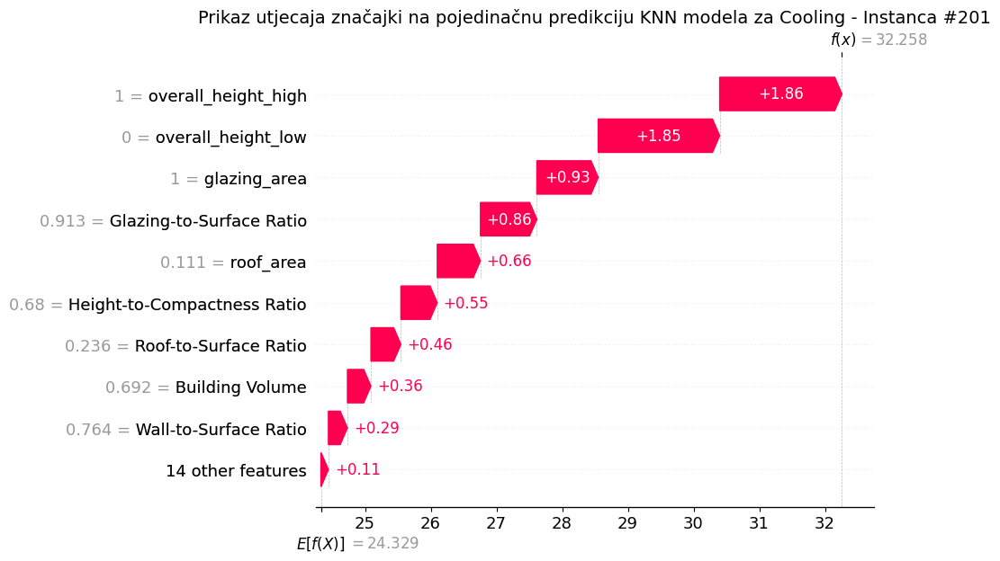


Prikaz za instancu #8


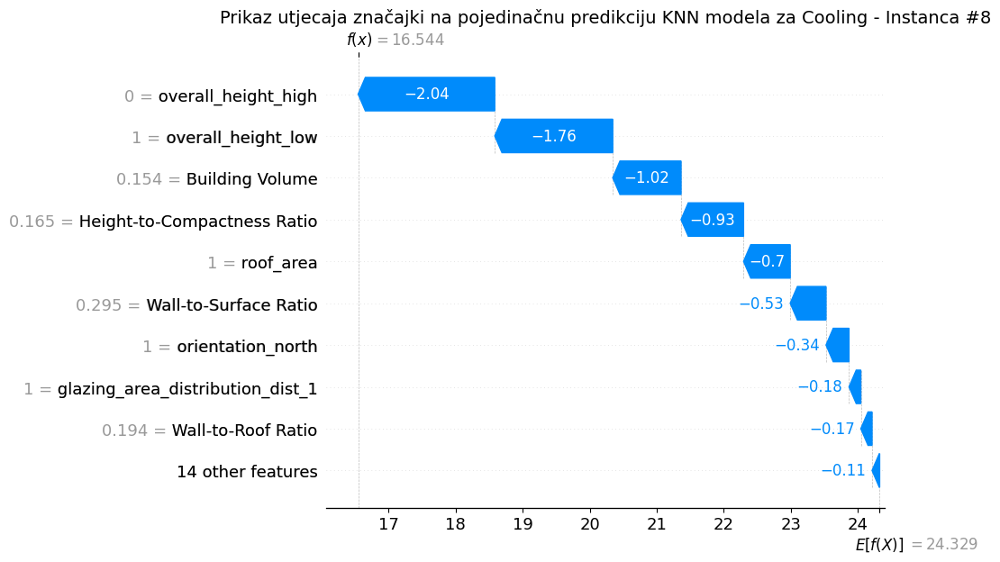

In [ ]:
#Nasumičan odabir 5 uzoraka iz testnog skupa i za svaki od njih se prikazuje SHAP waterfall plot koji detaljno vizualizira kako su pojedine značajke utjecale na konačnu predikciju KNN modela za Cooling za tu konkretnu instancu.
shap_waterfall_dijagram(explainer_KNN_Co, shap_vrijednosti_KNN_Co, "knn", X_test_final,"Prikaz utjecaja značajki na pojedinačnu predikciju KNN modela za Cooling")

## Optimizacija hiperparametara

In [ ]:
# Optimizacija KNN modela za Cooling

param_grid_knn_Co = {
    'n_neighbors': [3, 5, 7, 9, 11, 15],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

optimizirani_knn_Co, optimizirani_parametri_knn_Co, optimizirani_r2_knn_Co = optimiziraj_model(knn_Coo, param_grid_knn_Co, X_train_final, y_train_cooling)

print("Najbolji parametri KNN:", optimizirani_parametri_knn_Co)

Najbolji parametri KNN: {'n_neighbors': 9, 'p': 1, 'weights': 'uniform'}


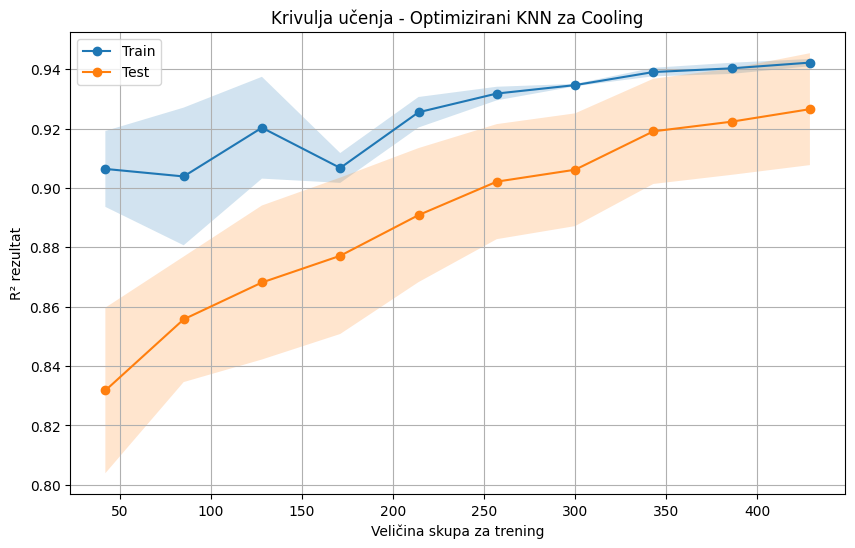

In [ ]:
# Krivulja učenja nakon optimizacije KNN modela za Cooling
prikaz_krivulje_ucenja(optimizirani_knn_Co, X_train_final, y_train_cooling, "Krivulja učenja - Optimizirani KNN za Cooling")

In [ ]:
# Evaluacijske metrike za optimizirane rezultate KNN modela za Cooling

y_pred_KNN_Co_Hi, mae_KNN_Co_Hi, mse_KNN_Co_Hi, rmse_KNN_Co_Hi, r2_KNN_Co_Hi, mape_KNN_Co_Hi, evs_KNN_Co_Hi=evaluacija_modela(optimizirani_knn_Co, X_test_final, y_test_cooling)
ispis_rezultata(mae_KNN_Co_Hi, mse_KNN_Co_Hi, rmse_KNN_Co_Hi, r2_KNN_Co_Hi, mape_KNN_Co_Hi, evs_KNN_Co_Hi)


MAE: 1.8994
MSE: 6.2872
RMSE: 2.5074
R²: 0.9302
MAPE: 0.0787
EVS: 0.9303


# **Stablo odlučivanja-cooling_load**

In [ ]:
#Kreiranje modela Stabla odlučivanja za Cooling

model_stabla_Coo = DecisionTreeRegressor(random_state=42, max_depth=4)
model_stabla_Coo.fit(X_train_final, y_train_cooling)


DecisionTreeRegressor(max_depth=4, random_state=42)

## Evaluacija modela

In [ ]:
#Provjera overfittinga modela Stabla odlučivanja za Cooling
provjera_overfittinga(model_stabla_Coo, X_train_final, X_test_final, y_train_cooling, y_test_cooling)

Train R²: 0.9586
Test R²: 0.9499


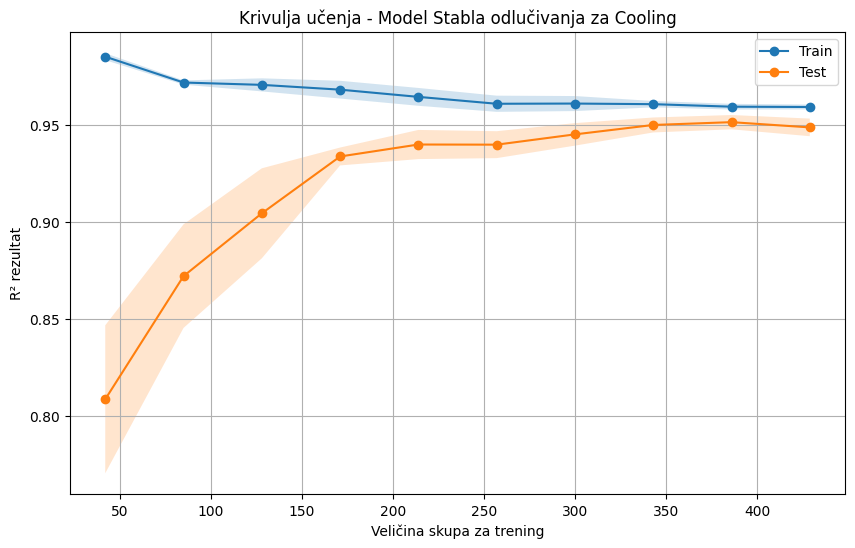

In [ ]:
#Prikaz krivulje učenja modela Stabla odlučivanja za Cooling
prikaz_krivulje_ucenja(model_stabla_Coo, X_train_final, y_train_cooling, "Krivulja učenja - Model Stabla odlučivanja za Cooling")

In [ ]:
#Evaluacijske metrike modela Stabla odlučivanja za Cooling

y_pred_Sta_Co, mae_Sta_Co, mse_Sta_Co, rmse_Sta_Co, r2_Sta_Co, mape_Sta_Co, evs_Sta_Co=evaluacija_modela(model_stabla_Coo, X_test_final, y_test_cooling)
ispis_rezultata(mae_Sta_Co, mse_Sta_Co, rmse_Sta_Co, r2_Sta_Co, mape_Sta_Co, evs_Sta_Co)


MAE: 1.4763
MSE: 4.5181
RMSE: 2.1256
R²: 0.9499
MAPE: 0.0520
EVS: 0.9502


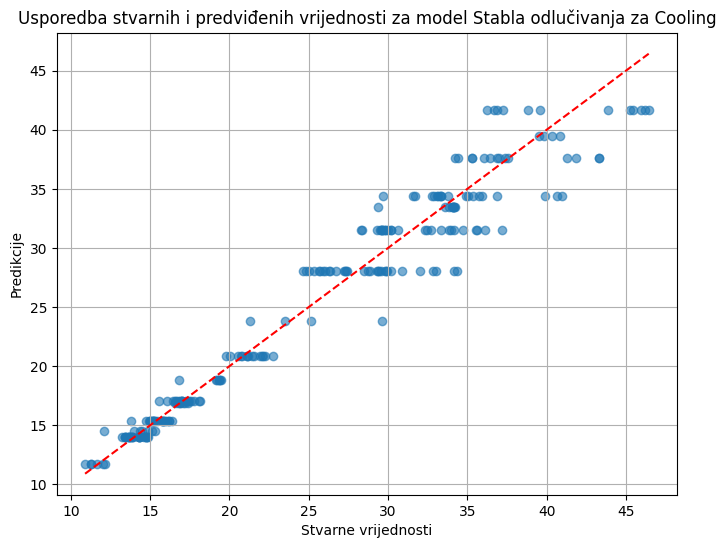

In [ ]:
#Dijagram raspršenja između stvarnih i predviđanih vrijednosti modela Stabla odlučivanja za Cooling
prikaz_stvarnih_i_predikcija(y_test_cooling, y_pred_Sta_Co, "Usporedba stvarnih i predviđenih vrijednosti za model Stabla odlučivanja za Cooling")

## Najznačajnije značajke

In [ ]:
#Procjena koliko je svaka značajka važna za točnost modela Stabla odlučivanja za Cooling tako što mjeri pad performanse (R²) nakon nasumičnog miješanja vrijednosti te značajke.
nazivi_znacajki = X_train_final.columns
vaznost_df_Sta_Co=izracun_permutacijske_vaznosti(model_stabla_Coo, X_test_final, y_test_cooling, nazivi_znacajki)

                            Značajka   Važnost  Standardna devijacija
4                overall_height_high  2.043696               0.106556
13                      surface_area  0.251620               0.034948
21          Glazing-to-Surface Ratio  0.100308               0.006207
22       Height-to-Compactness Ratio  0.031682               0.003061
12              relative_compactness  0.020524               0.002943
14                         wall_area  0.007026               0.001194
11    glazing_area_distribution_none  0.006034               0.002219
15                         roof_area  0.000863               0.001310
5                 overall_height_low  0.000000               0.000000
6   glazing_area_distribution_dist_1  0.000000               0.000000
2                  orientation_south  0.000000               0.000000
0                   orientation_east  0.000000               0.000000
1                  orientation_north  0.000000               0.000000
3                   

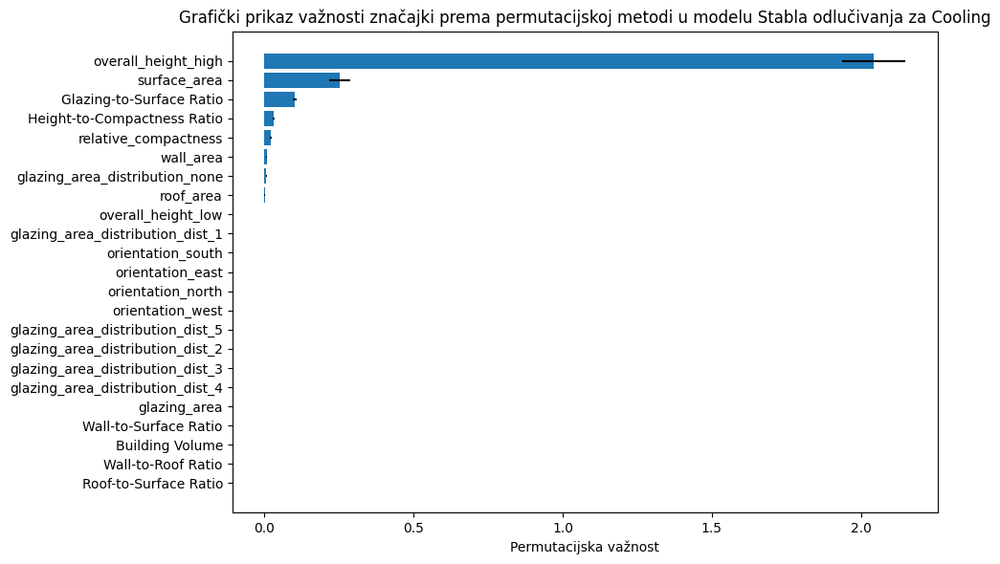

In [ ]:
#Grafički prikaz važnosti značajki prema permutacijskoj metodi u modelu Stabla odlučivanja za Cooling
graf_permutacijske_vaznosti(vaznost_df_Sta_Co, "Grafički prikaz važnosti značajki prema permutacijskoj metodi u modelu Stabla odlučivanja za Cooling")

/tmp/ipykernel_4884/4029197290.py:4: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


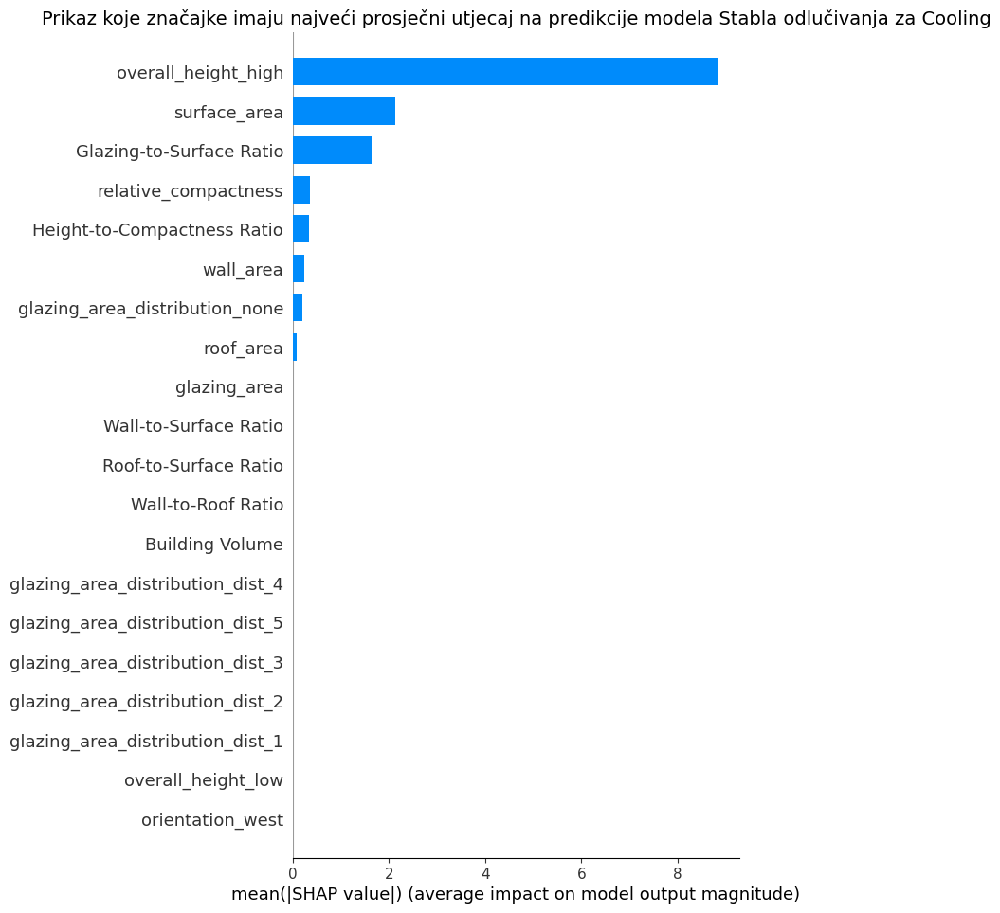

In [ ]:
# Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije modela Stabla odlučivanja za Cooling
explainer_Sta_Co, shap_vrijednosti_Sta_Co = kreiraj_shap_vrijednosti(model_stabla_Coo, "stablo", X_train_final, X_test_final)
shap_summary_bar_dijagram(shap_vrijednosti_Sta_Co, X_test_final,"Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije modela Stabla odlučivanja za Cooling")


/tmp/ipykernel_4884/1040590353.py:4: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vrijednosti, X_test, show=False)


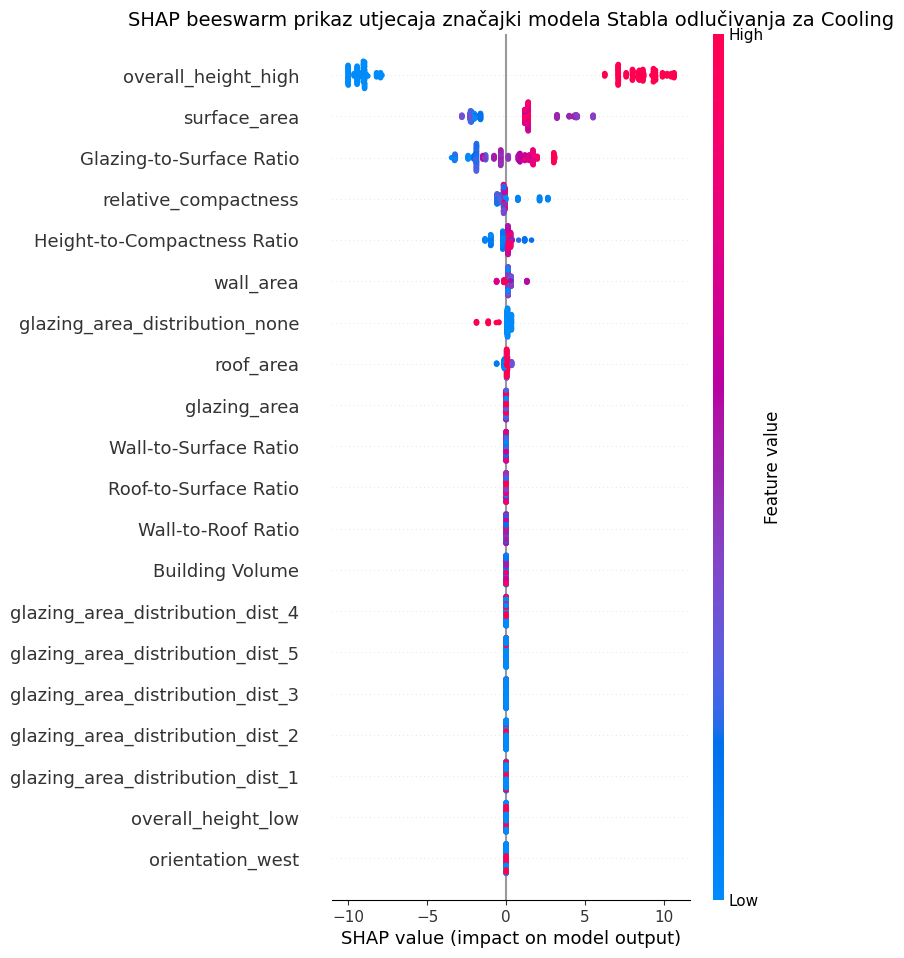

In [ ]:
#Prikaz kako i koliko svaka značajka utječe na predikcije modela Stabla odlučivanja za Cooling za sve uzorke
shap_beeswarm_dijagram(shap_vrijednosti_Sta_Co, X_test_final, 'SHAP beeswarm prikaz utjecaja značajki modela Stabla odlučivanja za Cooling')


Prikaz za instancu #159


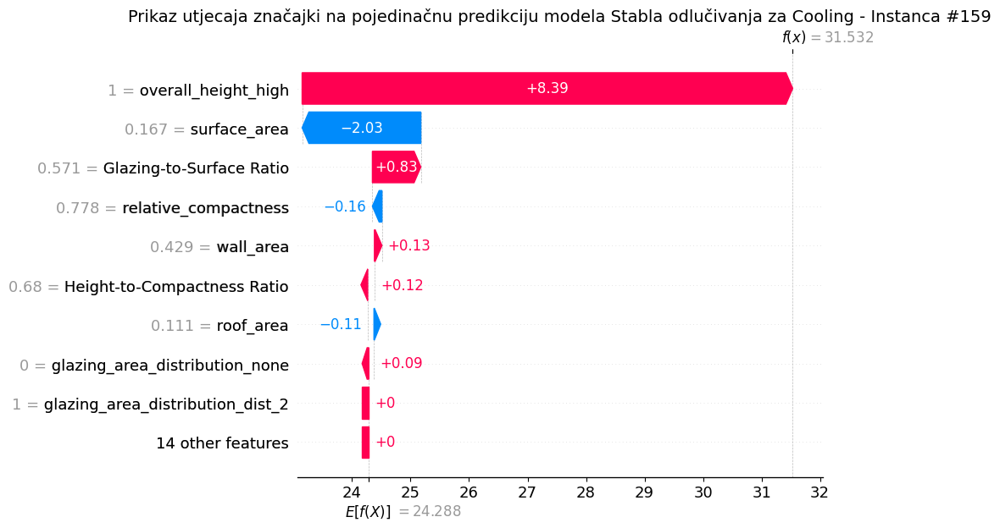


Prikaz za instancu #170


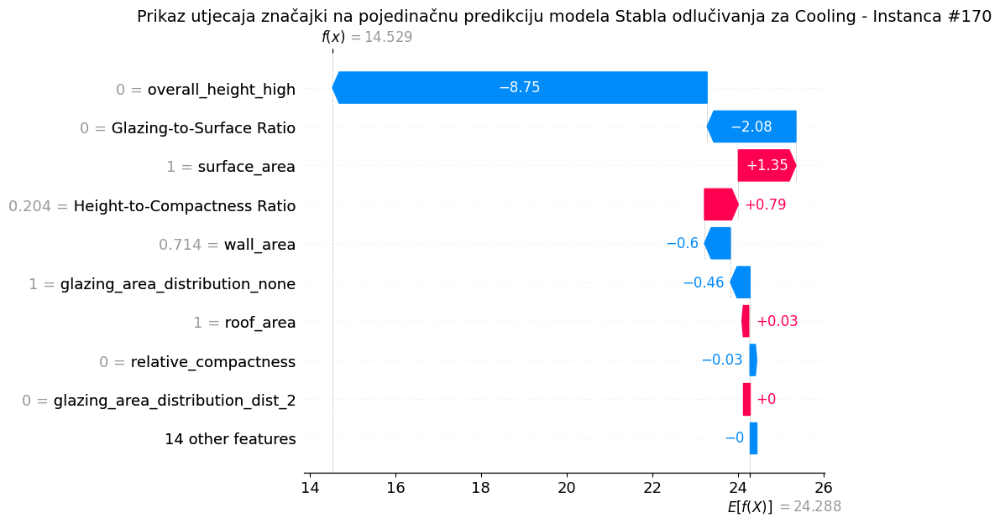


Prikaz za instancu #180


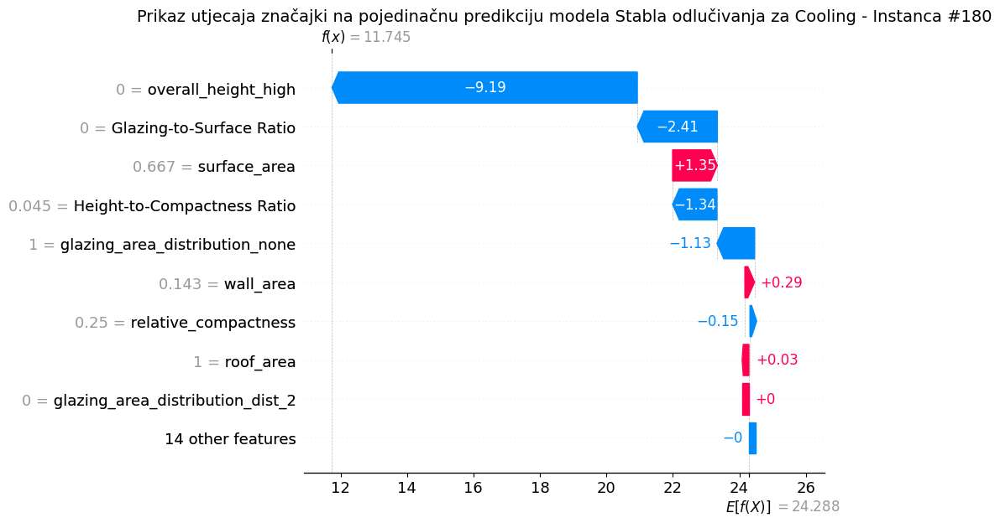


Prikaz za instancu #26


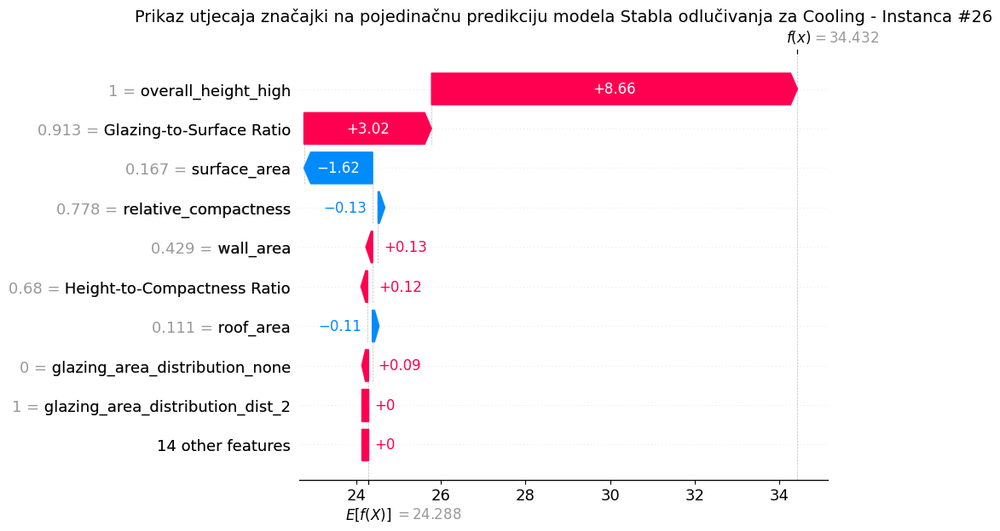


Prikaz za instancu #6


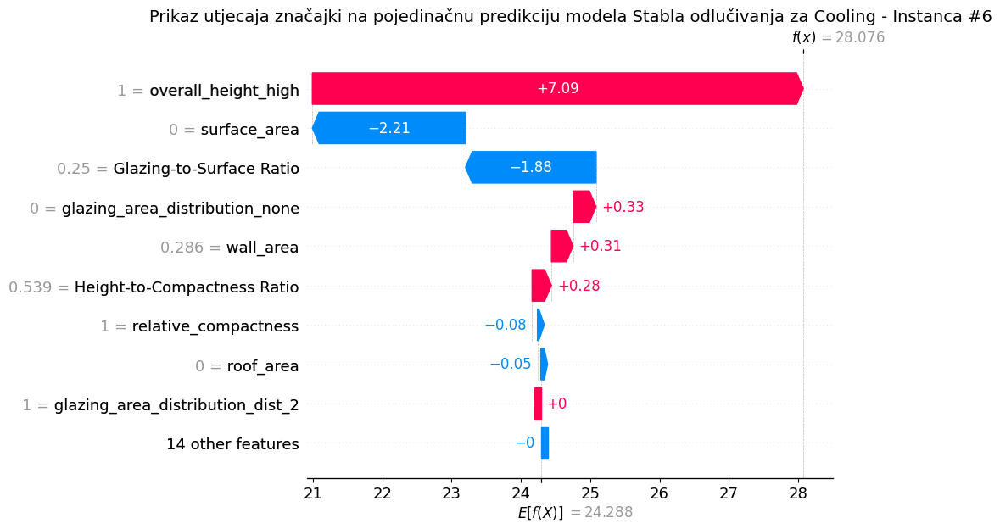

In [ ]:
#Nasumičan odabir 5 uzoraka iz testnog skupa i za svaki od njih se prikazuje SHAP waterfall plot koji detaljno vizualizira kako su pojedine značajke utjecale na konačnu predikciju modela Stabla odlučivanja za Cooling za tu konkretnu instancu.
shap_waterfall_dijagram(explainer_Sta_Co, shap_vrijednosti_Sta_Co, "stablo", X_test_final,"Prikaz utjecaja značajki na pojedinačnu predikciju modela Stabla odlučivanja za Cooling")

## Optimizacija hiperparametara

In [ ]:
# Optimizacija modela Stabla odlučivanja za Cooling

param_grid_stablo = {
    'max_depth': [2, 3, 4, 5, 6, 8, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [2, 4],
    'max_features': [None, 'sqrt', 'log2']
}

optimizirani_model_Sta_Co, optimizirani_parametri_Sta_Co, optimizirani_r2_Sta_Co = optimiziraj_model(model_stabla_Coo, param_grid_stablo, X_train_final, y_train_cooling)

print("Najbolji parametri stabla:", optimizirani_parametri_Sta_Co)

Najbolji parametri stabla: {'max_depth': 6, 'max_features': None, 'min_samples_leaf': 4, 'min_samples_split': 10}


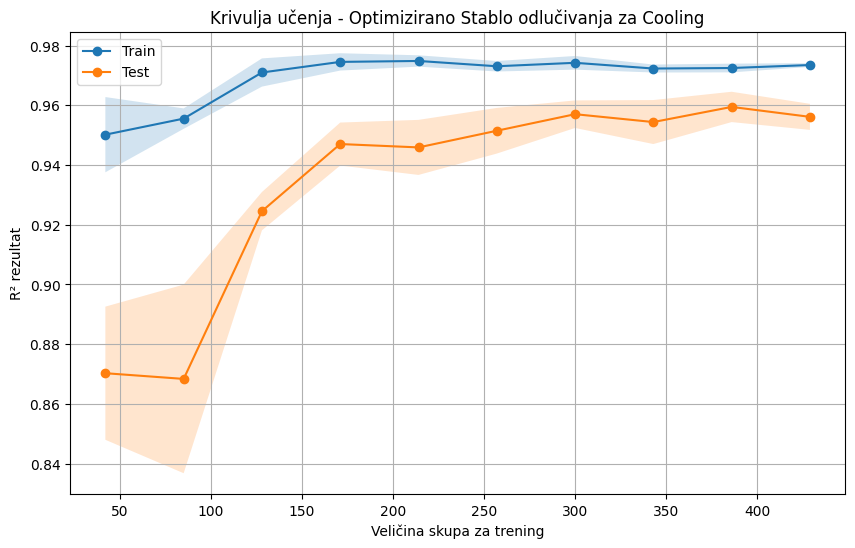

In [ ]:
# Krivulja učenja nakon optimizacije modela Stabla odlučivanja za Cooling
prikaz_krivulje_ucenja(optimizirani_model_Sta_Co, X_train_final, y_train_cooling, "Krivulja učenja - Optimizirano Stablo odlučivanja za Cooling")

In [ ]:
#Evaluacijske metrike optimiziranog rezultata Stabla odlučivanja za Cooling

y_pred_Sta_Co_Hi, mae_Sta_Co_Hi, mse_Sta_Co_Hi, rmse_Sta_Co_Hi, r2_Sta_Co_Hi, mape_Sta_Co_Hi, evs_Sta_Co_Hi=evaluacija_modela(optimizirani_model_Sta_Co, X_test_final, y_test_cooling)
ispis_rezultata(mae_Sta_Co_Hi, mse_Sta_Co_Hi, rmse_Sta_Co_Hi, r2_Sta_Co_Hi, mape_Sta_Co_Hi, evs_Sta_Co_Hi)

MAE: 1.2524
MSE: 3.6487
RMSE: 1.9102
R²: 0.9595
MAPE: 0.0431
EVS: 0.9596


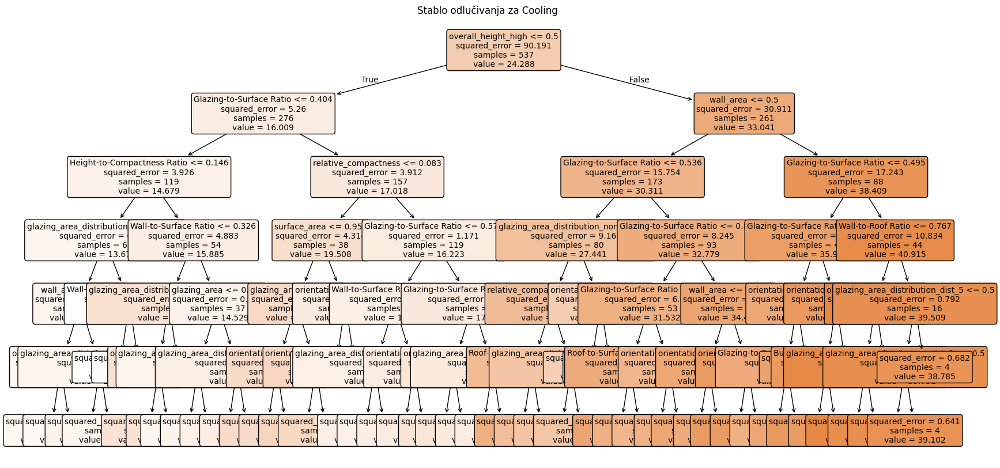

In [ ]:
#Prikaz Stabla odlučivanja za Cooling
prikaz_stabla(optimizirani_model_Sta_Co, "Stablo odlučivanja za Cooling")

# **Neuronske mreže-cooling_load**

In [ ]:
#Kreiranje modela Neuronskih mreža za Cooling
(
    X_train_Co,
    X_val_Co,
    y_train_Co,
    y_val_Co,
    mae_Neu_Co,
    mse_Neu_Co,
    rmse_Neu_Co,
    r2_Neu_Co,
    mape_Neu_Co,
    evs_Neu_Co,
    najbolji_model_Neu_Co,
    najbolja_povijest_Neu_Co,
    najbolji_y_pred_Neu_Co,
    najbolji_val_loss
) = treniraj_neuronsku_mrezu(
    X_train_final,
    y_train_cooling,
    X_test_final,
    y_test_cooling,
    "Cooling"
)


===== Cooling Trening 1/5 =====
Epoch 1/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 656.2544 - mae: 24.1756 - val_loss: 636.4952 - val_mae: 23.8744
Epoch 2/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 634.0089 - mae: 24.1061 - val_loss: 625.8715 - val_mae: 23.7636
Epoch 3/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 617.7386 - mae: 24.0149 - val_loss: 610.3767 - val_mae: 23.5659
Epoch 4/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 600.0709 - mae: 23.8619 - val_loss: 592.9275 - val_mae: 23.3366
Epoch 5/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 588.1436 - mae: 23.7360 - val_loss: 573.4692 - val_mae: 23.0685
Epoch 6/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 572.3960 - mae: 23.4960 - val_loss: 556.0237 - val_mae: 22.8259
Epoch 7/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 564.4066 - mae: 23.3693 - val_loss: 541.2006 - val_mae: 22.6143
Epoch 8/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 556.5693 - mae: 23.2538 - val_loss: 524.9000 -

## Evaluacija modela

In [ ]:
#Provjera overfittinga modela Neuronskih mreža za Cooling
provjera_overfittinga(najbolji_model_Neu_Co, X_train_final, X_test_final, y_train_cooling, y_test_cooling)

17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
Train R²: 0.9328
Test R²: 0.8881


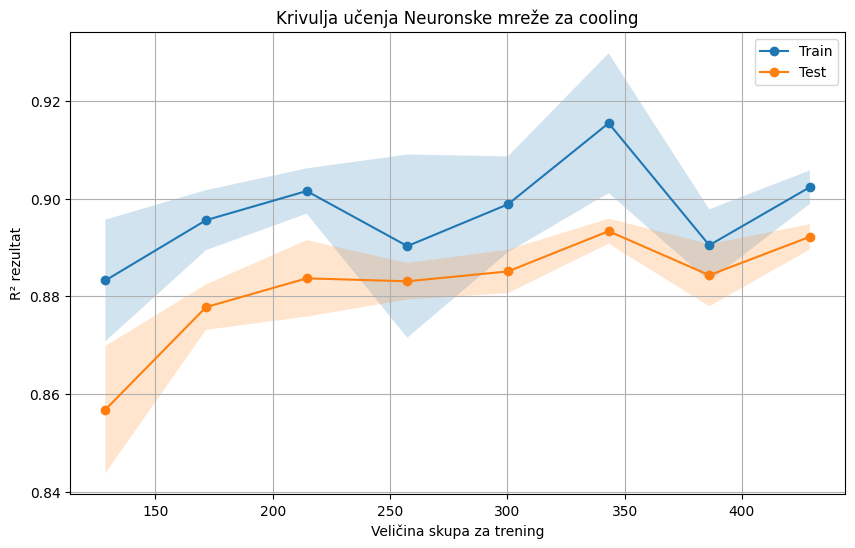

In [ ]:
#Prikaz krivulje učenja modela Neuronskih mreža za Heating
prikaz_krivulje_ucenja_neuronska(X_train_Co, y_train_Co, X_test_final, y_test_cooling, "Krivulja učenja Neuronske mreže za cooling")

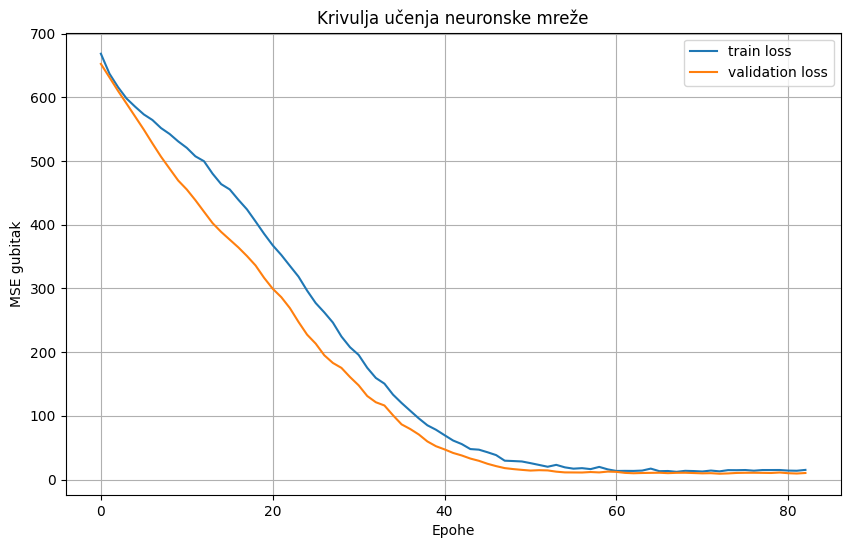

In [ ]:
#Prikaz krivulje učenje trainLoss i validationLoss Neuronskih mreža za Cooling
prikaz_krivulje_ucenja_trainLoss_validationLoss(najbolja_povijest_Neu_Co)

In [ ]:
#Evaluacijske metrike Neuronskih mreža za Cooling

mae_Neu_mean_Co = np.mean(mae_Neu_Co)
mse_Neu_mean_Co = np.mean(mse_Neu_Co)
rmse_Neu_mean_Co = np.mean(rmse_Neu_Co)
r2_Neu_mean_Co = np.mean(r2_Neu_Co)
mape_Neu_mean_Co = np.mean(mape_Neu_Co)
evs_Neu_mean_Co = np.mean(evs_Neu_Co)


ispis_rezultata(mae_Neu_mean_Co, mse_Neu_mean_Co, rmse_Neu_mean_Co, r2_Neu_mean_Co, mape_Neu_mean_Co, evs_Neu_mean_Co )

MAE: 2.5591
MSE: 11.7435
RMSE: 3.4212
R²: 0.8697
MAPE: 0.0998
EVS: 0.8798


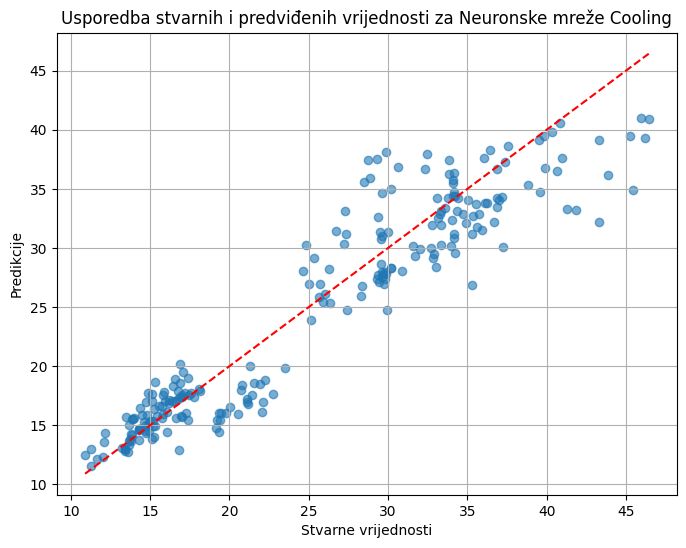

In [ ]:
#Dijagram raspršenja između stvarnih i predviđanih vrijednosti modela Neuronskih mreža za Cooling
prikaz_stvarnih_i_predikcija(y_test_cooling, najbolji_y_pred_Neu_Co, "Usporedba stvarnih i predviđenih vrijednosti za Neuronske mreže Cooling")

## Najznačajnije značajke

In [ ]:
#Procjena koliko je svaka značajka važna za točnost modela Neuronskih mreža za Cooling tako što mjeri pad performanse (R²) nakon nasumičnog miješanja vrijednosti te značajke.
class KerasRegressorWrapper(BaseEstimator, RegressorMixin):
    def __init__(self, najbolji_model_Neu_Co):
        self.najbolji_model_Neu_Co = najbolji_model_Neu_Co

    def fit(self, X, y):
        return self

    def predict(self, X):
        return self.najbolji_model_Neu_Co.predict(X).flatten()

model_Co = KerasRegressorWrapper(najbolji_model_Neu_Co)
nazivi_znacajki = X_train_final.columns
vaznost_df_Neu_Co=izracun_permutacijske_vaznosti(model_Co, X_test_final, y_test_cooling, nazivi_znacajki)

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
8/8 ━━━━━━━━

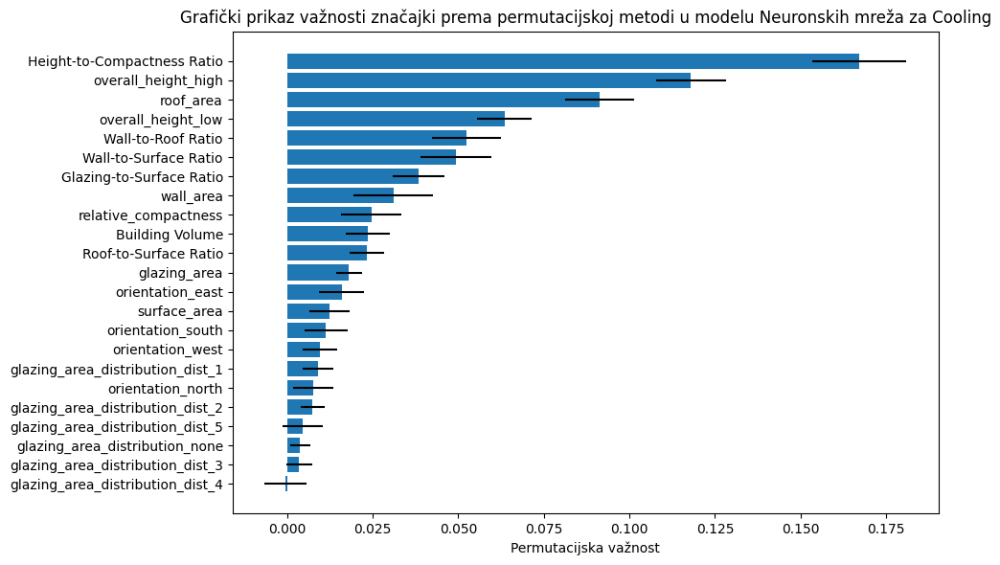

In [ ]:
#Grafički prikaz važnosti značajki prema permutacijskoj metodi u modelu Neuronskih mreža za Cooling
graf_permutacijske_vaznosti(vaznost_df_Neu_Co, "Grafički prikaz važnosti značajki prema permutacijskoj metodi u modelu Neuronskih mreža za Cooling")

PermutationExplainer explainer: 232it [00:33,  4.87it/s]
/tmp/ipykernel_4884/4029197290.py:4: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


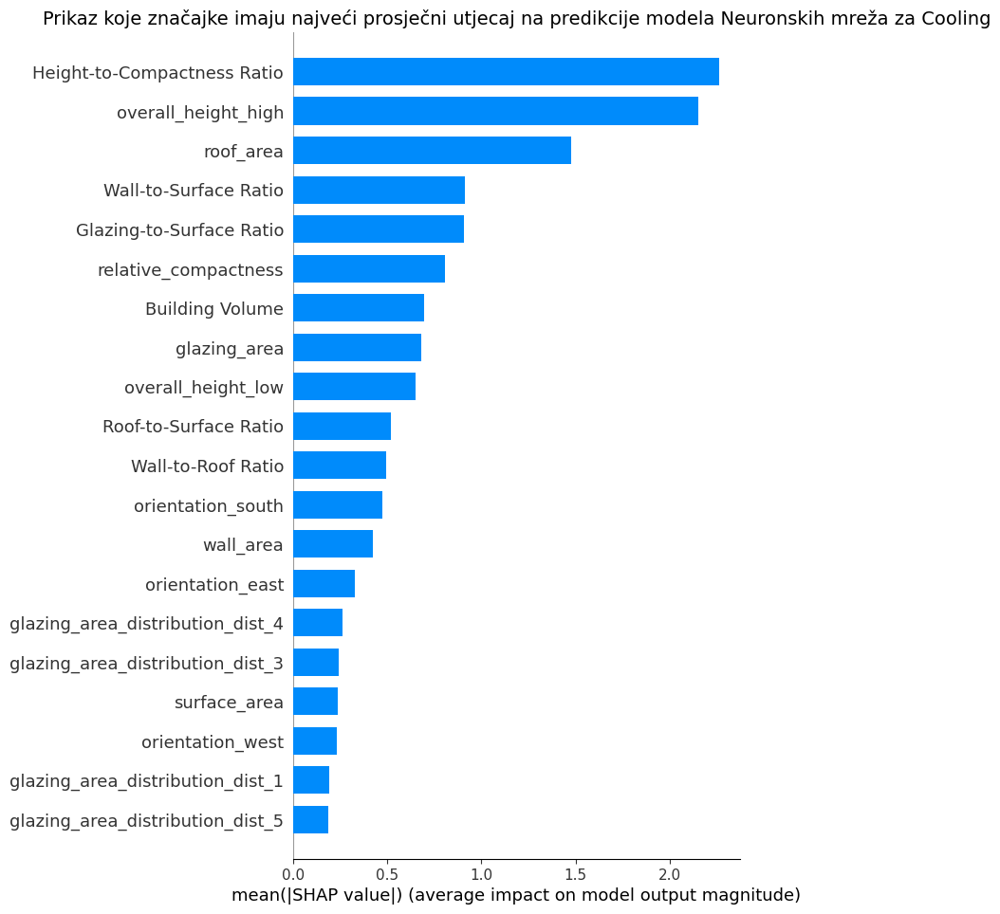

In [ ]:
# Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije modela Neuronskih mreža za Cooling
explainer_Neu_Co, shap_vrijednosti_Neu_Co = kreiraj_shap_vrijednosti(najbolji_model_Neu_Co, "neuronske", X_train_final, X_test_final)
shap_summary_bar_dijagram(shap_vrijednosti_Neu_Co, X_test_final,"Prikaz koje značajke imaju najveći prosječni utjecaj na predikcije modela Neuronskih mreža za Cooling")

/tmp/ipykernel_4884/1040590353.py:4: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_vrijednosti, X_test, show=False)


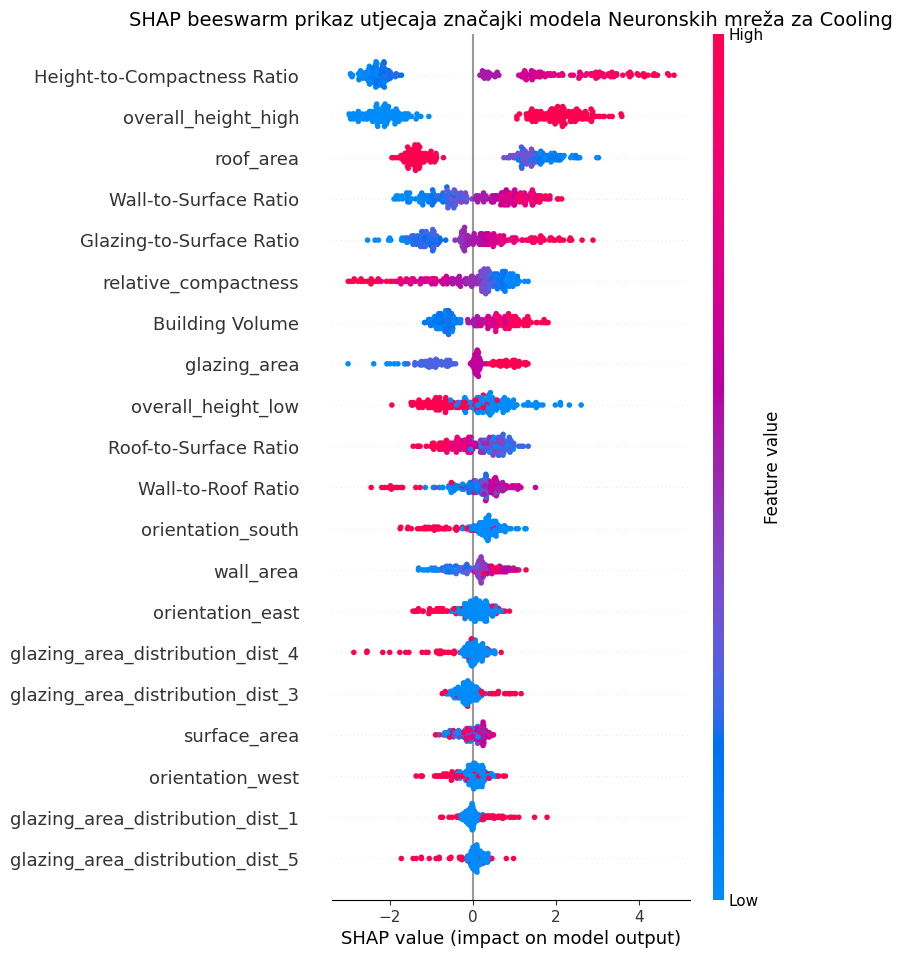

In [ ]:
#Prikaz kako i koliko svaka značajka utječe na predikcije modela Neuronskih mreža za Cooling za sve uzorke
shap_beeswarm_dijagram(shap_vrijednosti_Neu_Co, X_test_final, 'SHAP beeswarm prikaz utjecaja značajki modela Neuronskih mreža za Cooling')


Prikaz za instancu #169


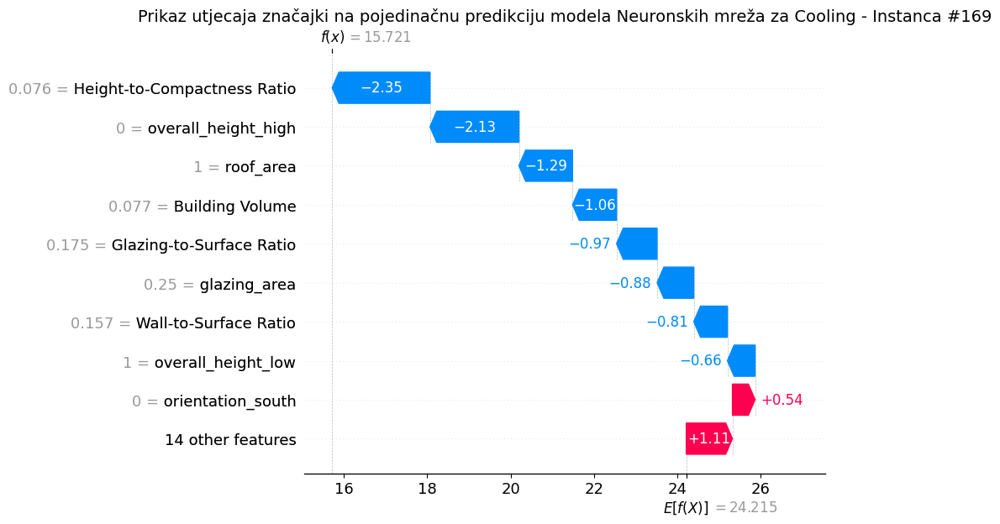


Prikaz za instancu #20


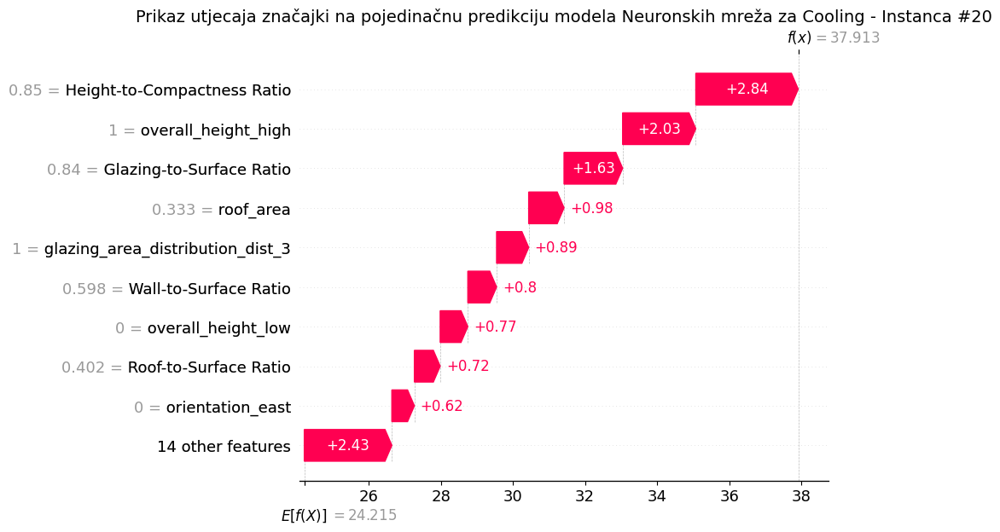


Prikaz za instancu #50


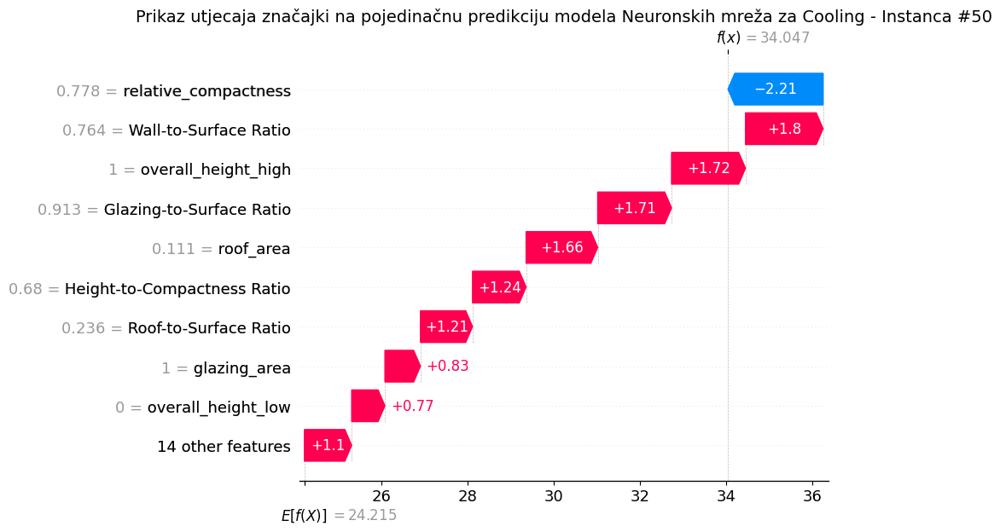


Prikaz za instancu #217


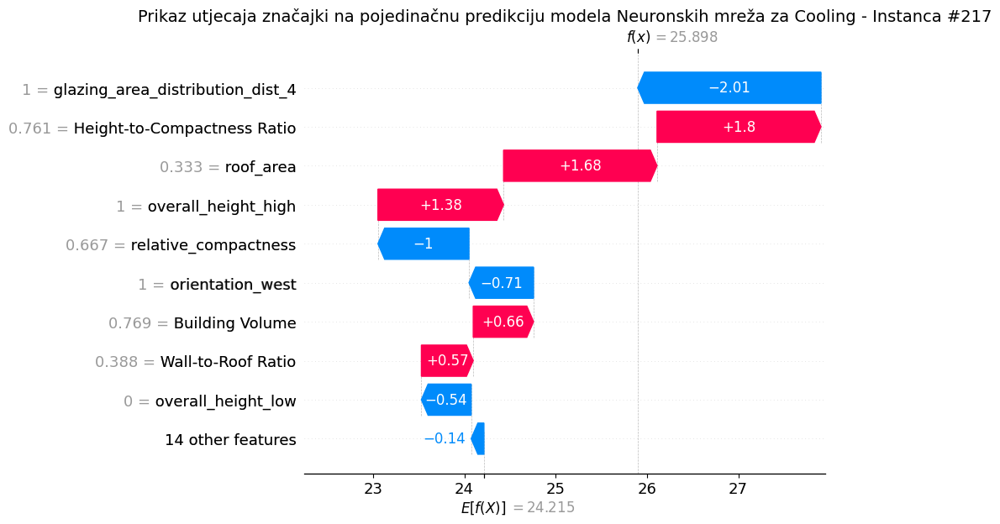


Prikaz za instancu #81


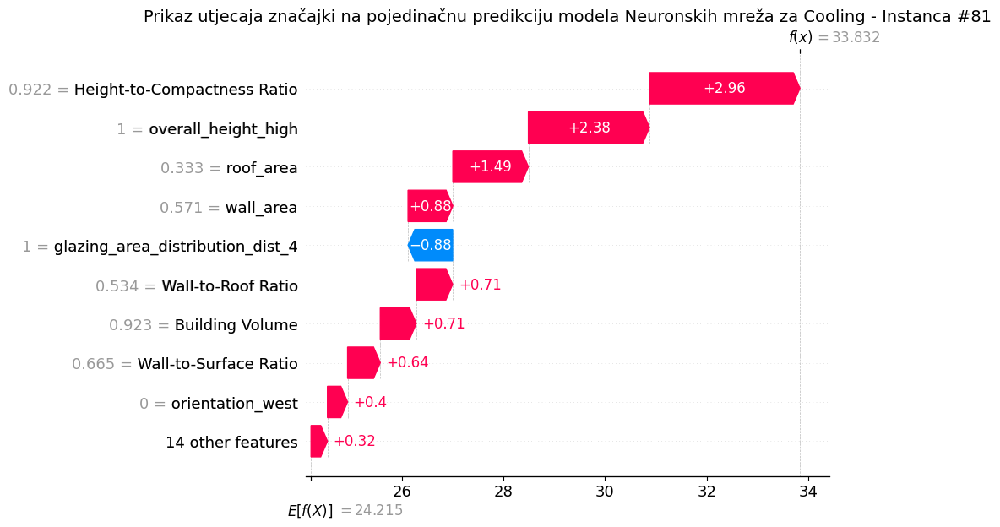

In [ ]:
#Nasumičan odabir 5 uzoraka iz testnog skupa i za svaki od njih se prikazuje SHAP waterfall plot koji detaljno vizualizira kako su pojedine značajke utjecale na konačnu predikciju modela Neuronskih mreža za Cooling za tu konkretnu instancu.
shap_waterfall_dijagram(explainer_Neu_Co, shap_vrijednosti_Neu_Co, "neuronske", X_test_final,"Prikaz utjecaja značajki na pojedinačnu predikciju modela Neuronskih mreža za Cooling")

## Optimizacija hiperparametara

In [ ]:
# Optimizacija modela Neuronskih mreža za Cooling
tuner = optimiziraj_neuronske_mreze(X_train_Co, y_train_Co, X_val_Co, y_val_Co, ime_projekta='Neuronske_mreže_Cooling')
najbolji_model_Neu_Co_Hi = tuner.get_best_models(num_models=1)[0]
najbolji_parametri_Neu_Co_Hi = tuner.get_best_hyperparameters(1)[0]
def izradi_najbolji_model_Co():
    model = tuner.hypermodel.build(
        najbolji_parametri_Neu_Co_Hi
    )

    return model

Trial 20 Complete [00h 00m 44s]
val_loss: 8.268380324045816

Best val_loss So Far: 4.170982837677002
Total elapsed time: 00h 19m 41s


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


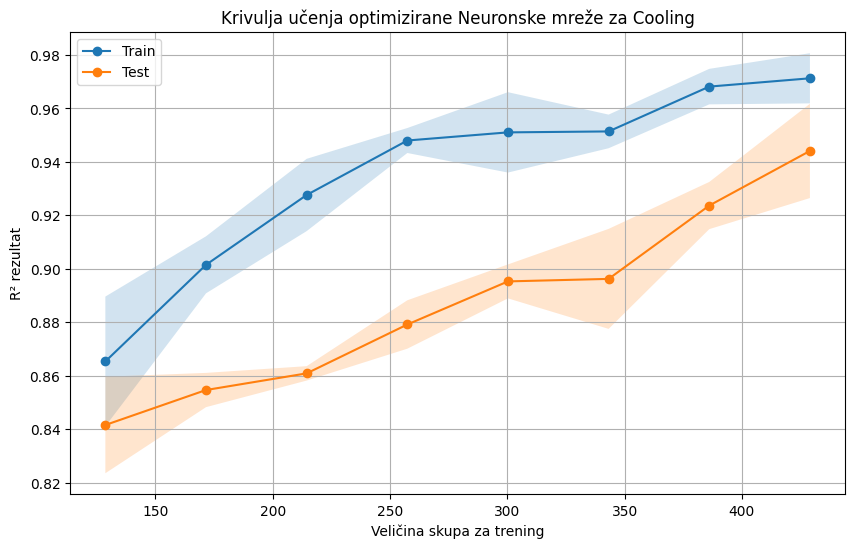

In [ ]:
#Prikaz krivulje učenja optimiziranog modela Neuronskih mreža za Cooling
prikaz_krivulje_ucenja_neuronska(X_train_Co, y_train_Co, X_test_final, y_test_cooling, "Krivulja učenja optimizirane Neuronske mreže za Cooling" ,model_fn=izradi_najbolji_model_Co)

In [ ]:
#Evaluacijske metrike najboljeg rezultata modela Neuronskih mreža za Cooling

print("Najbolji hiperparametri:")
print(najbolji_parametri_Neu_Co_Hi.values)

y_pred_Neuro_Co_Hi, mae_Neu_Co_Hi, mse_Neu_Co_Hi, rmse_Neu_Co_Hi, r2_Neu_Co_Hi, mape_Neu_Co_Hi, evs_Neu_Co_Hi=evaluacija_modela(najbolji_model_Neu_Co_Hi, X_test_final, y_test_cooling)
y_pred_Neuro_Co_Hi=y_pred_Neuro_Co_Hi.flatten()
ispis_rezultata(mae_Neu_Co_Hi, mse_Neu_Co_Hi, rmse_Neu_Co_Hi, r2_Neu_Co_Hi, mape_Neu_Co_Hi, evs_Neu_Co_Hi)

Najbolji hiperparametri:
{'broj_slojeva': 3, 'units_0': 128, 'activation_0': 'elu', 'l2_0': 0.0032492524782539705, 'dropout_0': 0.0, 'learning_rate': 0.005241917960215533, 'units_1': 32, 'activation_1': 'elu', 'l2_1': 0.004902144233728629, 'dropout_1': 0.0, 'units_2': 256, 'activation_2': 'relu', 'l2_2': 0.0032348514558896563, 'dropout_2': 0.2}
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
MAE: 1.4271
MSE: 3.1689
RMSE: 1.7801
R²: 0.9648
MAPE: 0.0587
EVS: 0.9661


# **Rangiranje predikcija-cooling_load**

In [ ]:
#Rangiranje modela za Cooling prema evaluacijskim metrikama
modeli_Co = ['Linearna regresija', 'Neuronske mreže', 'Stablo odlučivanja', 'KNN']

df_cooling = napravi_rang_df(
    modeli_Co,
    [mae_Lin_Co, mae_Neu_mean_Co, mae_Sta_Co, mae_KNN_Co],
    [mse_Lin_Co, mse_Neu_mean_Co, mse_Sta_Co, mse_KNN_Co],
    [rmse_Lin_Co, rmse_Neu_mean_Co, rmse_Sta_Co, rmse_KNN_Co],
    [r2_Lin_Co, r2_Neu_mean_Co, r2_Sta_Co, r2_KNN_Co],
    [mape_Lin_Co, mape_Neu_mean_Co, mape_Sta_Co, mape_KNN_Co],
    [evs_Lin_Co, evs_Neu_mean_Co, evs_Sta_Co, evs_KNN_Co]
)

print(df_cooling)

                Model       MAE        MSE      RMSE        R2      MAPE  \
2  Stablo odlučivanja  1.476349   4.518090  2.125580  0.949876  0.052049   
0  Linearna regresija  1.913245   6.202891  2.490560  0.931185  0.080210   
1     Neuronske mreže  2.559079  11.743510  3.421219  0.869717  0.099750   
3                 KNN  2.825446  14.385966  3.792884  0.840402  0.107479   

        EVS  Rang_MAE  Rang_MSE  Rang_MAPE  Rang_R2  Rang_EVS  Prosječni_rang  
2  0.950243       1.0       1.0        1.0      1.0       1.0             1.0  
0  0.931804       2.0       2.0        2.0      2.0       2.0             2.0  
1  0.879756       3.0       3.0        3.0      3.0       3.0             3.0  
3  0.840437       4.0       4.0        4.0      4.0       4.0             4.0  


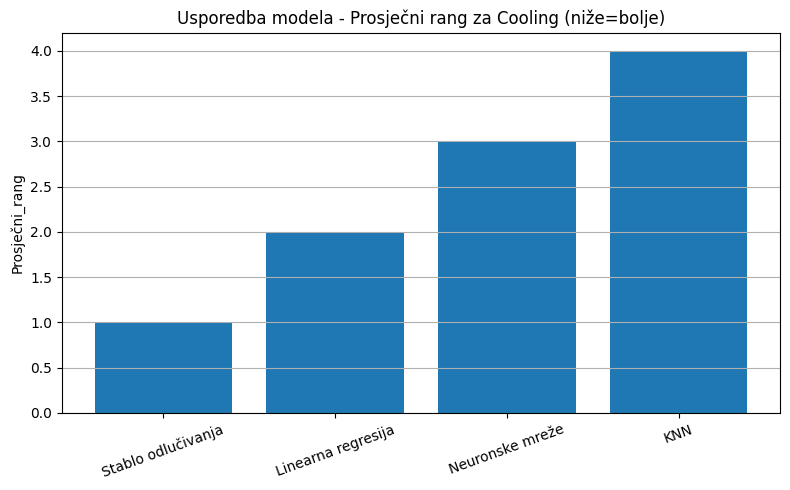

In [ ]:
#Grafički prikaz usporedbe uspješnosti regresijskih modela bez optimizacije parametara za Cooling prema prosječnom rangu evaluacijskih metrika
prikaz_usporedbe_modela(df_cooling, 'Usporedba modela - Prosječni rang za Cooling (niže=bolje)', 'Prosječni_rang')

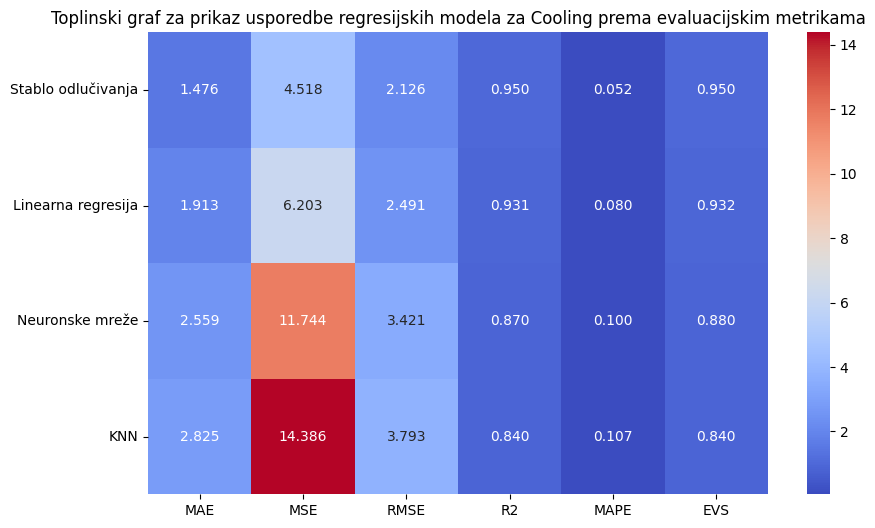

In [ ]:
#Toplinski graf za prikaz usporedbe regresijskih modela bez optimizacije parametara za Heating prema evaluacijskim metrikama
prikaz_toplinskog_grafa_usporedbe_modela(df_cooling, 'Toplinski graf za prikaz usporedbe regresijskih modela za Cooling prema evaluacijskim metrikama')

In [ ]:
#Rangiranje optimiziranog modela za Cooling prema evaluacijskim metrikama
modeli_Co_Hi = ['Linearna regresija', 'Neuronske mreže', 'Stablo odlučivanja', 'KNN']

df_cooling_Hi = napravi_rang_df(
    modeli_Co_Hi,
    [mae_Lin_Co_Hi, mae_Neu_Co_Hi, mae_Sta_Co_Hi, mae_KNN_Co_Hi],
    [mse_Lin_Co_Hi, mse_Neu_Co_Hi, mse_Sta_Co_Hi, mse_KNN_Co_Hi],
    [rmse_Lin_Co_Hi, rmse_Neu_Co_Hi, rmse_Sta_Co_Hi, rmse_KNN_Co_Hi],
    [r2_Lin_Co_Hi, r2_Neu_Co_Hi, r2_Sta_Co_Hi, r2_KNN_Co_Hi],
    [mape_Lin_Co_Hi, mape_Neu_Co_Hi, mape_Sta_Co_Hi, mape_KNN_Co_Hi],
    [evs_Lin_Co_Hi, evs_Neu_Co_Hi, evs_Sta_Co_Hi, evs_KNN_Co_Hi]
)

print(df_cooling_Hi)

                Model       MAE       MSE      RMSE        R2      MAPE  \
1     Neuronske mreže  1.427125  3.168904  1.780141  0.964844  0.058699   
2  Stablo odlučivanja  1.252406  3.648693  1.910155  0.959521  0.043057   
3                 KNN  1.899399  6.287178  2.507425  0.930250  0.078678   
0  Linearna regresija  1.909164  7.116135  2.667608  0.921053  0.076915   

        EVS  Rang_MAE  Rang_MSE  Rang_MAPE  Rang_R2  Rang_EVS  Prosječni_rang  
1  0.966088       2.0       1.0        2.0      1.0       1.0             1.4  
2  0.959588       1.0       2.0        1.0      2.0       2.0             1.6  
3  0.930295       3.0       3.0        4.0      3.0       3.0             3.2  
0  0.921975       4.0       4.0        3.0      4.0       4.0             3.8  


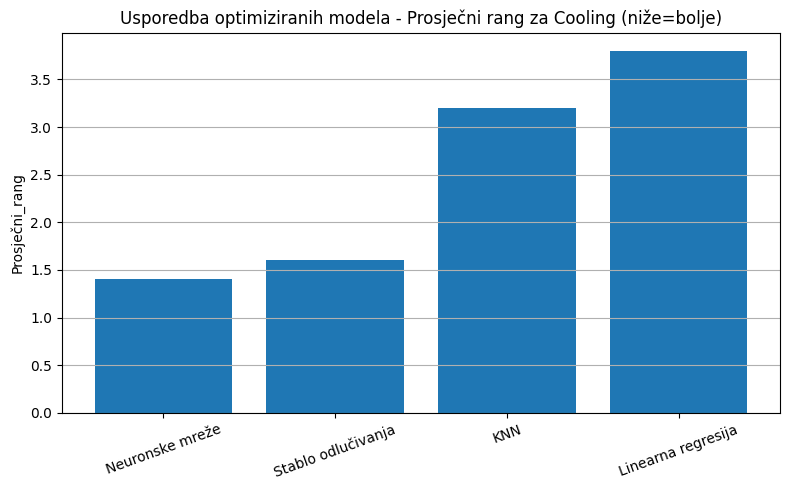

In [ ]:
#Grafički prikaz usporedbe uspješnosti regresijskih modela s optimizacijom parametara za Cooling prema prosječnom rangu evaluacijskih metrika
prikaz_usporedbe_modela(df_cooling_Hi, 'Usporedba optimiziranih modela - Prosječni rang za Cooling (niže=bolje)', 'Prosječni_rang')

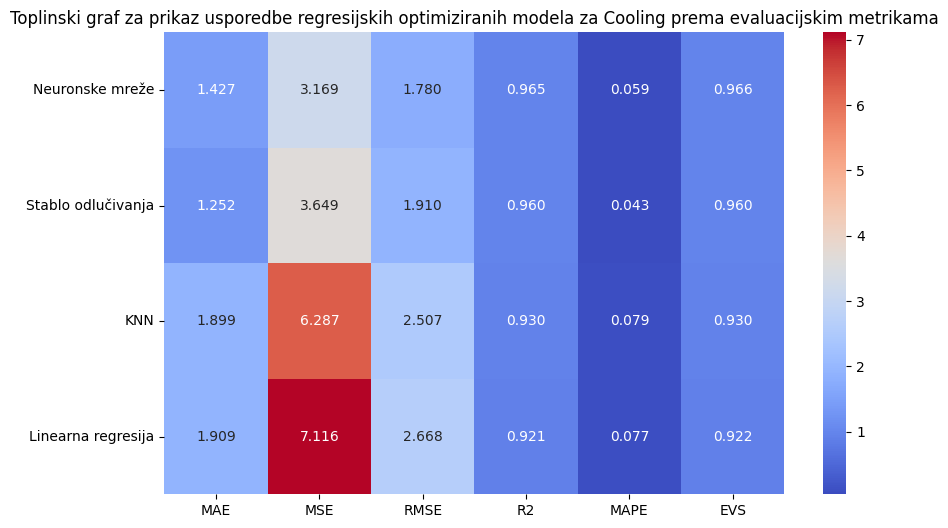

In [ ]:
#Toplinski graf za prikaz usporedbe regresijskih modela s optimizacijom parametara za Cooling prema evaluacijskim metrikama
prikaz_toplinskog_grafa_usporedbe_modela(df_cooling_Hi, 'Toplinski graf za prikaz usporedbe regresijskih optimiziranih modela za Cooling prema evaluacijskim metrikama')

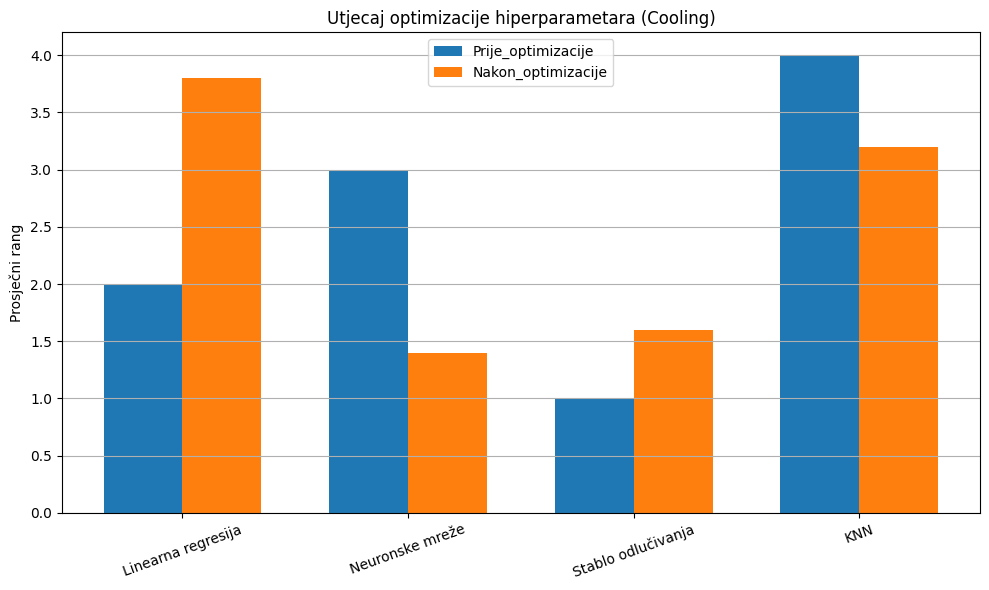

In [ ]:
#Grafički prikaz usporedbe regresijskih modela prije i nakon optimizacije parametara za Cooling
usporedba_Cooling = prikaz_usporedbe_rangova(df_cooling, df_cooling_Hi, "Utjecaj optimizacije hiperparametara (Cooling)", "Prije_optimizacije", "Nakon_optimizacije")

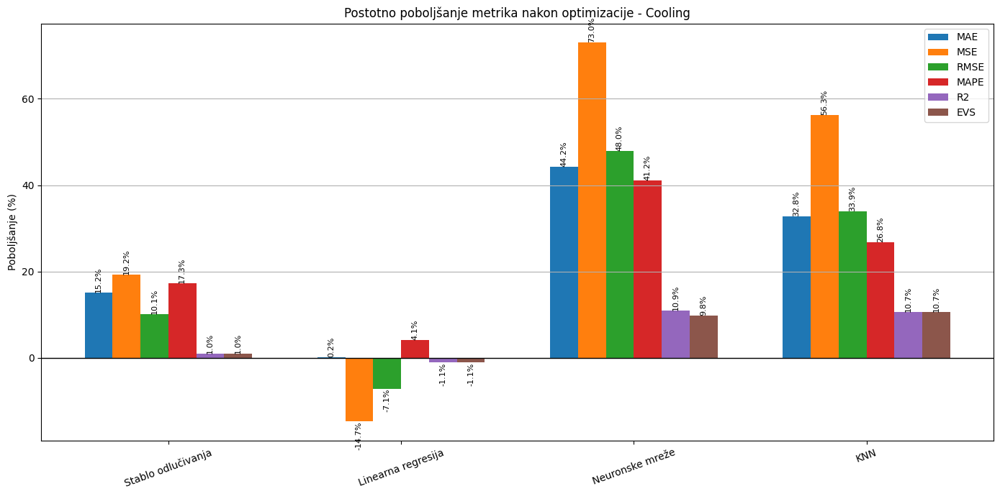

In [ ]:
#Graf za postotno poboljšanje metrika nakon optimizacije Cooling za svaku metriku
poboljsanja_cooling = prikaz_postotnog_poboljsanja_metrika(df_cooling, df_cooling_Hi, 'Postotno poboljšanje metrika nakon optimizacije - Cooling')

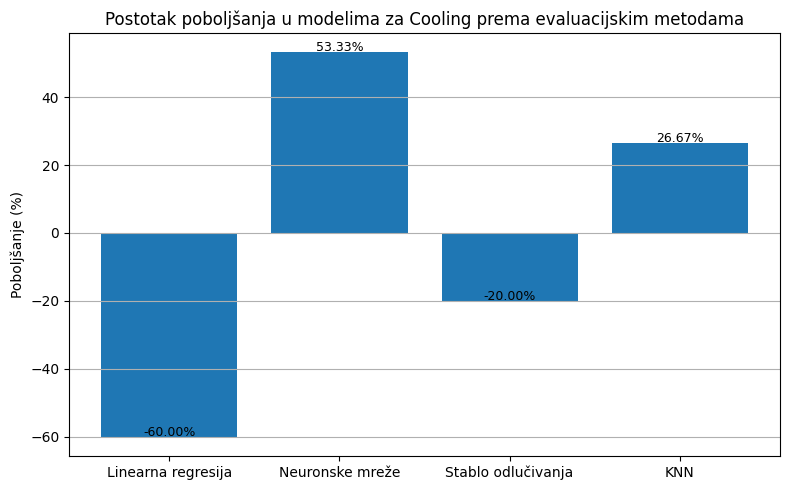

In [ ]:
#Postotak poboljšanja u modelima za Cooling prema evaluacijskim metodama
prikaz_postotnog_poboljsanja(usporedba_Cooling,"Postotak poboljšanja u modelima za Cooling prema evaluacijskim metodama")

# **Završno rangiranje**

In [ ]:
#Spajanje rangova za Cooling i za Heating
df_spojeno = izracunaj_zavrsni_rang(df_heating, df_cooling)


                Model  Rang_Heating  Rang_Cooling  Završni_rang
0  Stablo odlučivanja           1.0           1.0           1.0
1  Linearna regresija           2.0           2.0           2.0
2     Neuronske mreže           3.0           3.0           3.0
3                 KNN           4.0           4.0           4.0


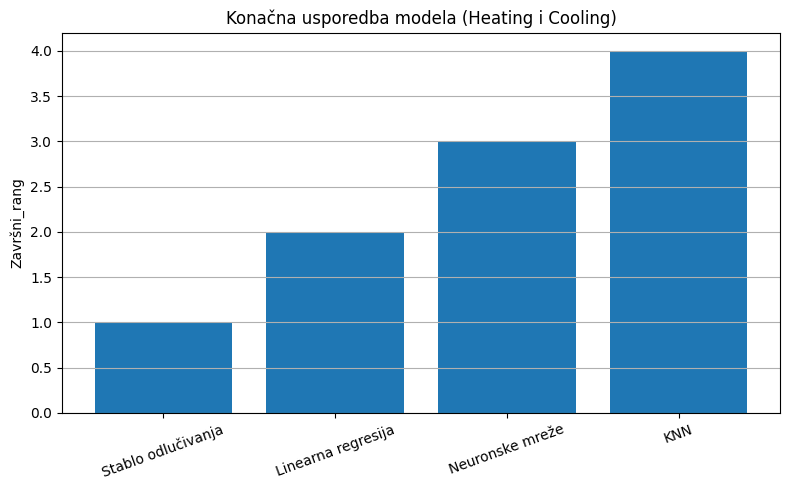

In [ ]:
#Grafički prikaz usporedbe uspješnosti regresijskih modela bez optimizace parametara prema prosječnom rangu evaluacijskih metrika
prikaz_usporedbe_modela(df_spojeno, 'Konačna usporedba modela (Heating i Cooling)', 'Završni_rang')

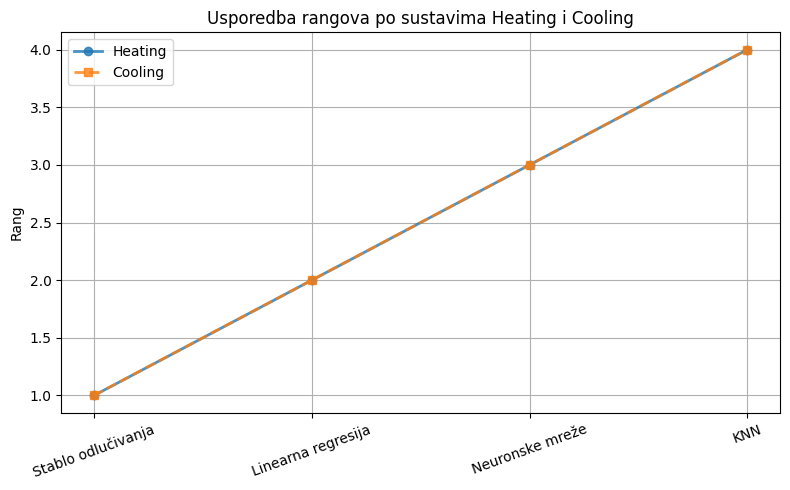

In [ ]:
# Grafička usporedba rangova modela za Heating i Cooling sustava
usporedba_heating_cooling(df_spojeno, 'Usporedba rangova po sustavima Heating i Cooling', 'Rang_Heating', 'Rang_Cooling')

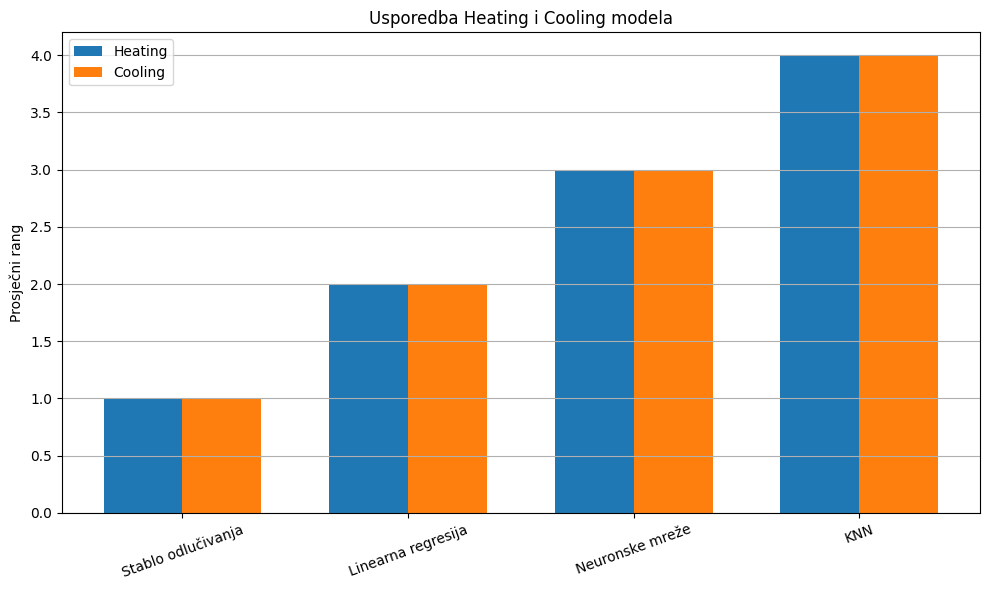

In [ ]:
#Grafički prikaz usporedbe regresijskih modela za Cooling i Heating
usporedba_He_Co = prikaz_usporedbe_rangova(df_heating, df_cooling, "Usporedba Heating i Cooling modela", "Heating", "Cooling")

In [ ]:
#Spajanje rangova za  optimizirane Cooling i za Heating
df_spojeno_Hi = izracunaj_zavrsni_rang(df_heating_Hi, df_cooling_Hi, tip="_Hi")


                Model  Rang_Heating_Hi  Rang_Cooling_Hi  Završni_rang
0  Stablo odlučivanja              1.0              1.6           1.3
1     Neuronske mreže              2.0              1.4           1.7
2  Linearna regresija              3.0              3.8           3.4
3                 KNN              4.0              3.2           3.6


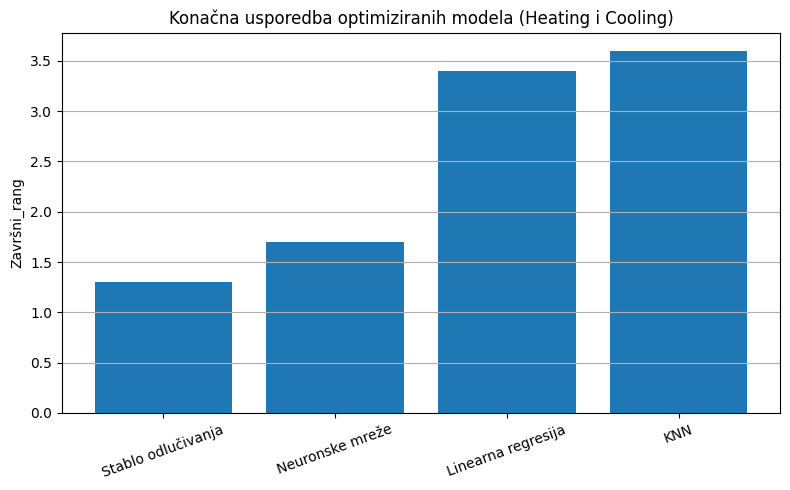

In [ ]:
#Grafički prikaz usporedbe uspješnosti regresijskih modela s optimizacijom parametara prema prosječnom rangu evaluacijskih metrika
prikaz_usporedbe_modela(df_spojeno_Hi, 'Konačna usporedba optimiziranih modela (Heating i Cooling)', 'Završni_rang')

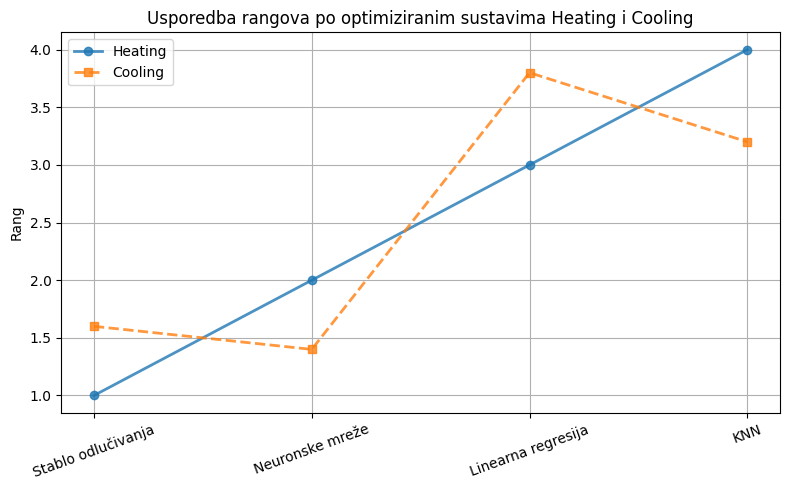

In [ ]:
# Grafička usporedba rangova optimiziranih modela za Heating i Cooling sustava
usporedba_heating_cooling(df_spojeno_Hi, 'Usporedba rangova po optimiziranim sustavima Heating i Cooling', 'Rang_Heating_Hi', 'Rang_Cooling_Hi')

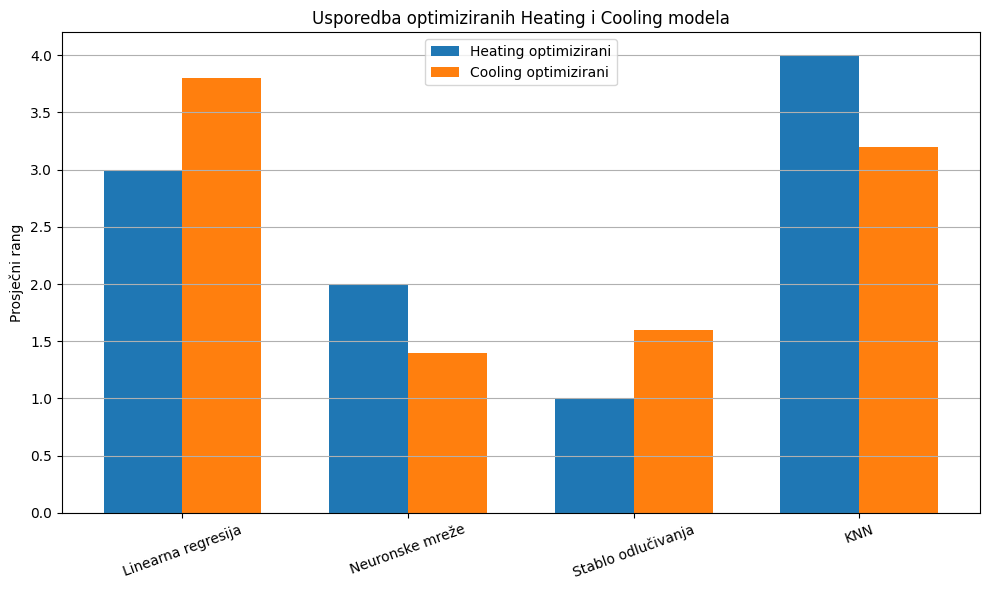

In [ ]:
#Grafički prikaz usporedbe regresijskih optimiziranih modela za Cooling i Heating
usporedba_He_Co_Hi = prikaz_usporedbe_rangova(df_heating_Hi, df_cooling_Hi, "Usporedba optimiziranih Heating i Cooling modela", "Heating optimizirani", "Cooling optimizirani")